## Contents
* Step by Step analysis
    * Analyze Step 1 when entering from home
    * Analyze Step 2 when entering from home
    * Analyze Step 3 coming from home. Also Step 4, Step 5.
* Analyze Transitions at lower level
    * WHICH end-node do they FIRST hit?
    * Where do they go AFTER hitting the FIRST end-node?
    * Where do they go AFTER hitting the SECOND end-node?
* Analyze Transitions at higher level
* Revisits
    



In [2]:
# import packages
import sys
import numpy as np
import matplotlib.pyplot as plt
sys.path.append('../src')
outdata_path = '../outdata/'

In [3]:
import parameters as p
from MM_Traj_Utils import LoadTrajFromPath, FindHomeRunNodes
from MM_Maze_Utils import NewMaze, PlotMazeFunction
from plot_utils import plot_nodes_vs_time, plot_maze_stats, plot_exploration_efficiency
import pprint as pp
from utils import convert_episodes_to_traj_class, convert_traj_to_episodes

In [4]:
from collections import defaultdict

In [5]:
%load_ext autoreload
%autoreload 2

In [6]:
%matplotlib inline

In [7]:
ma = NewMaze(6)

In [8]:
p.UnrewNames

['B5', 'B6', 'B7', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9']

In [9]:
p.subquadrant_label_dict

{15: 's',
 17: 'bs',
 16: 'o_s',
 18: 'o_bs',
 20: 's',
 22: 'bs',
 19: 'o_s',
 21: 'o_bs',
 25: 's',
 23: 'bs',
 26: 'o_s',
 24: 'o_bs',
 30: 's',
 28: 'bs',
 29: 'o_s',
 27: 'o_bs'}

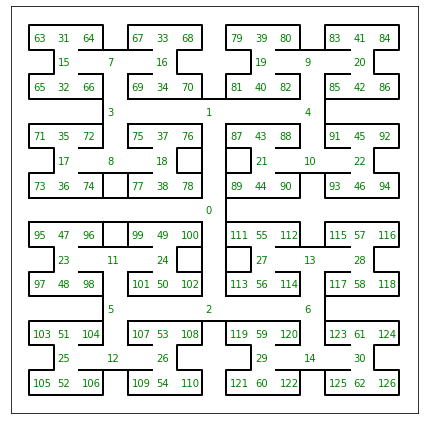

In [10]:
PlotMazeFunction([0]*127, ma, mode='nodes', numcol='g', figsize=6);

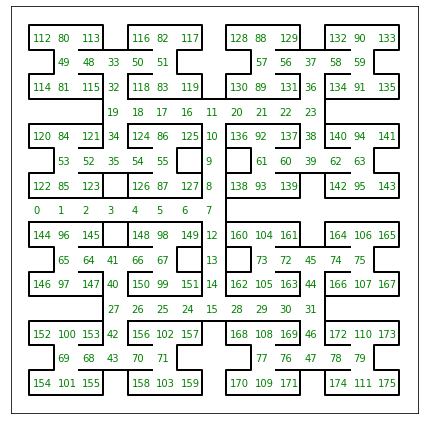

In [11]:
PlotMazeFunction([0]*176, ma, mode='cells', numcol='g', figsize=6);

# Step-by-Step analysis

## Analyze Step 1 when entering from home: 0=>1 and 0=>2

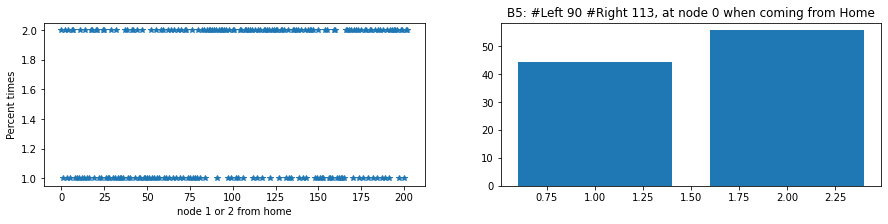

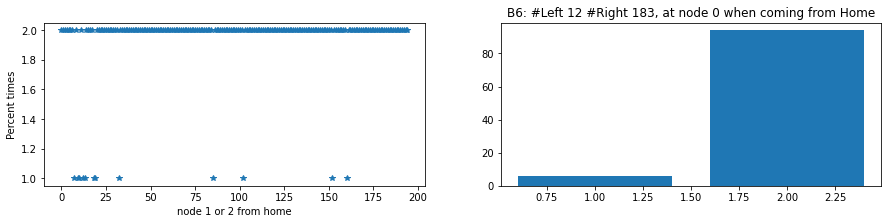

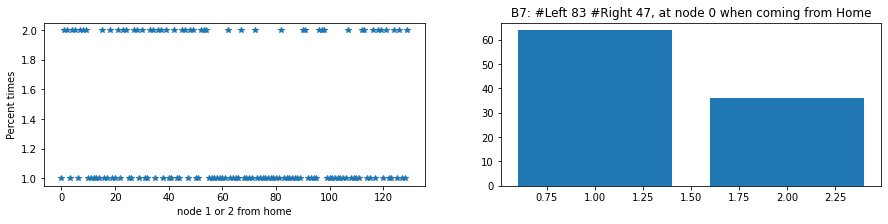

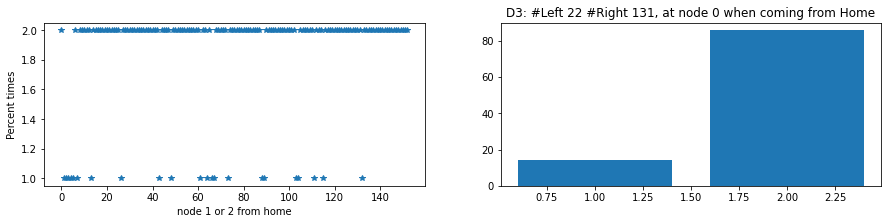

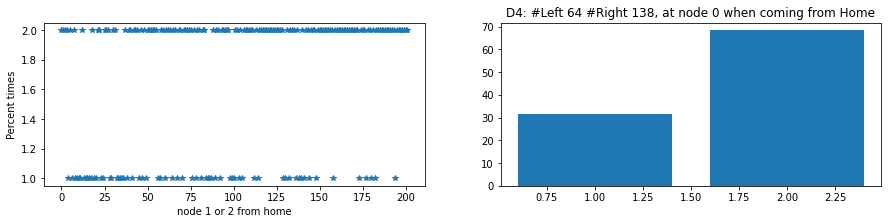

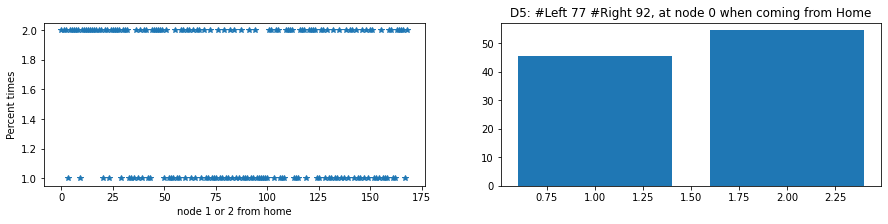

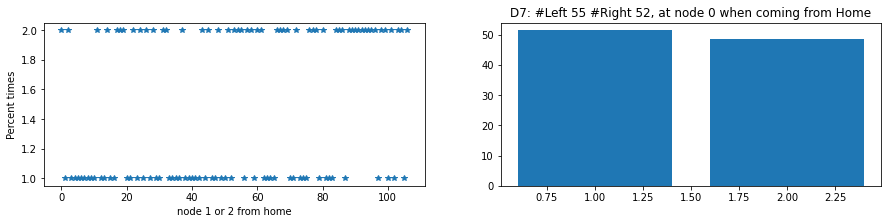

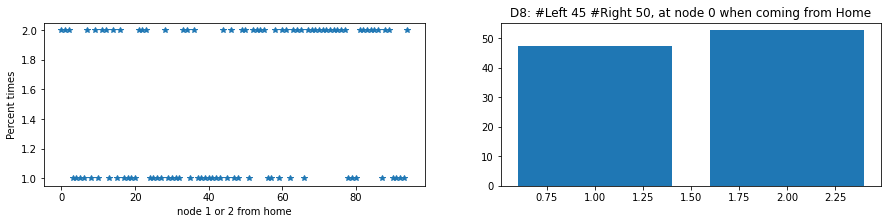

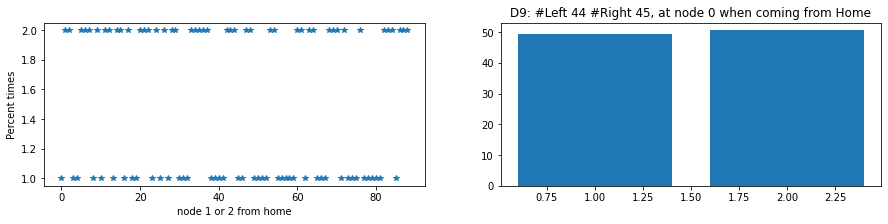

In [27]:
left_turn_pref = []
right_turn_pref = []
for sub in p.UnrewNamesSub:
    tf=LoadTrajFromPath(outdata_path + f'{sub}-tf')
    a = []
    for i, t in enumerate(tf.no):
        if (t[0, 0] == 0) and (t[1, 0] in [1, 2]):
            a.append(t[1, 0])
    fig, ax = plt.subplots(1, 2, figsize=(15, 3))
    ax[0].plot(a, '*')
    ax[0].set_xlabel('bout')
    ax[0].set_ylabel('Go 1 or Go 2')
    ax[1].set_title(f'{sub}: #Left {a.count(1)} #Right {a.count(2)}, at node 0 when coming from Home')
    total = a.count(1) + a.count(2)
    left_c = a.count(1)/total * 100
    right_c = a.count(2)/total * 100
    left_turn_pref.append(left_c)
    right_turn_pref.append(right_c)
    ax[1].bar([1, 2], [left_c, right_c])
    ax[0].set_xlabel('node 1 or 2 from home')
    ax[0].set_ylabel('Percent times')


Text(0.5, 1.0, 'Percentage turn at node 0 when coming from Home')

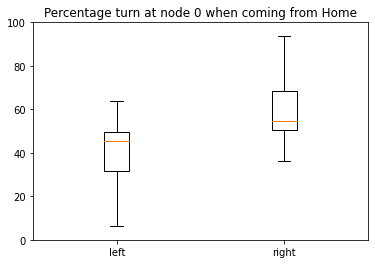

In [28]:
plt.boxplot([left_turn_pref, right_turn_pref])
plt.xticks([1, 2], ['left', 'right'])
plt.ylim([0, 100])
plt.title('Percentage turn at node 0 when coming from Home')

## Analyze Step 2 when entering from home: 1/2 => 3/4/5/6

In [49]:
def percent_turns(base_node, turn_node, left_node, right_node):
    left_turn_pref = []
    right_turn_pref = []
    for sub in p.UnrewNamesSub:
        tf=LoadTrajFromPath(outdata_path + f'{sub}-tf')
        a = []
        for i, t in enumerate(tf.no):
            if (t[0, 0] == base_node) and (t[1, 0] == turn_node) and (t[2, 0] in [left_node, right_node]):
                a.append(t[2, 0])
        
        fig, ax = plt.subplots(1, 2, figsize=(15, 3))
        ax[0].plot(a, '*')
        ax[0].set_xlabel('bout')
        ax[0].set_ylabel(f'Go {left_node} or Go {right_node}')
        ax[1].set_title(f'{sub}: #Left {a.count(left_node)} #Right {a.count(right_node)}, at node {turn_node} when coming from {base_node}')
        total = a.count(left_node) + a.count(right_node)
        left_c = a.count(left_node)/total * 100
        right_c = a.count(right_node)/total * 100
        left_turn_pref.append(left_c)
        right_turn_pref.append(right_c)
        ax[1].bar([1, 2], [left_c, right_c])
        ax[1].set_xlabel(f'node {left_node} or {right_node} from node {turn_node}')
        ax[1].set_ylabel('Percent times')
        ax[1].set_ylim([0, 100])
        plt.show()
    return left_turn_pref, right_turn_pref

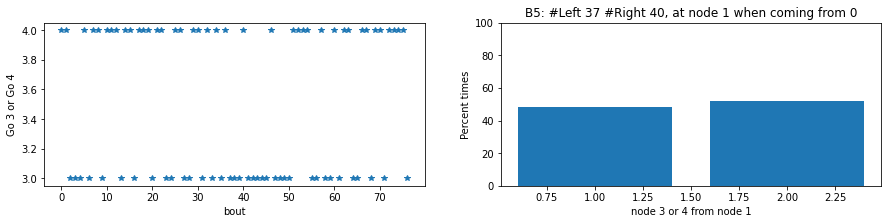

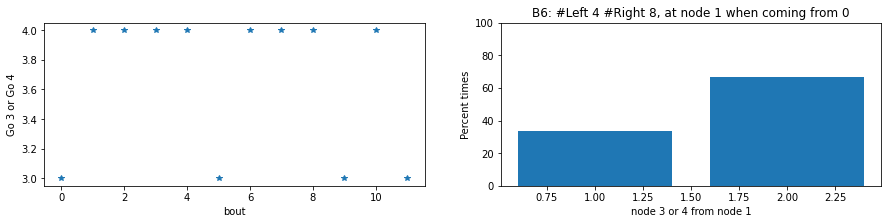

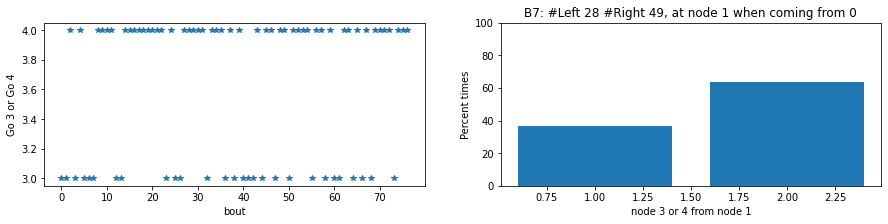

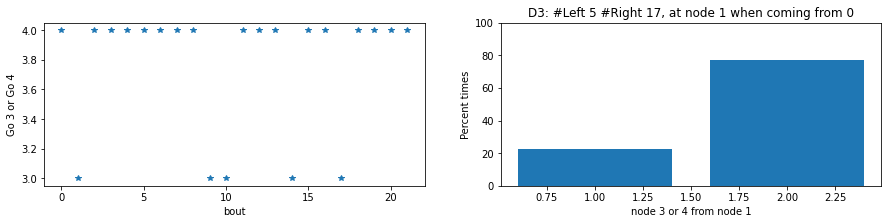

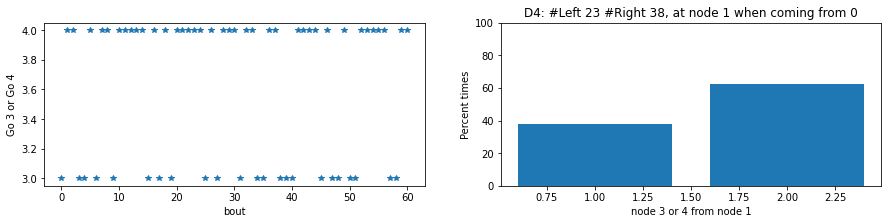

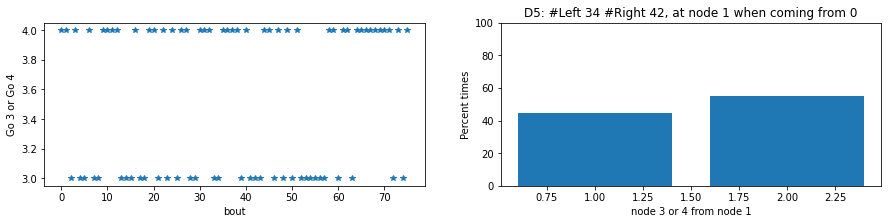

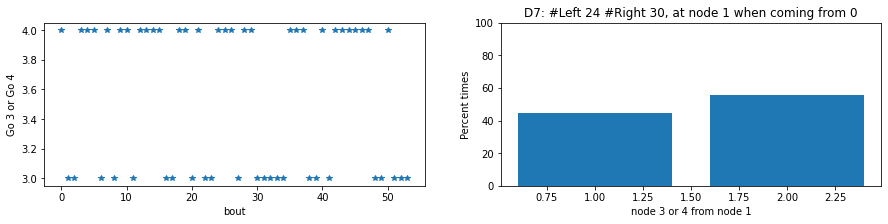

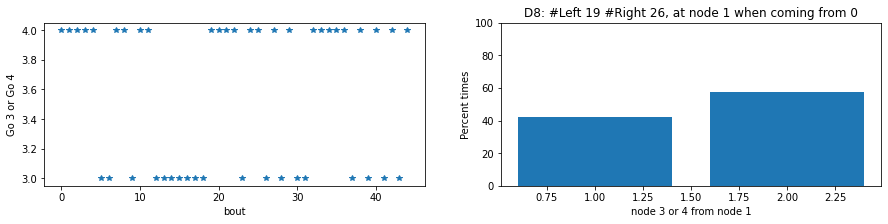

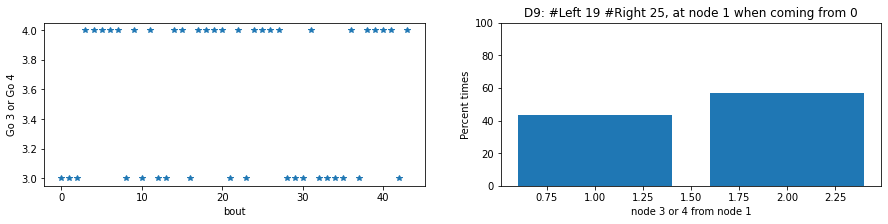

[48.05194805194805, 33.33333333333333, 36.36363636363637, 22.727272727272727, 37.704918032786885, 44.73684210526316, 44.44444444444444, 42.22222222222222, 43.18181818181818] [51.94805194805194, 66.66666666666666, 63.63636363636363, 77.27272727272727, 62.295081967213115, 55.26315789473685, 55.55555555555556, 57.77777777777777, 56.81818181818182]


Text(0.5, 1.0, 'Percentage turn at node 1 when coming from 0')

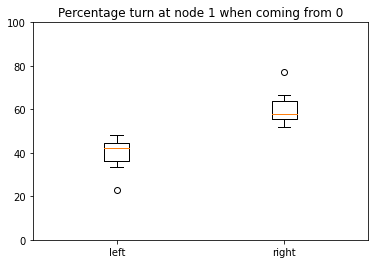

In [43]:
left_turn_pref, right_turn_pref = percent_turns(0, 1, 3, 4)
print(left_turn_pref, right_turn_pref)
plt.figure()
plt.boxplot([left_turn_pref, right_turn_pref])
plt.xticks([1, 2], ['left', 'right'])
plt.ylim([0, 100])
plt.title('Percentage turn at node 1 when coming from 0')

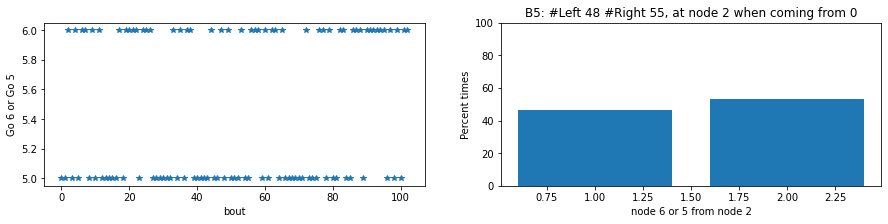

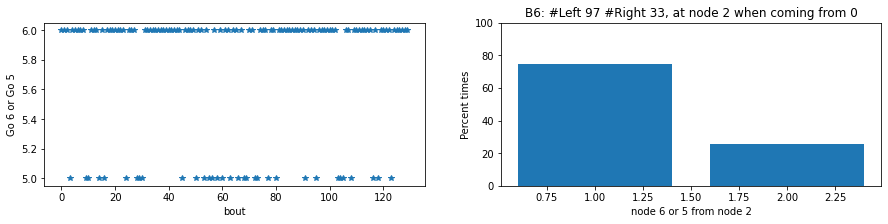

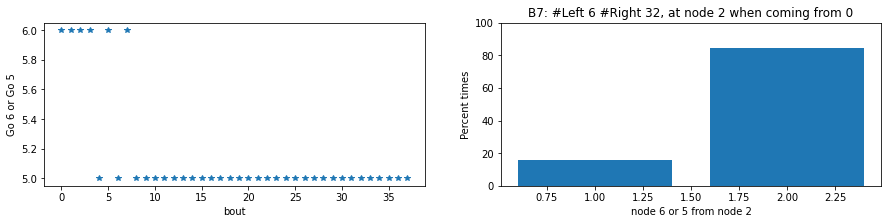

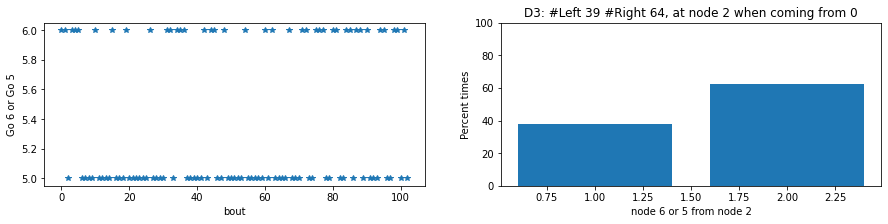

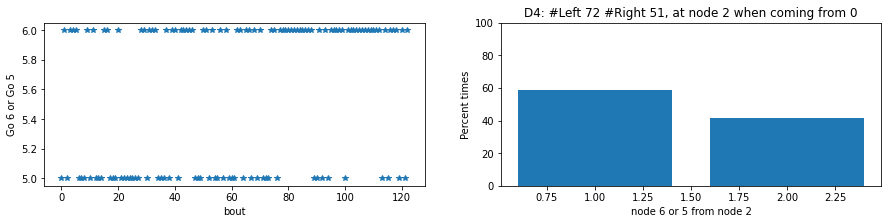

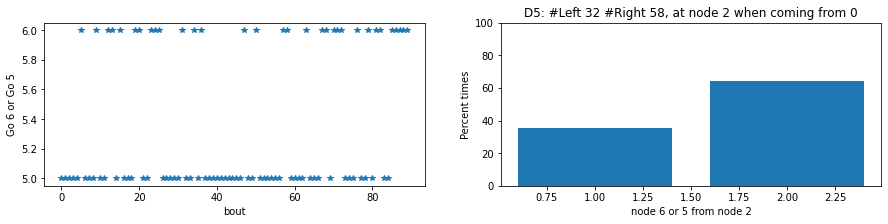

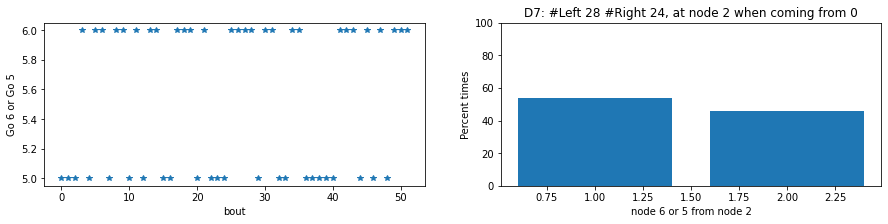

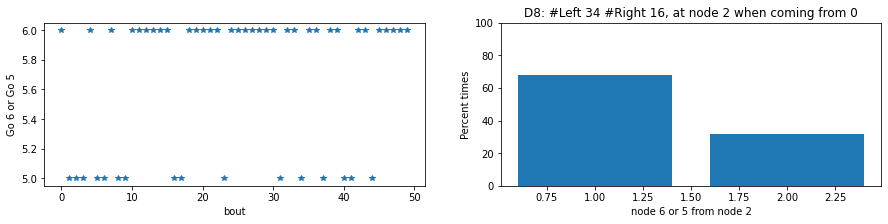

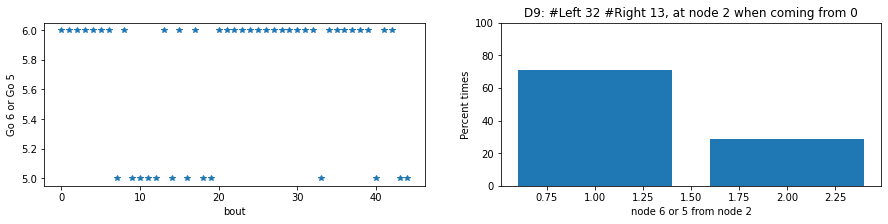

Text(0.5, 1.0, 'Percentage turn at node 2 when coming from 0')

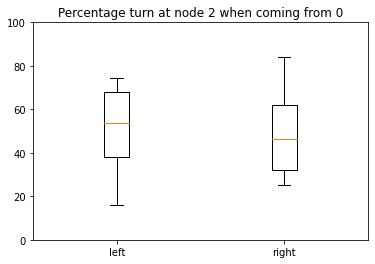

In [50]:
left_turn_pref, right_turn_pref = percent_turns(0, 2, 6, 5)
plt.figure()
plt.boxplot([left_turn_pref, right_turn_pref])
plt.xticks([1, 2], ['left', 'right'])
plt.ylim([0, 100])
plt.title('Percentage turn at node 2 when coming from 0')

## Analyze Step 3 coming from home: 3/4/5/6 => 7/8/9/10/11/12/13/14. Also Step 4, Step 5.

In [49]:
def percent_turns(node_seq, left_node, right_node, individual_plots=False):

    left_turn_pref = []
    right_turn_pref = []
    base_node = node_seq[-2]
    turn_node = node_seq[-1]
    total_samples = []
    for sub in p.UnrewNamesSub:
        tf=LoadTrajFromPath(outdata_path + f'{sub}-tf')
        a = []
        for i, t in enumerate(tf.no):
            if t[:len(node_seq), 0].tolist() == node_seq and (t[len(node_seq), 0] in [left_node, right_node]):
                a.append(t[len(node_seq), 0])
        
        if individual_plots:
            fig, ax = plt.subplots(1, 2, figsize=(15, 3))
            ax[0].plot(a, '*')
            ax[0].set_xlabel('bout')
            ax[0].set_ylabel(f'Go {left_node} or Go {right_node}')
            ax[1].set_title(f'{sub}: #Left {a.count(left_node)} #Right {a.count(right_node)}, at node {turn_node} when coming from {base_node}')
        total = a.count(left_node) + a.count(right_node)
        if total == 0: continue
        left_c = a.count(left_node)/total * 100
        right_c = a.count(right_node)/total * 100
        total_samples.append(total)
        left_turn_pref.append(left_c)
        right_turn_pref.append(right_c)
        if individual_plots:
            ax[1].bar([1, 2], [left_c, right_c])
            ax[1].set_xlabel(f'node {left_node} or {right_node} from node {turn_node}')
            ax[1].set_ylabel('Percent times')
#     print(left_turn_pref, right_turn_pref, total_samples)
    return left_turn_pref, right_turn_pref, total_samples

[0, 1, 4, 9] 19 20


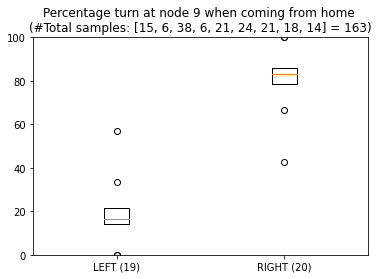

[0, 1, 4, 10] 22 21


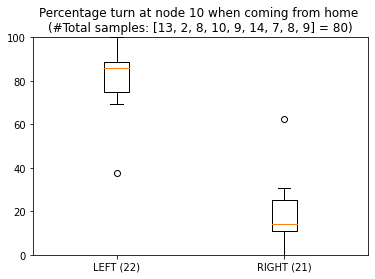

[0, 1, 3, 7] 15 16


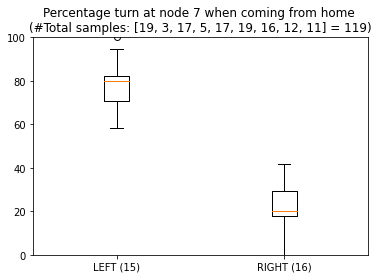

[0, 1, 3, 8] 18 17


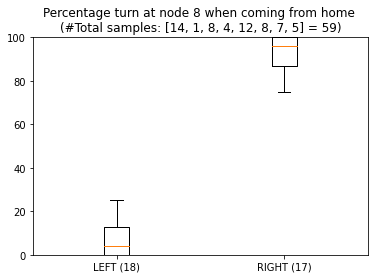

[0, 2, 6, 13] 27 28


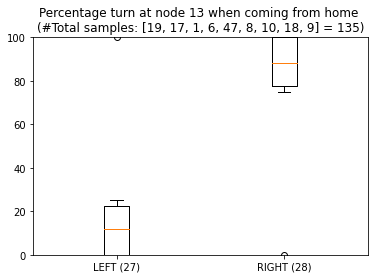

[0, 2, 6, 14] 30 29


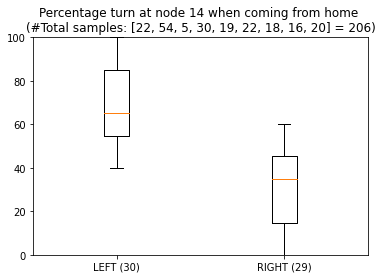

[0, 2, 5, 11] 23 24


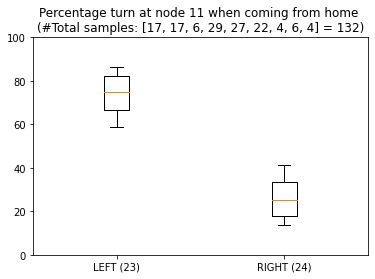

[0, 2, 5, 12] 26 25


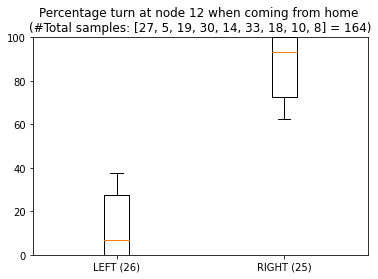

In [50]:
seqs_level3 = [([0, 1, 4], 9, 10),
        ([0, 1, 3], 8, 7),
        ([0, 2, 6], 13, 14),
        ([0, 2, 5], 12, 11),]

seqs_level4 =  [
        ([0, 1, 4, 9], 19, 20),
        ([0, 1, 4, 10], 22, 21),
        ([0, 1, 3, 7], 15, 16),
        ([0, 1, 3, 8], 18, 17),
        ([0, 2, 6, 13], 27, 28),
        ([0, 2, 6, 14], 30, 29),
        ([0, 2, 5, 11], 23, 24),
        ([0, 2, 5, 12], 26, 25),
       ]

seqs_level5 = []
for s, l, r in seqs_level4:
    if l%2 == 1:  # odd
        seqs_level5.append((s + [l], l*2+2, l*2+1))
    else:
        seqs_level5.append((s + [l], l*2+1, l*2+2))
    if r%2 == 1: # odd
        seqs_level5.append((s + [r], r*2+2, r*2+1))
    else:
        seqs_level5.append((s + [r], r*2+1, r*2+2))


for seq in seqs_level4:
    node_seq, left_node, right_node = seq
    print(node_seq, left_node, right_node)
    left_turn_pref, right_turn_pref, total_samples = percent_turns(node_seq, left_node, right_node)
    plt.figure()
    plt.boxplot([left_turn_pref, right_turn_pref])
    plt.xticks([1, 2], [f'LEFT ({left_node})', f'RIGHT ({right_node})'])
    plt.ylim([0, 100])
    plt.title(f'Percentage turn at node {node_seq[-1]} when coming from home \n(#Total samples: {total_samples} = {sum(total_samples)})')
    plt.show()
    

For the last step, Step 6, we can just use LoS analysis.

# Analyze Transitions at lower level

## Where do they go after they hit the first or subsequent endnode?

In [126]:
def locate_first_k_endnodes(bout, k, predicate_to_skip=lambda x: False):
    visits = []
    for i, n in enumerate(bout):
        if n in p.LVL_6_NODES:
            if predicate_to_skip(n):
                continue
            visits.append((i, n, p.node_quadrant_dict[n], p.node_subquadrant_dict[n], p.node_subquadrant_label_dict[n]))
            k -= 1
        if not k:
            break
    return visits

#### WHICH end-node do they FIRST hit?

In [41]:
first_visit_label_counts = defaultdict(int)
first_endnode_path_lengths = []
k=1
for sub in p.UnrewNamesSub:
    print(sub)
    tf=LoadTrajFromPath(outdata_path + f'{sub}-tf')
    for it, b in enumerate(tf.no):
        first_k_endnode_visits = locate_first_k_endnodes(b[:, 0], k, lambda x: p.node_subquadrant_dict[x] == 14) # skip reward subq since it seems to be biased
        if not first_k_endnode_visits:
            continue
#         print(first_k_endnode_visits)
        v = first_k_endnode_visits[0]
        ind, node, quad, subquad, label = v
        first_visit_label_counts[label] += 1
        first_endnode_path_lengths.append(ind)

B5
B6
B7
D3
D4
D5
D7
D8
D9


[6, 6, 8, 6, 6, 6, 10, 28, 10, 14, 6, 6, 8, 6, 6, 26, 6, 32, 6, 6, 6, 12, 6, 6, 6, 6, 10, 8, 8, 6, 6, 6, 18, 8, 8, 6, 20, 12, 14, 16, 8, 6, 12, 6, 44, 6, 12, 10, 6, 6, 6, 6, 12, 6, 6, 6, 6, 12, 6, 8, 8, 6, 6, 8, 26, 8, 6, 16, 8, 12, 22, 12, 6, 6, 6, 6, 6, 6, 6, 6, 6, 8, 6, 6, 12, 18, 12, 6, 8, 6, 14, 16, 6, 6, 12, 6, 14, 6, 6, 6, 24, 6, 12, 6, 6, 8, 10, 18, 6, 56, 6, 8, 6, 6, 6, 6, 6, 6, 8, 6, 6, 6, 6, 6, 6, 6, 18, 6, 8, 10, 28, 6, 6, 8, 6, 8, 8, 16, 64, 60, 14, 6, 22, 6, 6, 6, 6, 26, 16, 6, 18, 6, 18, 6, 8, 18, 6, 6, 6, 6, 6, 6, 16, 10, 8, 8, 6, 8, 6, 6, 6, 10, 6, 18, 16, 6, 14, 20, 16, 8, 12, 20, 24, 6, 40, 12, 22, 20, 14, 12, 14, 14, 10, 20, 30, 10, 34, 22, 8, 10, 30, 6, 8, 36, 12, 8, 10, 10, 48, 12, 14, 6, 26, 14, 6, 12, 20, 6, 8, 10, 8, 6, 6, 14, 6, 8, 8, 10, 8, 6, 18, 12, 10, 10, 22, 8, 6, 8, 10, 22, 6, 14, 10, 28, 18, 6, 34, 6, 20, 10, 6, 12, 20, 8, 6, 6, 26, 6, 6, 6, 10, 6, 6, 18, 16, 18, 12, 10, 14, 14, 10, 6, 14, 6, 6, 24, 6, 16, 6, 16, 20, 6, 20, 16, 10, 10, 6, 6, 6, 6, 6, 6

Text(0, 0.5, 'fraction')

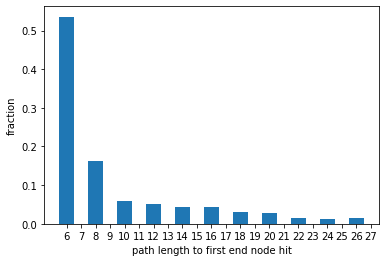

In [42]:
# Sidetracked
# After starting a bout, how quickly do they hit the first endnode?
print(first_endnode_path_lengths)
lengths = np.array(first_endnode_path_lengths)
lengths = lengths[lengths < 30]
bins = np.arange(np.min(lengths), np.max(lengths))
plt.xticks(bins+.5, bins)
plt.hist(lengths, bins=bins, density=True)
plt.xlabel('path length to first end node hit')
plt.ylabel('fraction')

60.7%	straight
24.5%	bent straight
8.2%	opposite straight
6.6%	opposite bent straight


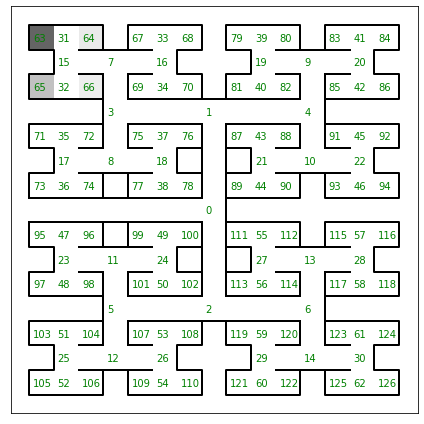

In [63]:
# normalize
factor=1.0/sum(first_visit_label_counts.values())
first_visit_label_counts = {k: v*factor for k, v in first_visit_label_counts.items() }

[print(f"{round(count*100, 1)}%\t{p.full_labels[j]}") for j, count in first_visit_label_counts.items()]

first_visit_plot = [0 for i in range(127)]
first_visit_plot[63] = first_visit_label_counts['s']    # s
first_visit_plot[64] = first_visit_label_counts['o_s']  # o_s
first_visit_plot[65] = first_visit_label_counts['bs']   # bs
first_visit_plot[66] = first_visit_label_counts['o_bs'] # o_bs
PlotMazeFunction(first_visit_plot, ma, mode='nodes', numcol='g', figsize=6);

#### Where do they go AFTER hitting the FIRST end-node?

In [129]:
label_transition_counts = defaultdict(lambda: defaultdict(int))
k=2

diffs = []
for sub in p.UnrewNamesSub:
    print(sub)
    tf=LoadTrajFromPath(outdata_path + f'{sub}-tf')
    for it, b in enumerate(tf.no):
        first_k_endnode_visits = locate_first_k_endnodes(b[:, 0], k)
        if len(first_k_endnode_visits) != k:
            continue
        print(first_k_endnode_visits)
        v1, v2 = first_k_endnode_visits
        ind1, node1, quad1, subquad1, label1 = v1
        ind2, node2, quad2, subquad2, label2 = v2
        if node1 == node2: # then, SKIP
            continue

        if subquad1 != subquad2: # then, SKIP
            continue
        print(">", v1, v2)
        label_transition_counts[label1][label2] += 1
#         if label1 == label2:
#             diffs.append(ind2-ind1+1)
#             print(v1, v2, quad1, quad2, ind2-ind1+1)

B5
[(6, 105, 3, 11, 's'), (10, 103, 3, 11, 'bs')]
> (6, 105, 3, 11, 's') (10, 103, 3, 11, 'bs')
[(6, 84, 2, 6, 's'), (10, 86, 2, 6, 'bs')]
> (6, 84, 2, 6, 's') (10, 86, 2, 6, 'bs')
[(8, 97, 3, 9, 'bs'), (12, 95, 3, 9, 's')]
> (8, 97, 3, 9, 'bs') (12, 95, 3, 9, 's')
[(6, 84, 2, 6, 's'), (18, 81, 2, 5, 'bs')]
[(6, 125, 4, 16, 'o_s'), (8, 126, 4, 16, 's')]
> (6, 125, 4, 16, 'o_s') (8, 126, 4, 16, 's')
[(6, 65, 1, 1, 'bs'), (8, 65, 1, 1, 'bs')]
[(10, 108, 3, 12, 'bs'), (18, 105, 3, 11, 's')]
[(6, 118, 4, 14, 'bs'), (8, 117, 4, 14, 'o_bs')]
> (6, 118, 4, 14, 'bs') (8, 117, 4, 14, 'o_bs')
[(10, 71, 1, 3, 'bs'), (18, 68, 1, 2, 's')]
[(14, 76, 1, 4, 'bs'), (16, 75, 1, 4, 'o_bs')]
> (14, 76, 1, 4, 'bs') (16, 75, 1, 4, 'o_bs')
[(6, 79, 2, 5, 's'), (8, 79, 2, 5, 's')]
[(6, 106, 3, 11, 'o_s'), (8, 105, 3, 11, 's')]
> (6, 106, 3, 11, 'o_s') (8, 105, 3, 11, 's')
[(8, 76, 1, 4, 'bs'), (18, 65, 1, 1, 'bs')]
[(6, 84, 2, 6, 's'), (10, 86, 2, 6, 'bs')]
> (6, 84, 2, 6, 's') (10, 86, 2, 6, 'bs')
[(6, 111, 

[(6, 124, 4, 16, 'bs'), (8, 124, 4, 16, 'bs')]
[(6, 84, 2, 6, 's'), (12, 81, 2, 5, 'bs')]
[(6, 63, 1, 1, 's'), (10, 65, 1, 1, 'bs')]
> (6, 63, 1, 1, 's') (10, 65, 1, 1, 'bs')
[(6, 94, 2, 8, 's'), (10, 92, 2, 8, 'bs')]
> (6, 94, 2, 8, 's') (10, 92, 2, 8, 'bs')
[(6, 84, 2, 6, 's'), (8, 84, 2, 6, 's')]
[(6, 94, 2, 8, 's'), (20, 105, 3, 11, 's')]
[(6, 126, 4, 16, 's'), (8, 126, 4, 16, 's')]
[(14, 84, 2, 6, 's'), (16, 83, 2, 6, 'o_s')]
> (14, 84, 2, 6, 's') (16, 83, 2, 6, 'o_s')
[(6, 105, 3, 11, 's'), (8, 106, 3, 11, 'o_s')]
> (6, 105, 3, 11, 's') (8, 106, 3, 11, 'o_s')
[(10, 86, 2, 6, 'bs'), (14, 86, 2, 6, 'bs')]
[(6, 126, 4, 16, 's'), (8, 125, 4, 16, 'o_s')]
> (6, 126, 4, 16, 's') (8, 125, 4, 16, 'o_s')
[(6, 124, 4, 16, 'bs'), (8, 123, 4, 16, 'o_bs')]
> (6, 124, 4, 16, 'bs') (8, 123, 4, 16, 'o_bs')
[(12, 113, 4, 13, 'bs'), (22, 95, 3, 9, 's')]
[(6, 94, 2, 8, 's'), (14, 84, 2, 6, 's')]
[(6, 95, 3, 9, 's'), (16, 105, 3, 11, 's')]
[(8, 97, 3, 9, 'bs'), (12, 96, 3, 9, 'o_s')]
> (8, 97, 3, 9, 

[(8, 105, 3, 11, 's'), (10, 105, 3, 11, 's')]
[(6, 105, 3, 11, 's'), (8, 105, 3, 11, 's')]
[(6, 100, 3, 10, 's'), (10, 102, 3, 10, 'bs')]
> (6, 100, 3, 10, 's') (10, 102, 3, 10, 'bs')
[(8, 86, 2, 6, 'bs'), (10, 85, 2, 6, 'o_bs')]
> (8, 86, 2, 6, 'bs') (10, 85, 2, 6, 'o_bs')
[(6, 95, 3, 9, 's'), (10, 97, 3, 9, 'bs')]
> (6, 95, 3, 9, 's') (10, 97, 3, 9, 'bs')
[(14, 95, 3, 9, 's'), (16, 96, 3, 9, 'o_s')]
> (14, 95, 3, 9, 's') (16, 96, 3, 9, 'o_s')
[(6, 125, 4, 16, 'o_s'), (12, 121, 4, 15, 's')]
[(6, 105, 3, 11, 's'), (10, 103, 3, 11, 'bs')]
> (6, 105, 3, 11, 's') (10, 103, 3, 11, 'bs')
[(12, 113, 4, 13, 'bs'), (20, 126, 4, 16, 's')]
[(6, 79, 2, 5, 's'), (10, 81, 2, 5, 'bs')]
> (6, 79, 2, 5, 's') (10, 81, 2, 5, 'bs')
[(8, 105, 3, 11, 's'), (12, 104, 3, 11, 'o_bs')]
> (8, 105, 3, 11, 's') (12, 104, 3, 11, 'o_bs')
[(6, 119, 4, 15, 'bs'), (8, 120, 4, 15, 'o_bs')]
> (6, 119, 4, 15, 'bs') (8, 120, 4, 15, 'o_bs')
[(6, 95, 3, 9, 's'), (10, 98, 3, 9, 'o_bs')]
> (6, 95, 3, 9, 's') (10, 98, 3, 9, 'o

[(8, 63, 1, 1, 's'), (10, 63, 1, 1, 's')]
[(8, 111, 4, 13, 's'), (10, 111, 4, 13, 's')]
[(6, 126, 4, 16, 's'), (10, 124, 4, 16, 'bs')]
> (6, 126, 4, 16, 's') (10, 124, 4, 16, 'bs')
[(6, 70, 1, 2, 'bs'), (14, 74, 1, 3, 'o_s')]
[(6, 63, 1, 1, 's'), (22, 71, 1, 3, 'bs')]
[(6, 121, 4, 15, 's'), (8, 121, 4, 15, 's')]
[(6, 126, 4, 16, 's'), (8, 125, 4, 16, 'o_s')]
> (6, 126, 4, 16, 's') (8, 125, 4, 16, 'o_s')
[(6, 121, 4, 15, 's'), (14, 116, 4, 14, 's')]
[(6, 94, 2, 8, 's'), (8, 94, 2, 8, 's')]
[(6, 121, 4, 15, 's'), (16, 116, 4, 14, 's')]
[(6, 94, 2, 8, 's'), (10, 93, 2, 8, 'o_s')]
> (6, 94, 2, 8, 's') (10, 93, 2, 8, 'o_s')
[(8, 123, 4, 16, 'o_bs'), (16, 116, 4, 14, 's')]
[(6, 100, 3, 10, 's'), (8, 99, 3, 10, 'o_s')]
> (6, 100, 3, 10, 's') (8, 99, 3, 10, 'o_s')
[(6, 94, 2, 8, 's'), (8, 93, 2, 8, 'o_s')]
> (6, 94, 2, 8, 's') (8, 93, 2, 8, 'o_s')
[(8, 123, 4, 16, 'o_bs'), (20, 79, 2, 5, 's')]
[(8, 109, 3, 12, 'o_s'), (10, 109, 3, 12, 'o_s')]
[(6, 79, 2, 5, 's'), (10, 81, 2, 5, 'bs')]
> (6, 79

In [137]:
# Sidetracked

# Probability of returning to the same end-node after x steps in the initial phase of each bout
# Specifically, checking for the repetition of the first end-node visited in each bout
# Obtained using [if node1 != node2: continue]

# diffs = np.array(diffs)
# bins = np.arange(np.min(diffs), np.max(diffs))
# plt.xticks(bins-.5, bins)
# plt.hist(diffs, bins=bins, density=True)
# plt.xlabel('x steps')
# plt.show()

label_transition_counts:

straight counts => dict_items([('bs', 126), ('o_s', 253), ('o_bs', 29)])
Starting from 'straight' to:
  31%	bent straight
  62%	opposite straight
  7%	opposite bent straight


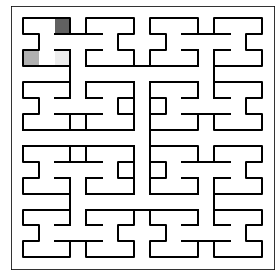

bent straight counts => dict_items([('s', 48), ('o_bs', 89), ('o_s', 10)])
Starting from 'bent straight' to:
  33%	straight
  61%	opposite bent straight
  7%	opposite straight


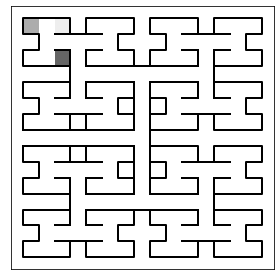

opposite straight counts => dict_items([('s', 45), ('bs', 6), ('o_bs', 2)])
Starting from 'opposite straight' to:
  85%	straight
  11%	bent straight
  4%	opposite bent straight


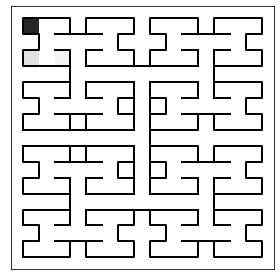

opposite bent straight counts => dict_items([('bs', 13), ('s', 5)])
Starting from 'opposite bent straight' to:
  72%	bent straight
  28%	straight


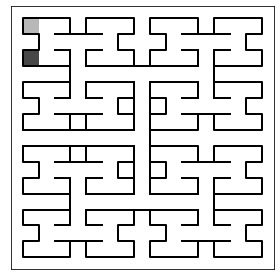

In [130]:
print("label_transition_counts:\n")
# print(label_transition_counts)
for i, c in label_transition_counts.items():
    print(p.full_labels[i], "counts =>", c.items())
    factor=1.0/sum(c.values())
    c = {k: v*factor for k, v in c.items()} # normalize
    print(f"Starting from '{p.full_labels[i]}' to:")
    [print(f"  {round(count*100)}%\t{p.full_labels[j]}") for j, count in c.items()]

    label_transition_plot = [0 for i in range(127)]
    label_transition_plot[63] = c.get('s', 0) # s
    label_transition_plot[64] = c.get('o_s', 0)  # o_s
    label_transition_plot[65] = c.get('bs', 0) # bs
    label_transition_plot[66] = c.get('o_bs', 0)  # o_bs
    
    # to represent "other" subquadrants
#     label_transition_plot[68] = c.get('s', 0)    # s
#     label_transition_plot[67] = c.get('o_s', 0)  # o_s
#     label_transition_plot[70] = c.get('bs', 0)   # bs
#     label_transition_plot[69] = c.get('o_bs', 0) # o_bs

    PlotMazeFunction(label_transition_plot, ma,mode='nodes',numcol=None, figsize=4);
    plt.show()

#### Where do they go after hitting the SECOND end-node?

In [133]:
label_transition_counts = defaultdict(lambda: defaultdict(int))
k=3
diffs = []
for sub in p.UnrewNamesSub:
    print(sub)
    tf=LoadTrajFromPath(outdata_path + f'{sub}-tf')
    for it, b in enumerate(tf.no):
        first_k_endnode_visits = locate_first_k_endnodes(b[:, 0], k)
        if len(first_k_endnode_visits) != k:
            continue

#         print(first_k_endnode_visits)
        v1, v2, v3 = first_k_endnode_visits
        ind1, node1, quad1, subquad1, label1 = v1
        ind2, node2, quad2, subquad2, label2 = v2
        ind3, node3, quad3, subquad3, label3 = v3
        
        if (node1 == node2) or (node2 == node3): # then, SKIP
            # Note: node 1 and node 3 can be same
            continue
        if not ((subquad1 == subquad2) and (subquad2 == subquad3)): # then, SKIP
            continue
        
        label_transition_counts[f"{label1}-{label2}"][label3] += 1
#         if label1 == label2:
#             diffs.append(ind2-ind1+1)
#             print(v1, v2, quad1, quad2, ind2-ind1+1)

B5
B6
B7
D3
D4
D5
D7
D8
D9


In [135]:
# plotted manually in google slides

print("label_transition_counts:\n")
print(label_transition_counts)
print()

for i, c in sorted(label_transition_counts.items(), reverse=True):
    print(i, "counts =>", c.items())

    factor=1.0/sum(c.values())
    c = {k: v*factor for k, v in c.items()} # normalize

#     print(f"Starting from '{p.full_labels[i]}', after 2 steps, to:")
    [print(f"  {round(count*100, 1)}%\t{p.full_labels[j]}") for j, count in c.items()]
    label_transition_plot = [0 for i in range(127)]

    label_transition_plot[63] = c.get('s', 0)    # s
    label_transition_plot[64] = c.get('o_s', 0)  # o_s
    label_transition_plot[65] = c.get('bs', 0)   # bs
    label_transition_plot[66] = c.get('o_bs', 0) # o_bs

    # to represent "other" subquadrants
#     label_transition_plot[68] = c.get('s', 0)    # s
#     label_transition_plot[67] = c.get('o_s', 0)  # o_s
#     label_transition_plot[70] = c.get('bs', 0)   # bs
#     label_transition_plot[69] = c.get('o_bs', 0) # o_bs

    print()

label_transition_counts:

defaultdict(<function <lambda> at 0x12be4d9d0>, {'s-bs': defaultdict(<class 'int'>, {'o_bs': 61, 's': 16, 'o_s': 5}), 'bs-s': defaultdict(<class 'int'>, {'o_s': 20, 'o_bs': 1, 'bs': 2}), 'o_s-s': defaultdict(<class 'int'>, {'bs': 7, 'o_s': 15, 'o_bs': 4}), 'bs-o_bs': defaultdict(<class 'int'>, {'bs': 18, 'o_s': 2, 's': 2}), 'o_bs-s': defaultdict(<class 'int'>, {'o_s': 2}), 's-o_s': defaultdict(<class 'int'>, {'o_bs': 11, 's': 50, 'bs': 9}), 'bs-o_s': defaultdict(<class 'int'>, {'s': 3, 'o_bs': 1}), 'o_s-bs': defaultdict(<class 'int'>, {'o_bs': 3, 's': 1}), 'o_bs-bs': defaultdict(<class 'int'>, {'o_bs': 6}), 's-o_bs': defaultdict(<class 'int'>, {'bs': 3})})

s-o_s counts => dict_items([('o_bs', 11), ('s', 50), ('bs', 9)])
  15.7%	opposite bent straight
  71.4%	straight
  12.9%	bent straight

s-o_bs counts => dict_items([('bs', 3)])
  100.0%	bent straight

s-bs counts => dict_items([('o_bs', 61), ('s', 16), ('o_s', 5)])
  74.4%	opposite bent straight
  19.5%	str

# Analyze Transitions at higher level

In [49]:
# def locate_first_k_endnode_subq(bout, k):
#     visits = []
#     prev_q = None
#     for i, n in enumerate(bout):
#         if n in p.LVL_6_NODES:
#             q = p.node_quadrant_dict[n]
#             if prev_q is not None and q != prev_q: break
#             subq = p.node_subquadrant_dict[n]
#             if subq == 14: break
#             visits.append((i, n, q, subq, p.subquadrant_label_dict[subq]))
#             prev_q = q
#             k -= 1
#         if not k:
#             break
#     return visits

In [166]:
def locate_first_k_subqs(bout, k):
    # using any node in that subq (only level4, 5, 6 nodes are in a subq, rest aren't considered to be a part)
    visits = []
    prev_q = None
    prev_subq = None
#     print("len(bout)", len(bout))
    for i, n in enumerate(bout):
        current_subq = p.node_subquadrant_dict.get(n, None)
        if not current_subq or current_subq == 14:
            continue
        current_q = p.node_quadrant_dict[n]
        if current_subq != prev_subq: 
            visits.append((i, n, current_q, current_subq, p.subquadrant_label_dict[current_subq]))
            k -= 1
            if not k: break
        prev_q = current_q
        prev_subq = current_subq
#     if i == len(bout)-1: print("traj over")
    return visits

B5
total bouts 245
B6
total bouts 223
B7
total bouts 204
D3
total bouts 245
D4
total bouts 319
D5
total bouts 180
D7
total bouts 150
D8
total bouts 109
D9
total bouts 102
defaultdict(<class 'int'>, {'s': 645, 'bs': 242, 'o_bs': 111, 'o_s': 163})
55.6%	straight
20.8%	bent straight
9.6%	opposite bent straight
14.0%	opposite straight


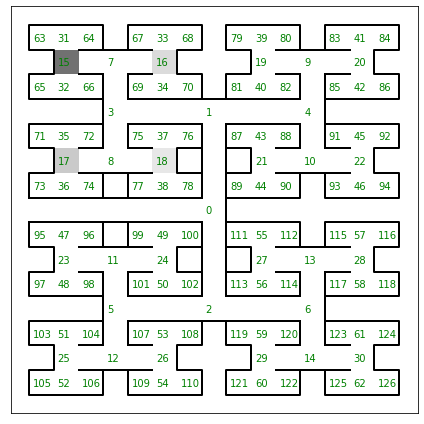

In [168]:
k=1
first_visit_label_counts = defaultdict(int)
for sub in p.UnrewNamesSub:
    print(sub)
    tf=LoadTrajFromPath(outdata_path + f'{sub}-tf')
    print("total bouts", len(tf.no))
    for it, b in enumerate(tf.no):
        first_k_subq_visits = locate_first_k_subqs(b[:, 0], k)
        first_k_subq_visits = np.array(first_k_subq_visits)
        if len(first_k_subq_visits) < k: continue
#         print("first_k_subq_visits", first_k_subq_visits)
        ind, node, quad, subquad, subq_label = first_k_subq_visits[0]
        first_visit_label_counts[subq_label] += 1
#         print()

# normalize
print(first_visit_label_counts)
factor=1.0/sum(first_visit_label_counts.values())
first_visit_label_counts = {k: v*factor for k, v in first_visit_label_counts.items() }

[print(f"{round(count*100, 1)}%\t{p.full_labels[j]}") for j, count in first_visit_label_counts.items()]

first_visit_plot = [0 for i in range(127)]
first_visit_plot[15] = first_visit_label_counts['s']    # s
first_visit_plot[16] = first_visit_label_counts['o_s']  # o_s
first_visit_plot[17] = first_visit_label_counts['bs']   # bs
first_visit_plot[18] = first_visit_label_counts['o_bs'] # o_bs
PlotMazeFunction(first_visit_plot, ma, mode='nodes', numcol='g', figsize=6);

B5
total bouts 245
B6
total bouts 223
B7
total bouts 204
D3
total bouts 245
D4
total bouts 319
D5
total bouts 180
D7
total bouts 150
D8
total bouts 109
D9
total bouts 102
label_transition_counts:

opposite bent straight (o_bs) counts => dict_items([('o_s', 3), ('bs', 12), ('s', 29), ('o_bs', 5)])
From 'opposite bent straight (o_bs)' to:
  6%	opposite straight (o_s)
  24%	bent straight (bs)
  59%	straight (s)
  10%	opposite bent straight (o_bs)


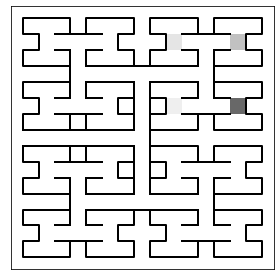

opposite straight (o_s) counts => dict_items([('s', 28), ('bs', 13), ('o_s', 7), ('o_bs', 3)])
From 'opposite straight (o_s)' to:
  55%	straight (s)
  25%	bent straight (bs)
  14%	opposite straight (o_s)
  6%	opposite bent straight (o_bs)


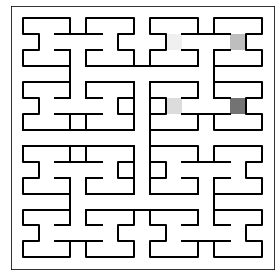

straight (s) counts => dict_items([('s', 149), ('o_s', 42), ('bs', 33), ('o_bs', 19)])
From 'straight (s)' to:
  61%	straight (s)
  17%	opposite straight (o_s)
  14%	bent straight (bs)
  8%	opposite bent straight (o_bs)


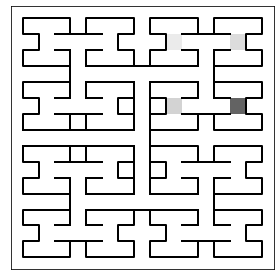

bent straight (bs) counts => dict_items([('s', 42), ('o_s', 17), ('o_bs', 4), ('bs', 13)])
From 'bent straight (bs)' to:
  55%	straight (s)
  22%	opposite straight (o_s)
  5%	opposite bent straight (o_bs)
  17%	bent straight (bs)


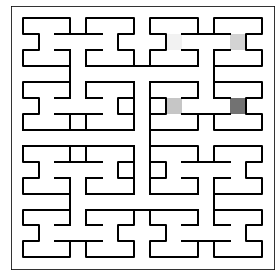

In [173]:
label_transition_counts = defaultdict(lambda: defaultdict(int))
k=2

in_same_quadrant = False

for sub in p.UnrewNamesSub:
    print(sub)
    tf=LoadTrajFromPath(outdata_path + f'{sub}-tf')
    print("total bouts", len(tf.no))
    for it, b in enumerate(tf.no):
        first_k_subq_visits = locate_first_k_subqs(b[:, 0], k)
        if len(first_k_subq_visits) < k: continue
#         print("first_k_subq_visits", first_k_subq_visits)

        v1, v2 = first_k_subq_visits
        ind1, node1, quad1, subquad1, label1 = v1
        ind2, node2, quad2, subquad2, label2 = v2
        
        if in_same_quadrant:
            if quad1 != quad2: # then, SKIP
                continue
        else:
            if quad1 == quad2: # then, SKIP
                continue
        label_transition_counts[label1][label2] += 1
#         print()

print("label_transition_counts:\n")
# print(label_transition_counts)
for i, c in label_transition_counts.items():
    print(p.full_labels[i], f"({i})", "counts =>", c.items())
    factor=1.0/sum(c.values())
    c = {k: v*factor for k, v in c.items()} # normalize
    print(f"From '{p.full_labels[i]} ({i})' to:")
    [print(f"  {round(count*100)}%\t{p.full_labels[j]} ({j})") for j, count in c.items()]

    label_transition_plot = [0 for i in range(127)]
    
    if in_same_quadrant:
        label_transition_plot[15] = c.get('s', 0) # s
        label_transition_plot[16] = c.get('o_s', 0)  # o_s
        label_transition_plot[17] = c.get('bs', 0) # bs
        label_transition_plot[18] = c.get('o_bs', 0)  # o_bs
    else:
    # to represent "other" quadrants
        label_transition_plot[22] = c.get('s', 0)    # s
        label_transition_plot[21] = c.get('o_s', 0)  # o_s
        label_transition_plot[20] = c.get('bs', 0)   # bs
        label_transition_plot[19] = c.get('o_bs', 0) # o_bs

    PlotMazeFunction(label_transition_plot, ma, mode='nodes',numcol=None, figsize=4);
    plt.show()

## Revisits

### Number of nodes between revisits to node 0

In [12]:
def get_revisits(sub, phase='all'):
    tf=LoadTrajFromPath(outdata_path + f'{sub}-tf')
    revisits = defaultdict(list)
    
    if phase == 'all':
        trajs = tf.no
    elif phase == 'first_half':
        trajs = tf.no[:len(tf.no)//2]
    elif phase == 'second_half':
        trajs = tf.no[len(tf.no)//2:]
    elif phase == 'first_third':
        trajs = tf.no[:len(tf.no)//3]
    elif phase == 'second_third':
        trajs = tf.no[len(tf.no)//3:2*len(tf.no)//3]
    elif phase == 'third_third':
        trajs = tf.no[2*len(tf.no)//3:]
    elif isinstance(phase, int):
        trajs = tf.no[:phase]
    else:
        raise Exception(f'wrong phase specified: {phase}')
    
    for t in trajs:
        node_seq = t[:, 0]
        for node in p.ALL_VISITABLE_NODES:
            visits_node = np.where(node_seq == node)[0]
            if len(visits_node) >= 2:
                revisits[node] += list(np.diff(visits_node) - 1)
    return revisits

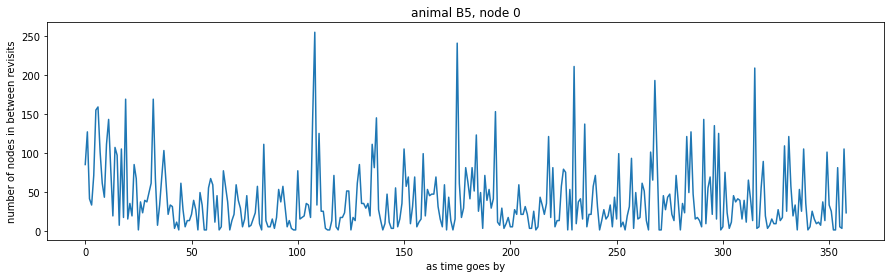

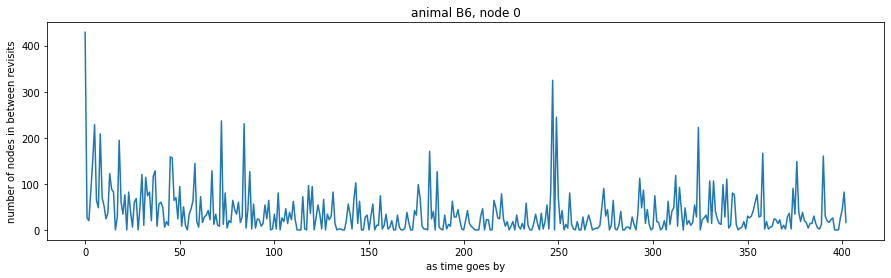

In [13]:
for sub in p.UnrewNamesSub[:2]:
    revisit = get_revisits(sub)
    for node in [0]:
        total = len(revisit[node])
#         print(node, revisit[node], total)
        plt.figure(figsize=(15, 4))
        plt.plot(range(len(revisit[node])), revisit[node])
        plt.title(f"animal {sub}, node {node}")
        plt.xlabel("as time goes by")
        plt.ylabel("number of nodes in between revisits")
        plt.show()

### Number of end-nodes between revisits to node N

In [48]:
def get_end_nodes_revisits(sub, phase='all'):
    tf=LoadTrajFromPath(outdata_path + f'{sub}-tf')
    revisits = defaultdict(list)

    if phase == 'all':
        trajs = tf.no
    elif phase == 'first_half':
        trajs = tf.no[:len(tf.no)//2]
    elif phase == 'second_half':
        trajs = tf.no[len(tf.no)//2:]
    elif phase == 'first_third':
        trajs = tf.no[:len(tf.no)//3]
    elif phase == 'second_third':
        trajs = tf.no[len(tf.no)//3:2*len(tf.no)//3]
    elif phase == 'third_third':
        trajs = tf.no[2*len(tf.no)//3:]
    elif isinstance(phase, int):
        trajs = tf.no[:phase]

    for t in trajs:
        orig_node_seq = t[:, 0]
        for node in p.ALL_VISITABLE_NODES:
            node_seq = np.array(list(filter(lambda x: x == node or x in p.LVL_6_NODES, orig_node_seq)))
            visits_node = np.where(node_seq == node)[0]
            if len(visits_node) >= 2:
                revisits[node] += list(np.diff(visits_node) - 1)
    return revisits

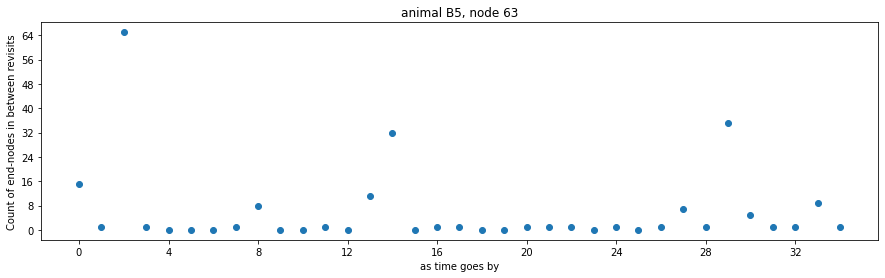

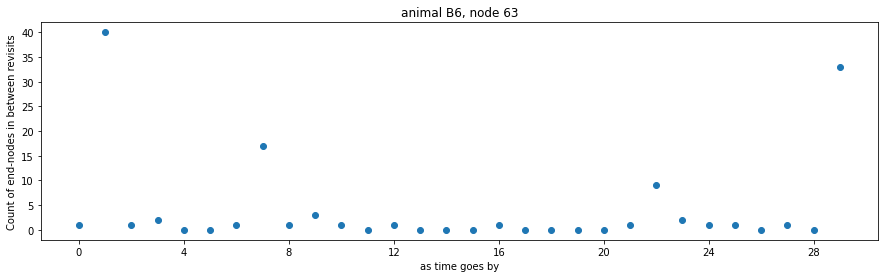

In [49]:
from matplotlib.ticker import MaxNLocator
N = 63
for sub in p.UnrewNamesSub[:2]:
    end_nodes_revisit = get_end_nodes_revisits(sub)
#     print(count_end_nodes_revisit[0])
    for node in [N]:
        revisits = end_nodes_revisit[node]
        total = len(revisits)
#         print(total)
        plt.figure(figsize=(15, 4))
        plt.plot(range(total), revisits, 'o')
        plt.title(f"animal {sub}, node {node}")
        plt.xlabel("as time goes by")
#         plt.ylim([-1, 10])
        plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
        plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
        plt.ylabel("Count of end-nodes in between revisits")
        plt.show()

### Analyze revisits to each node - fraction of different kinds of revisits (that differ by number of nodes in between)

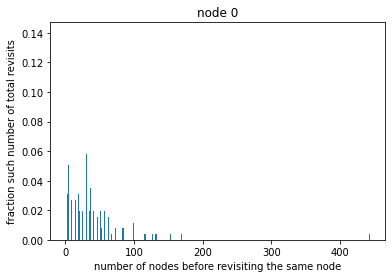

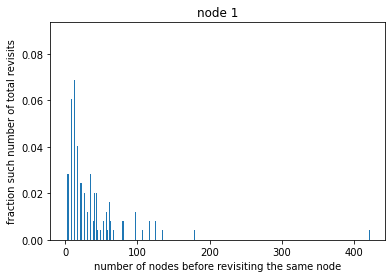

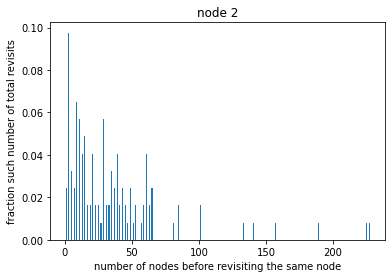

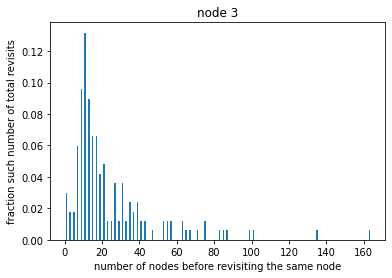

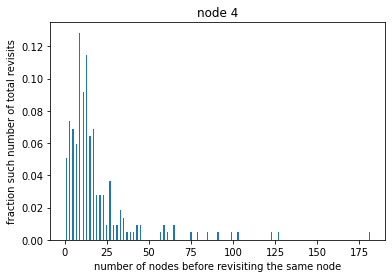

...

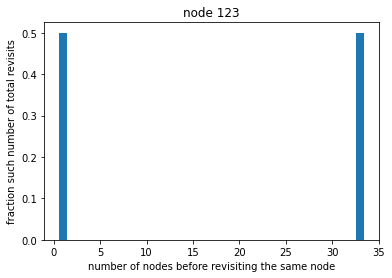

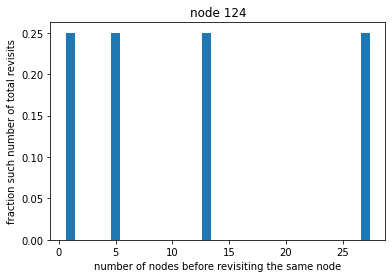

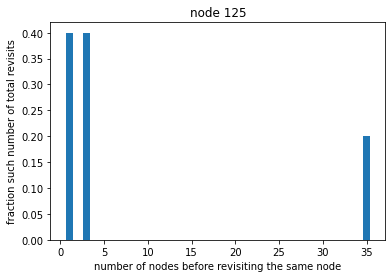

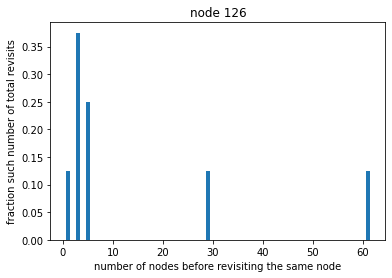

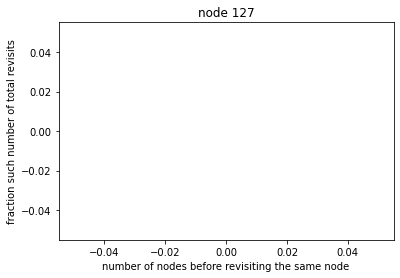

In [82]:
# Plot each node

revisit = get_revisits('B7', 'all')
for node in p.ALL_VISITABLE_NODES:
#     print(node, revisit[node])
    total = len(revisit[node])
    d = {x: revisit[node].count(x)/total for x in revisit[node]}
    plt.bar(d.keys(), d.values())
    plt.title(f"node {node}")
    plt.xlabel("number of nodes before revisiting the same node")
    plt.ylabel("fraction such number of total revisits")
#     plt.xlim([0, 50])
    plt.show()

### Analyze revisits to each node, grouped by level, all time

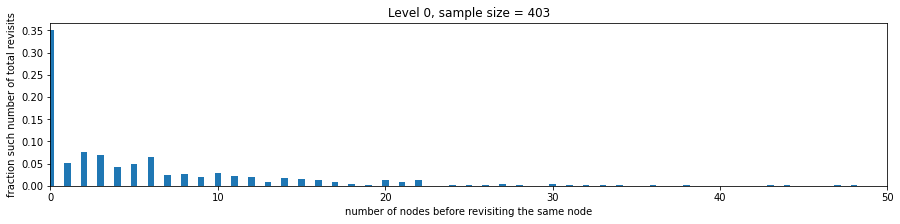

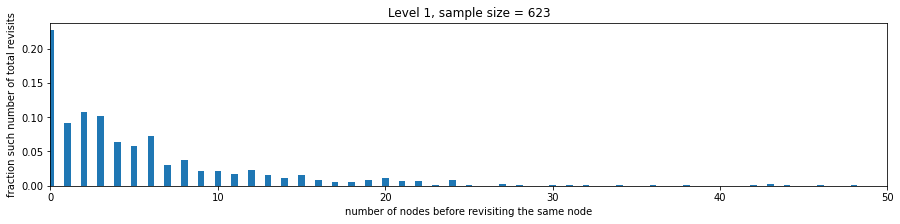

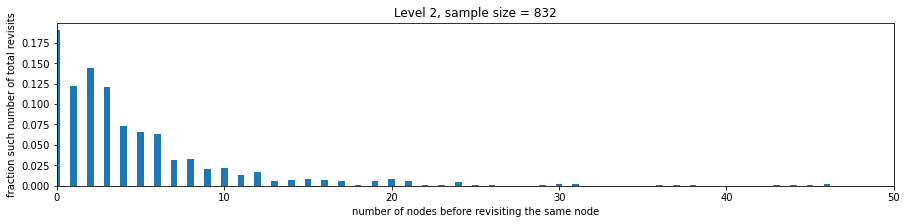

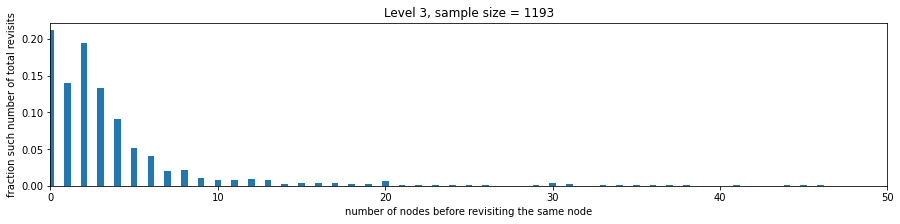

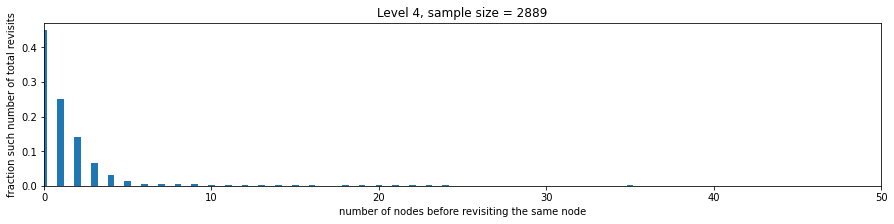

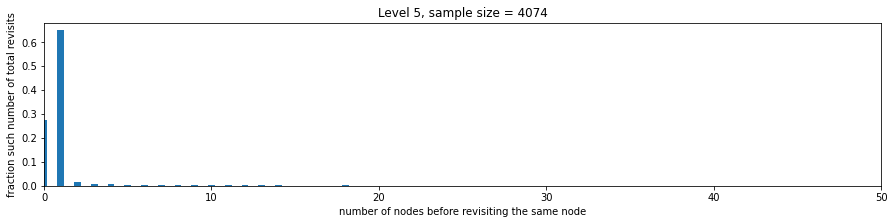

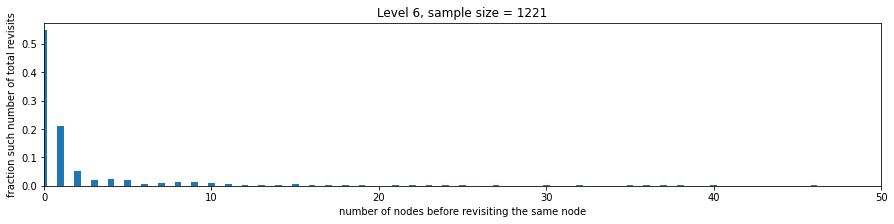

In [59]:
# Plot by level

revisits = get_end_nodes_revisits('B6','all')
for level in p.NODE_LVL:
    plt.figure(figsize=(15, 3))
    to_plot = []
    for node in p.NODE_LVL[level]:
        to_plot += revisits[node]
    total = len(to_plot)
    d = {x: to_plot.count(x)/total for x in to_plot}
#     d = dict(filter(lambda x: x[0] <= 50, d.items()))
    plt.bar(d.keys(), d.values(), width=0.4)
    plt.title(f"Level {level}, sample size = {len(to_plot)}")
    plt.xlabel("number of nodes before revisiting the same node")
    plt.ylabel("fraction such number of total revisits")
    plt.xlim([0, 50])
    plt.show()

In [124]:
# Looks like before revisiting a node in level 6, it goes 1 step and comes back or goes 3 steps and comes back 
# and this forms ~40+25=65% of the revisits to them

# For level 5, revisiting after 1 node is common (probably the neighbouring level 6 node)

# Even for level 4, revisiting after 1 node is fairly frequent. (Could it denote reaching this level is enough for rat
# to be decently certain about what could be next? If this is true, then we should see it increase further as time 
# progresses
# Note: Revisiting after 3 nodes partially agrees with it but revisiting after 5 nodes means it visited all the nodes
# in the subtree).

# From level 3 to level 1, it gets more uniform. What does it mean? Let's check if it became uniform with time.

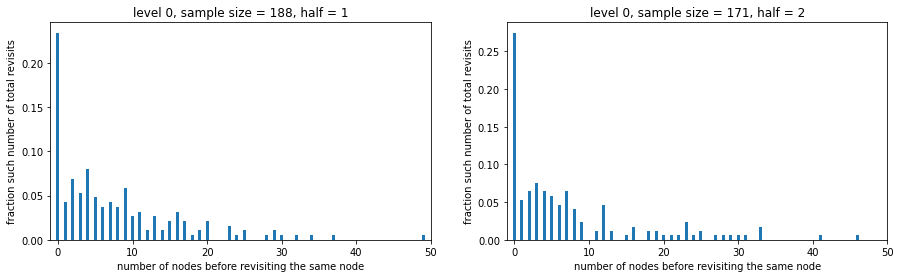

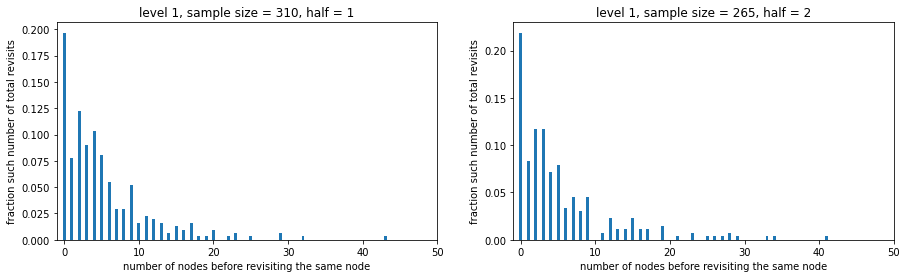

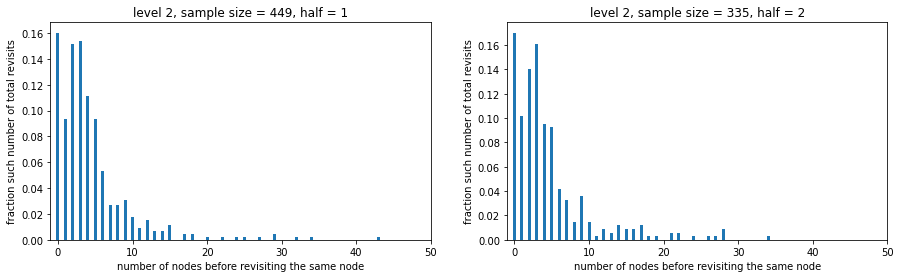

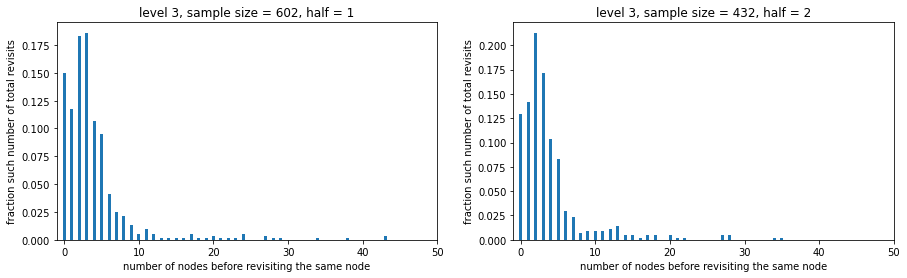

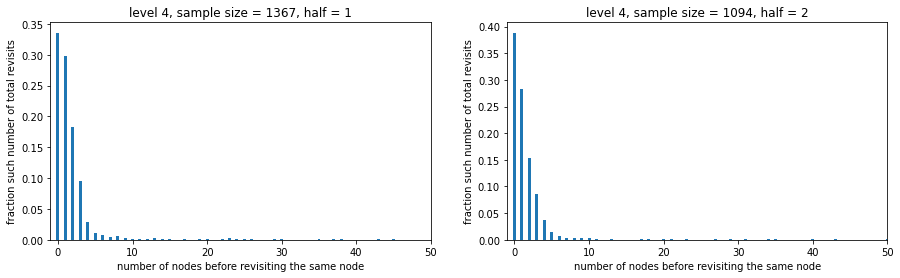

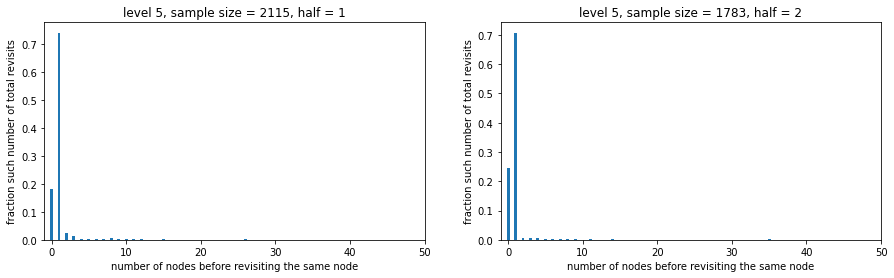

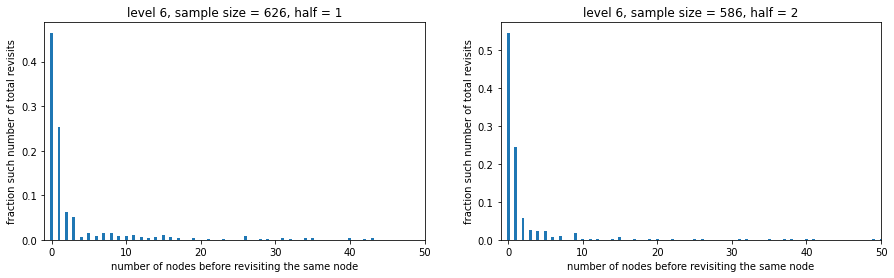

In [69]:
# Plot by level but 2 separate phases

revisit_phase = [None, None]
revisit_phase[0] = get_end_nodes_revisits('B5','first_half')
revisit_phase[1] = get_end_nodes_revisits('B5','second_half')

for level in p.NODE_LVL:
    fig, ax = plt.subplots(1, 2, figsize=(15, 4))
    for half in [0, 1]:
        revisit = revisit_phase[half]
        to_plot = []
        for node in p.NODE_LVL[level]:
            to_plot += revisit[node]
        total = len(to_plot)
        d = {x: to_plot.count(x)/total for x in to_plot}
#         d = dict(filter(lambda item: item[0] <= 50, d.items()))
        ax[half].bar(d.keys(), d.values(), width=0.4)
        ax[half].set_title(f"level {level}, sample size = {len(to_plot)}, half = {half+1}")
        ax[half].set_xlabel("number of nodes before revisiting the same node")
        ax[half].set_ylabel("fraction such number of total revisits")
        ax[half].set_xlim([-1, 50])
    plt.show()

In [138]:
# Hmm, not really a big difference in early and later part of the night. Let's check when divided into 3 phases
# and try to conclude.

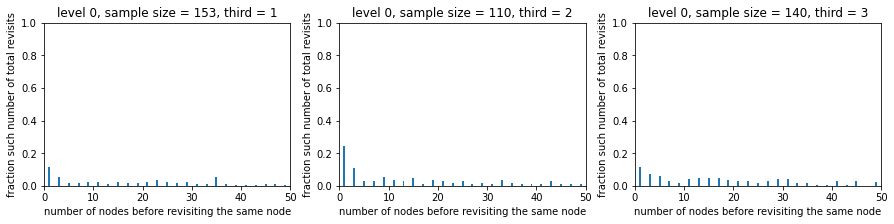

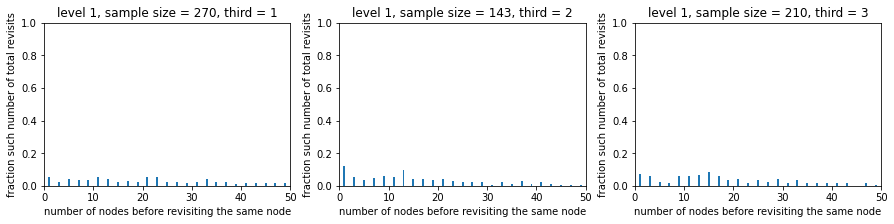

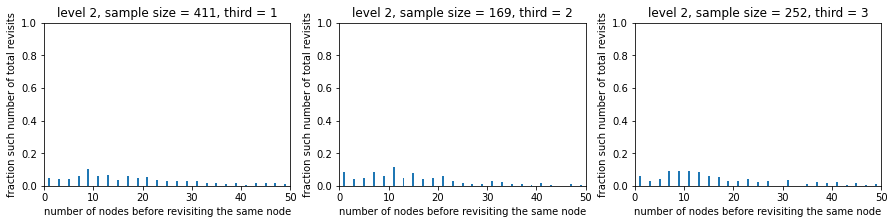

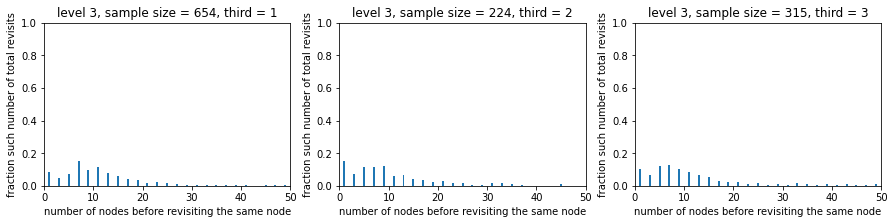

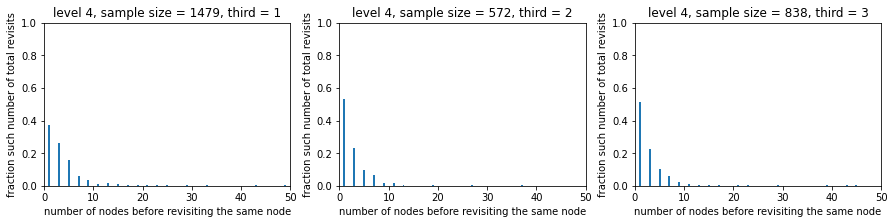

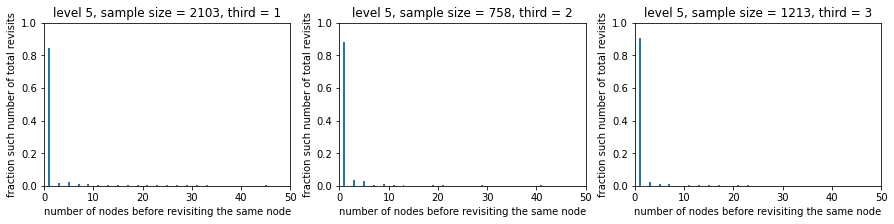

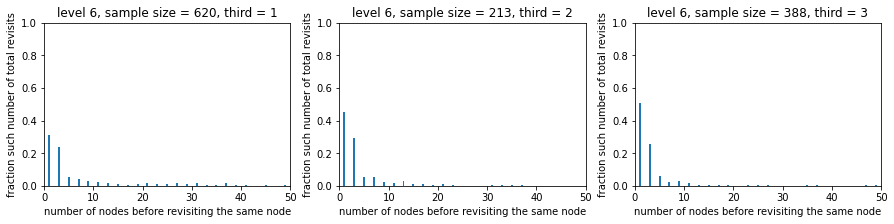

In [67]:
# Plot by level but 3 separate phases

revisit_phase = [None, None, None]
revisit_phase[0] = get_revisits('B6','first_third')
revisit_phase[1] = get_revisits('B6','second_third')
revisit_phase[2] = get_revisits('B6','third_third')

for level in p.NODE_LVL:
    fig, ax = plt.subplots(1, 3, figsize=(15, 3))
    for third in [0, 1, 2]:
        revisit = revisit_phase[third]
        to_plot = []
        for node in p.NODE_LVL[level]:
            to_plot += revisit[node]
        total = len(to_plot)
        d = {x: to_plot.count(x)/total for x in to_plot}
#         d = dict(filter(lambda item: item[0] <= 70, d.items()))
        ax[third].bar(d.keys(), d.values(), width=0.4)
        ax[third].set_title(f"level {level}, sample size = {len(to_plot)}, third = {third+1}")
        ax[third].set_xlabel("number of nodes before revisiting the same node")
        ax[third].set_ylabel("fraction such number of total revisits")
        ax[third].set_ylim([0, 1])
        ax[third].set_xlim([0, 50])
    plt.show()

In [156]:
# For level 4 and 6, the fraction to revisit after 1 node increases over time. 
# Even for level 3, the fraction is consistent with peak around 9 to 11 nodes between revisits. To fully cover 
# a subquarter, it will need 13 visits. So it only skips few nodes most time.

# For level 0, pretty uniform again. (So we didn't get the answer to it)

### Check number of nodes of each level (especially level 6) with time, check if they stop looking into deeper nodes

B1 mean fraction time spent at level 4= 0.21007806055811887 ± 0.0397377660788642


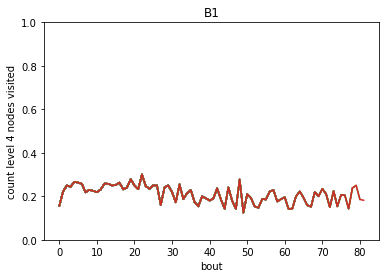

B2 mean fraction time spent at level 4= 0.1781419988129878 ± 0.044905984744109555


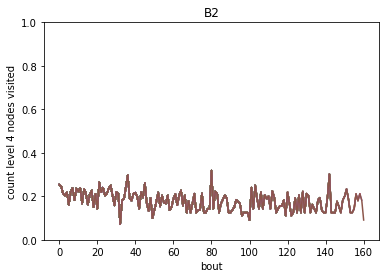

B3 mean fraction time spent at level 4= 0.18802293630603137 ± 0.05599241312179863


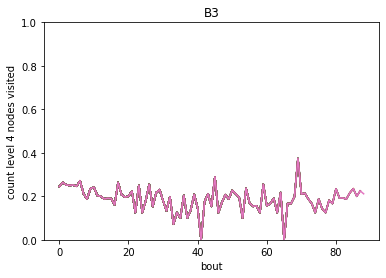

B4 mean fraction time spent at level 4= 0.17192562099743428 ± 0.04682330400660303


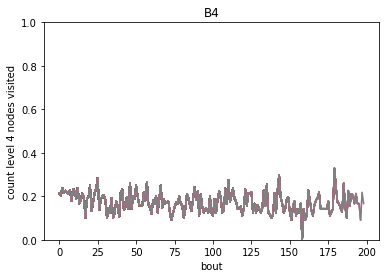

C1 mean fraction time spent at level 4= 0.18790210438134555 ± 0.0414194480274301


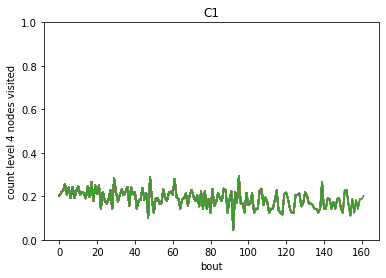

C3 mean fraction time spent at level 4= 0.18055734357366438 ± 0.04655381087193102


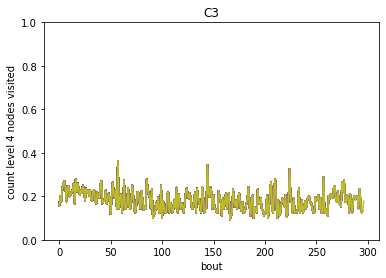

C6 mean fraction time spent at level 4= 0.18474818352713152 ± 0.03958265108490067


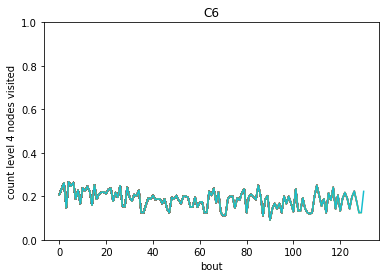

C7 mean fraction time spent at level 4= 0.20482965807576087 ± 0.04082057295216163


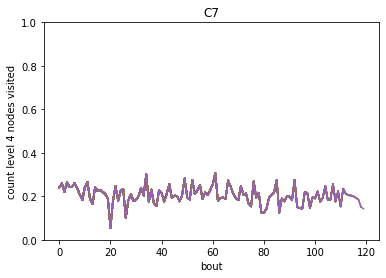

C8 mean fraction time spent at level 4= 0.20531179107371772 ± 0.044553364187422353


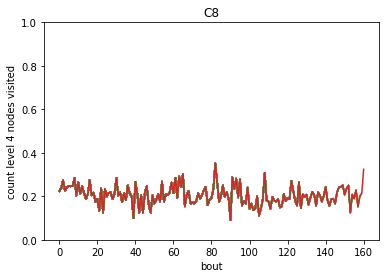

C9 mean fraction time spent at level 4= 0.2073863844331452 ± 0.03894280376340647


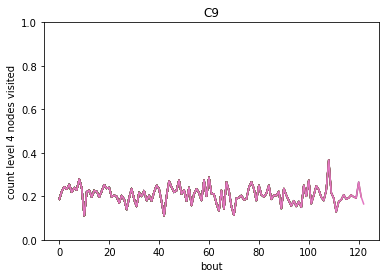

B5 mean fraction time spent at level 4= 0.19281167424141288 ± 0.04465527938243395


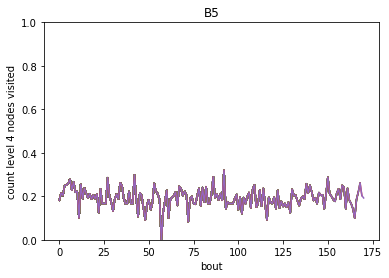

B6 mean fraction time spent at level 4= 0.21000853075005937 ± 0.05016369226334685


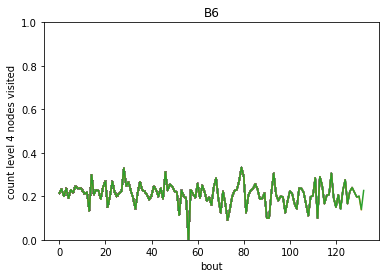

B7 mean fraction time spent at level 4= 0.20175393969298264 ± 0.046293309981933


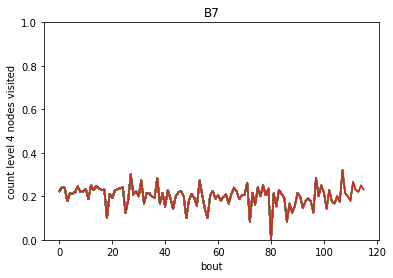

D3 mean fraction time spent at level 4= 0.20100240089816526 ± 0.041905492297496225


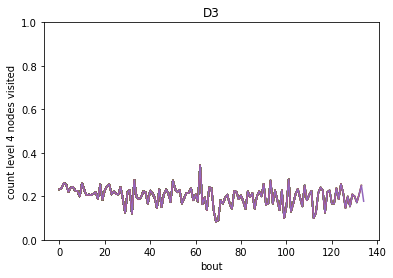

D4 mean fraction time spent at level 4= 0.1945455365843661 ± 0.04464062373138527


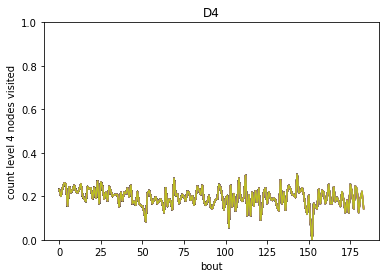

D5 mean fraction time spent at level 4= 0.20528141804657168 ± 0.04142420587166527


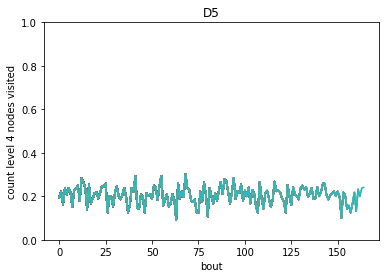

D7 mean fraction time spent at level 4= 0.2046824406124466 ± 0.04255430510810297


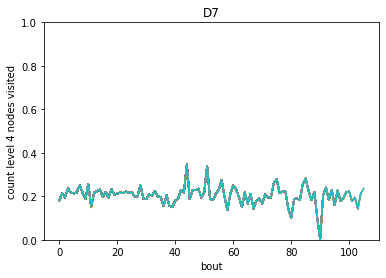

D8 mean fraction time spent at level 4= 0.19339627960695838 ± 0.034641652341537994


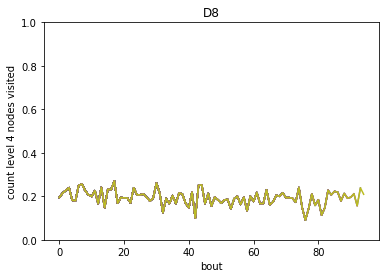

D9 mean fraction time spent at level 4= 0.19369419813289285 ± 0.04483168581741807


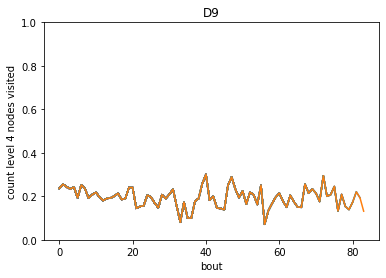

In [14]:
level = 4
for sub in p.RewNames+p.UnrewNamesSub:
    tf = LoadTrajFromPath(outdata_path+sub+'-tf')
    lev_nodes_visited = []
    for i, bout in enumerate(tf.no):
        nodes = bout[:, 0]
        if len(nodes) >= 10:
    #         print("bout", i, "->", sum([1 for n in nodes if n in p.LVL_6_NODES]))
            count_lvl = sum([1 for n in nodes if n in p.NODE_LVL[level]])
            total = len(nodes)
            lev_nodes_visited.append(count_lvl/total)
        plt.plot(lev_nodes_visited)
        plt.title(sub)
        plt.ylabel(f'count level {level} nodes visited')
        plt.xlabel('bout')
        plt.ylim([0, 1])
    print(sub, f"mean fraction time spent at level {level}=", np.mean(lev_nodes_visited), "±", np.std(lev_nodes_visited))
    plt.show()

### Autocorrelating bout lengths

#### Useful for autocorr, seasonal: https://towardsdatascience.com/5-types-of-plots-that-will-help-you-with-time-series-analysis-b63747818705

B5


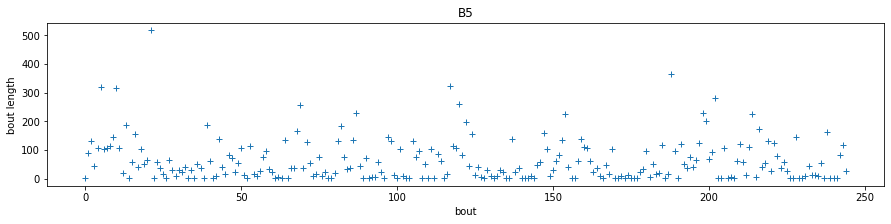

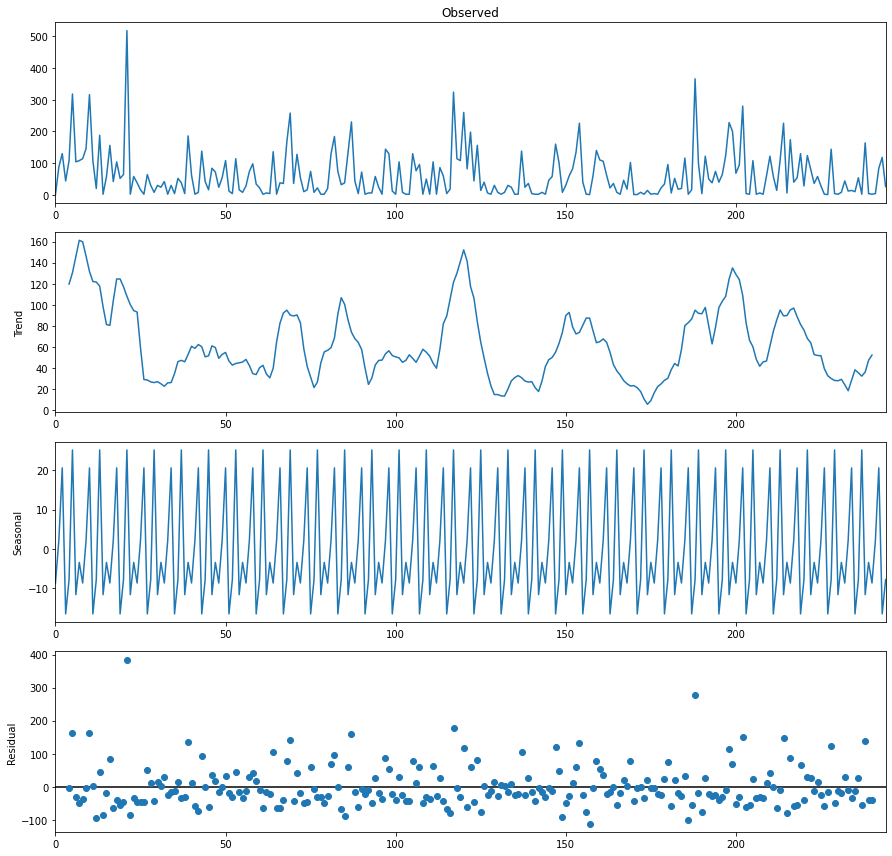

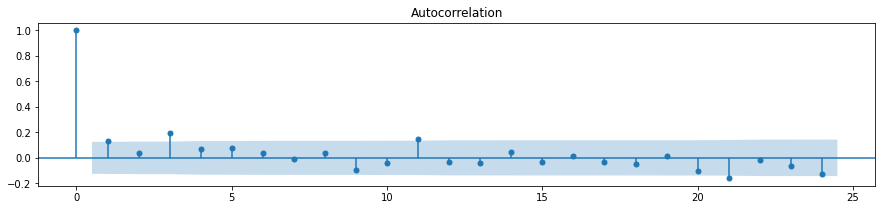

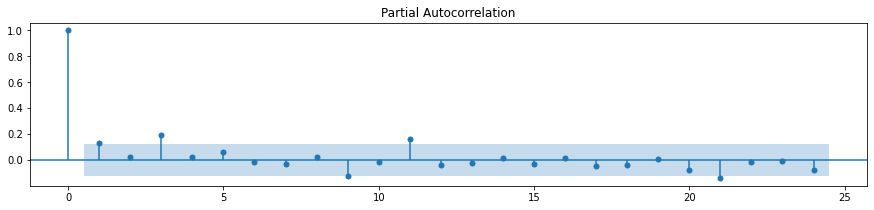

B6


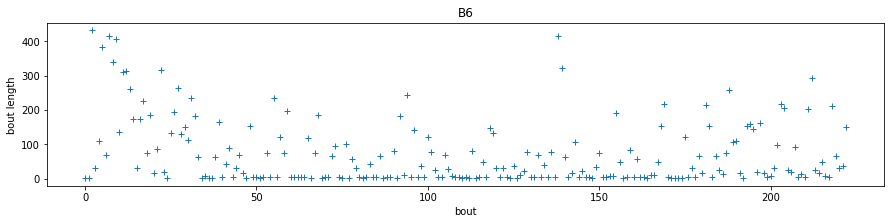

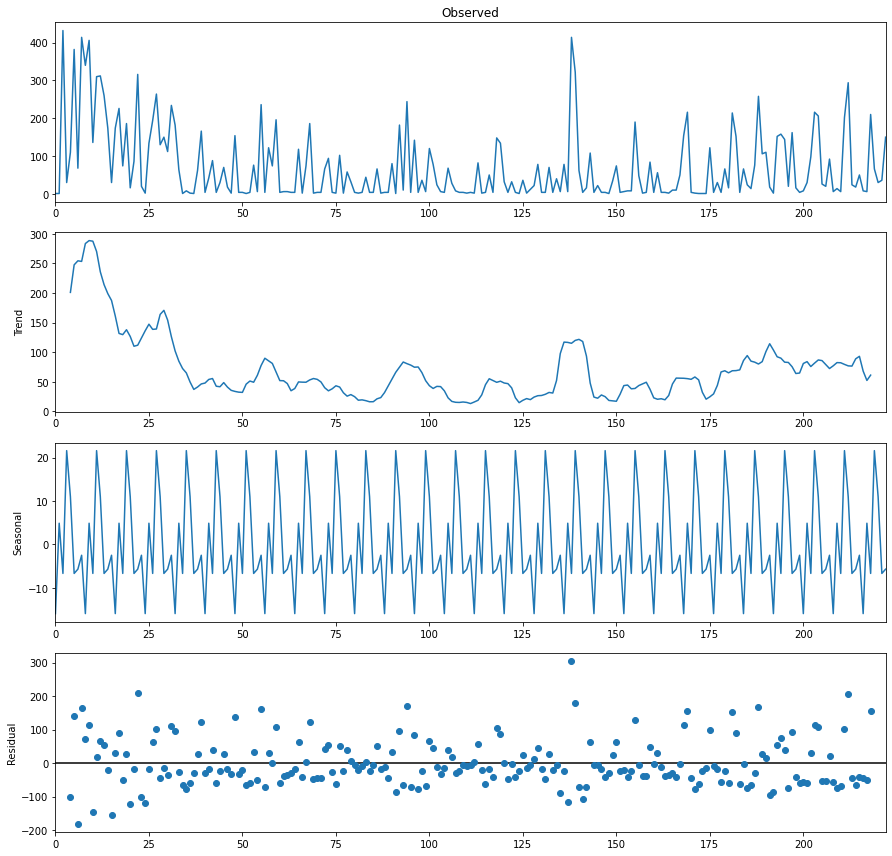

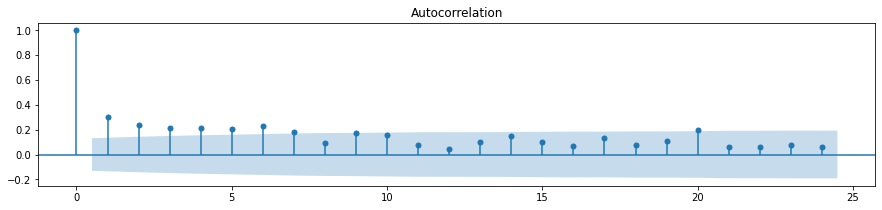

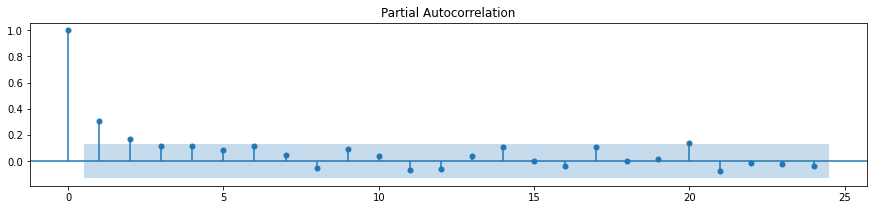

B7


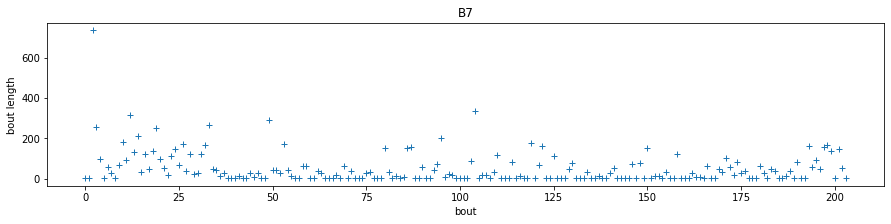

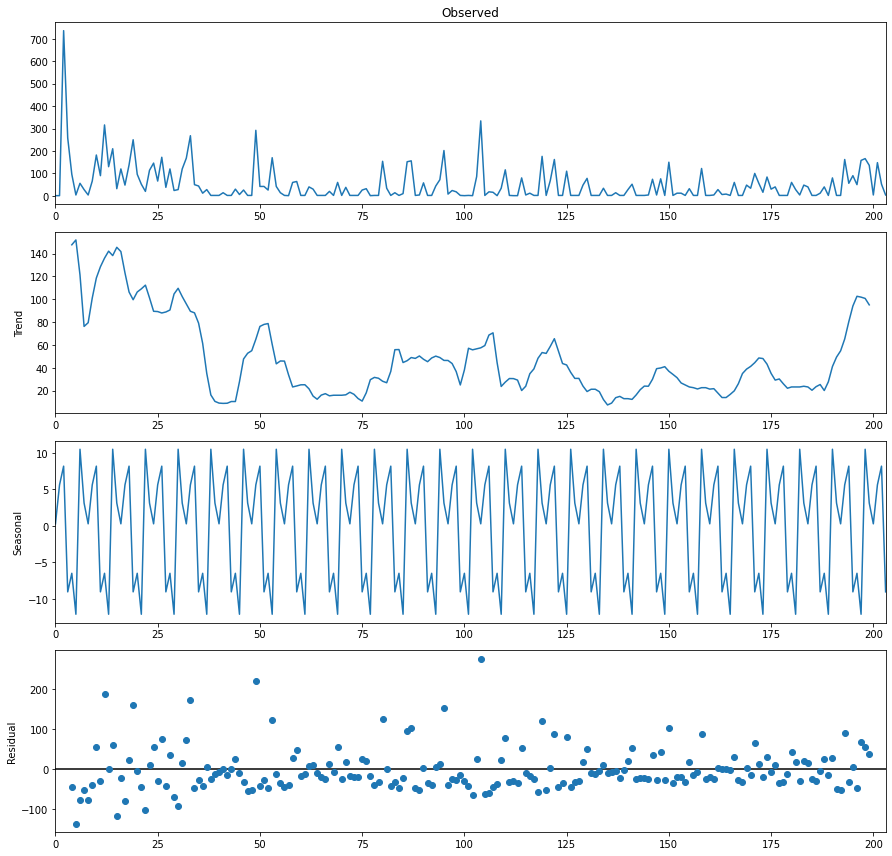

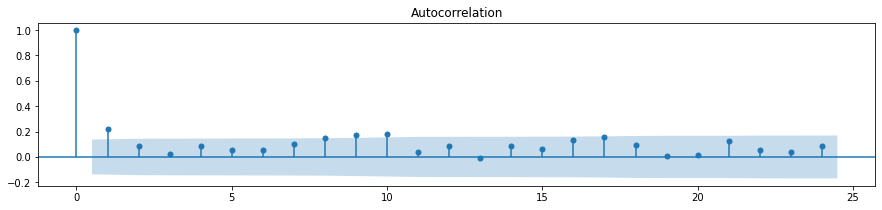

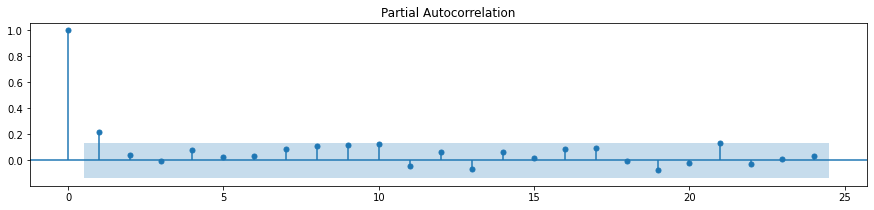

D3


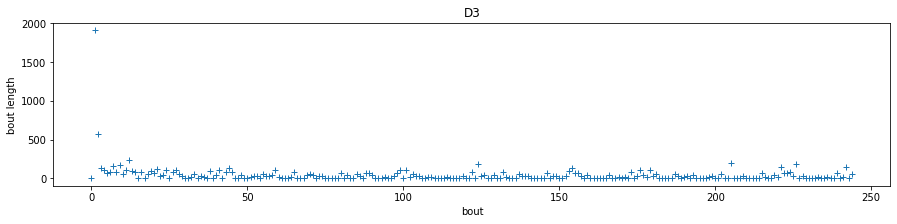

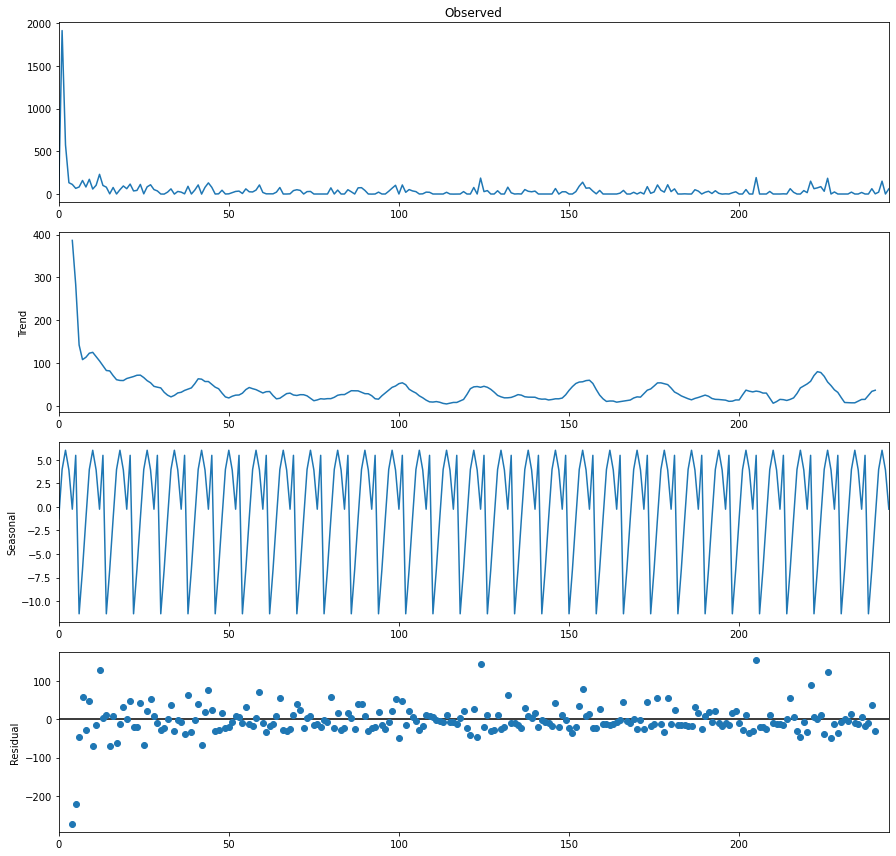

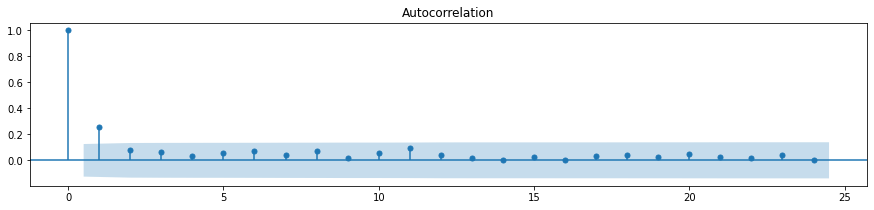

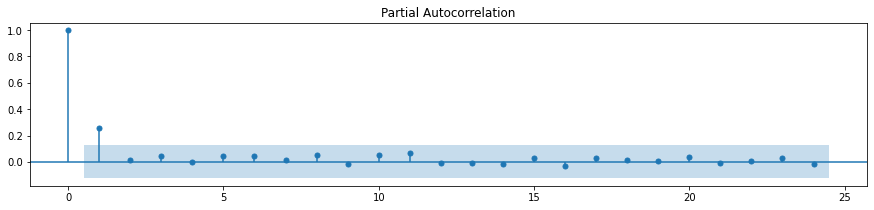

D4


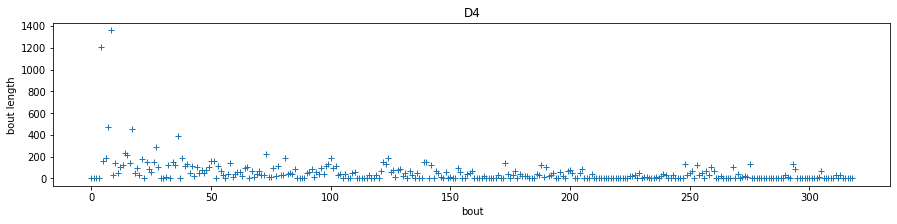

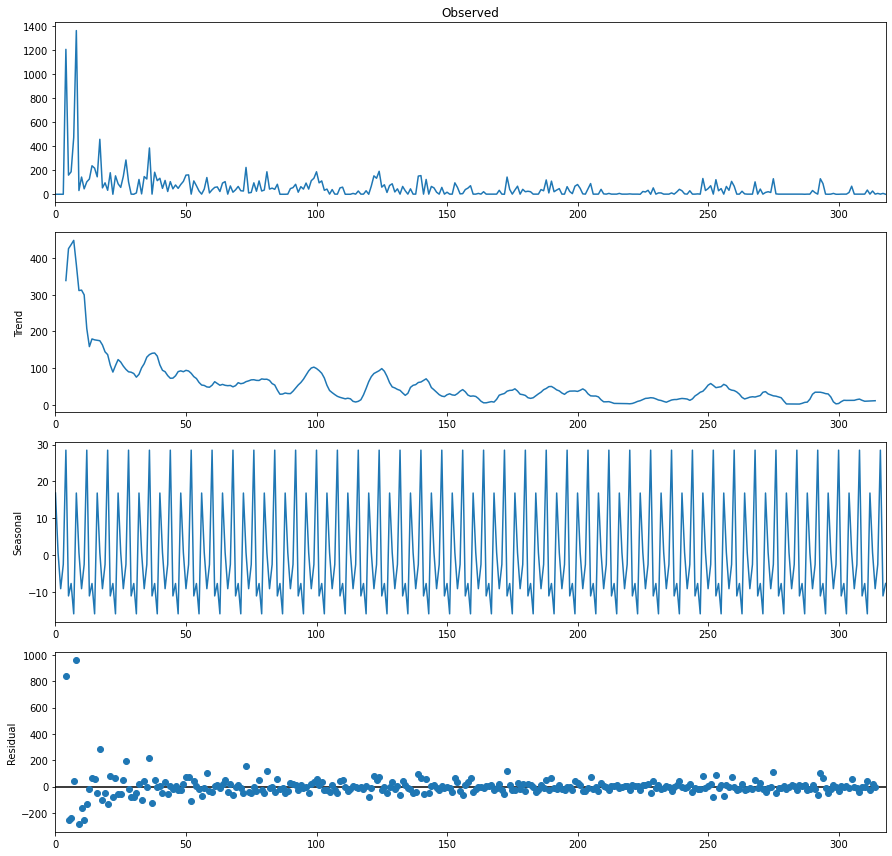

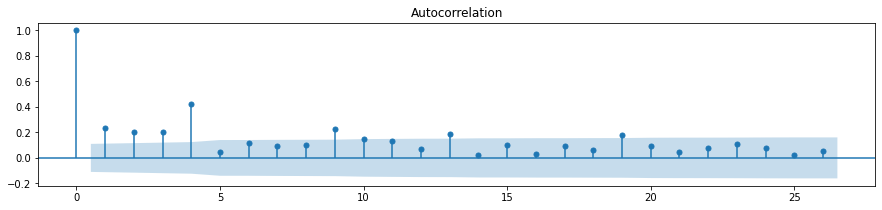

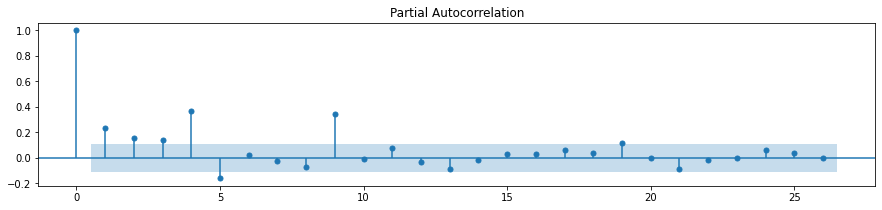

D5


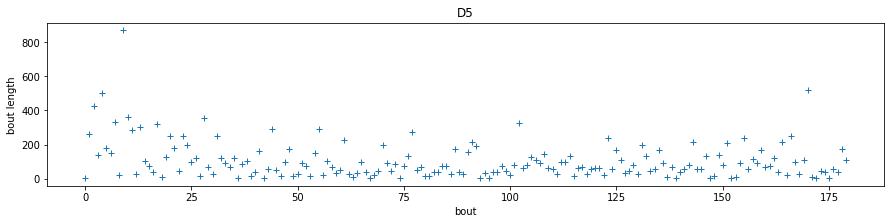

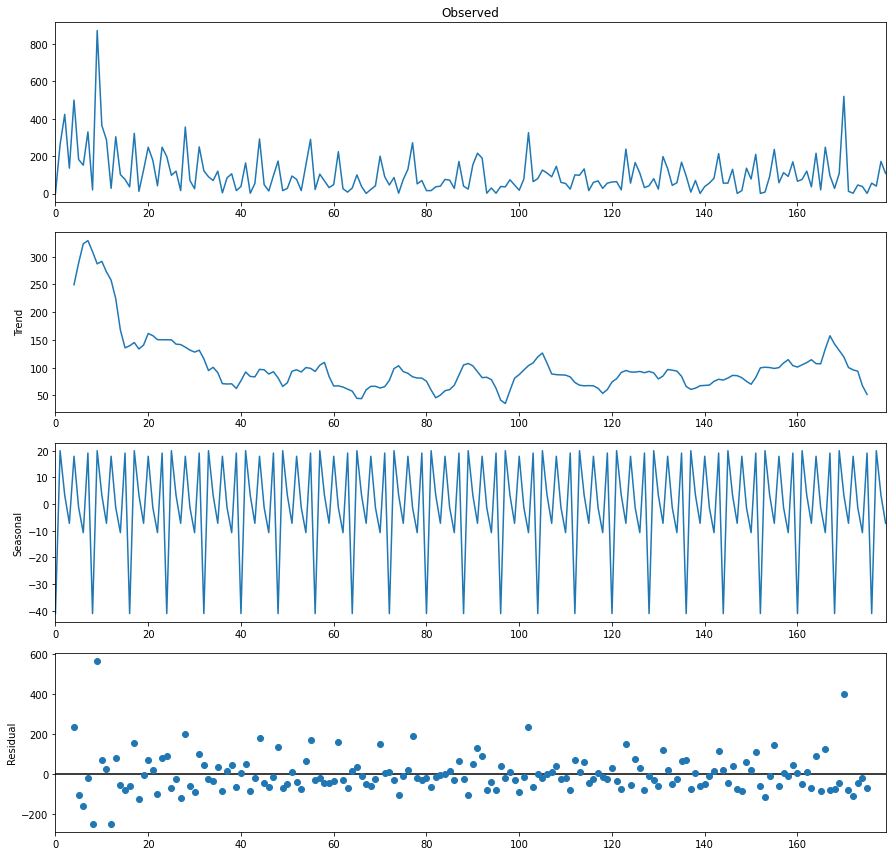

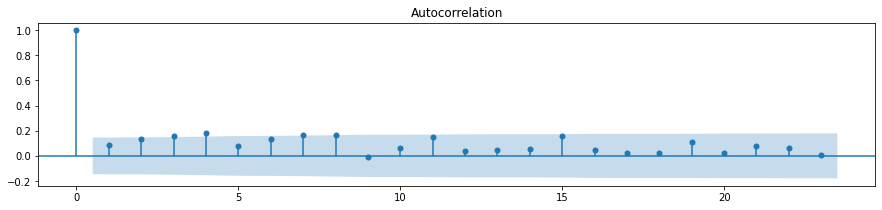

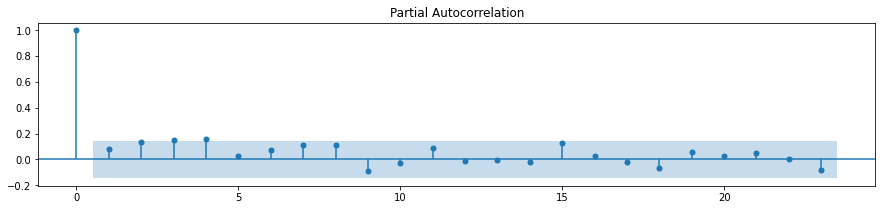

D7


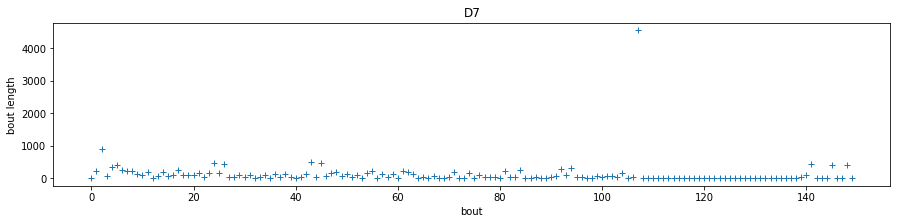

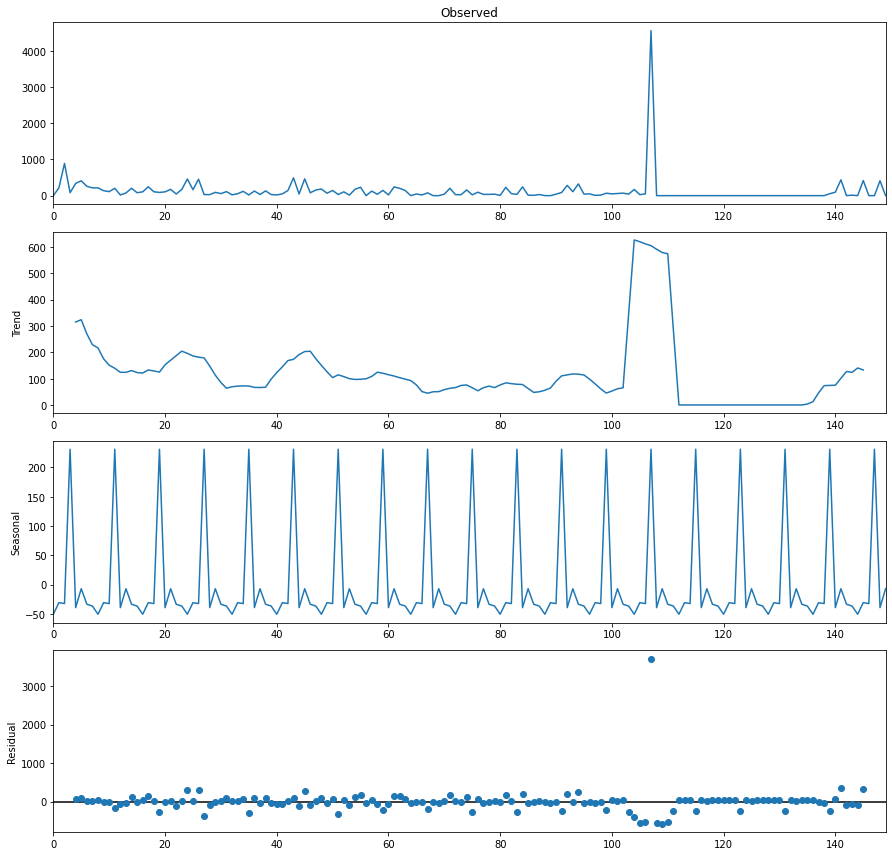

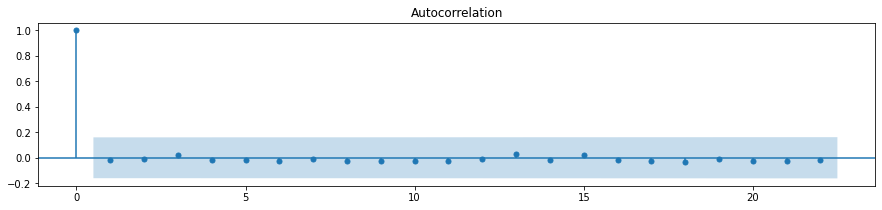

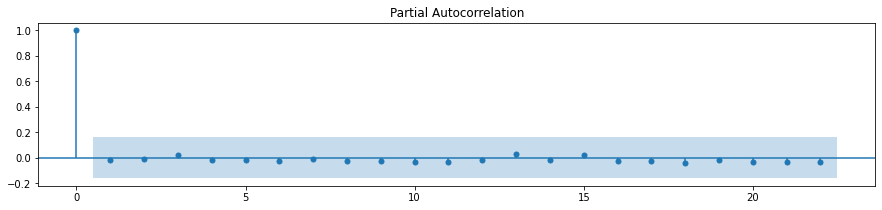

D8


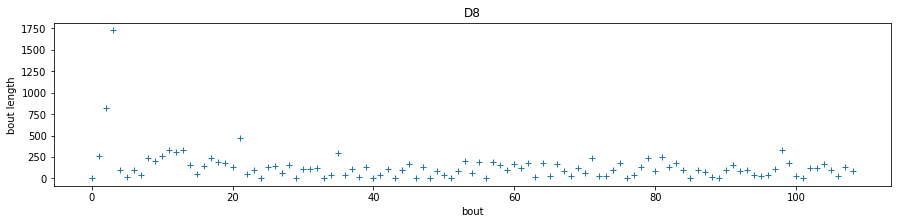

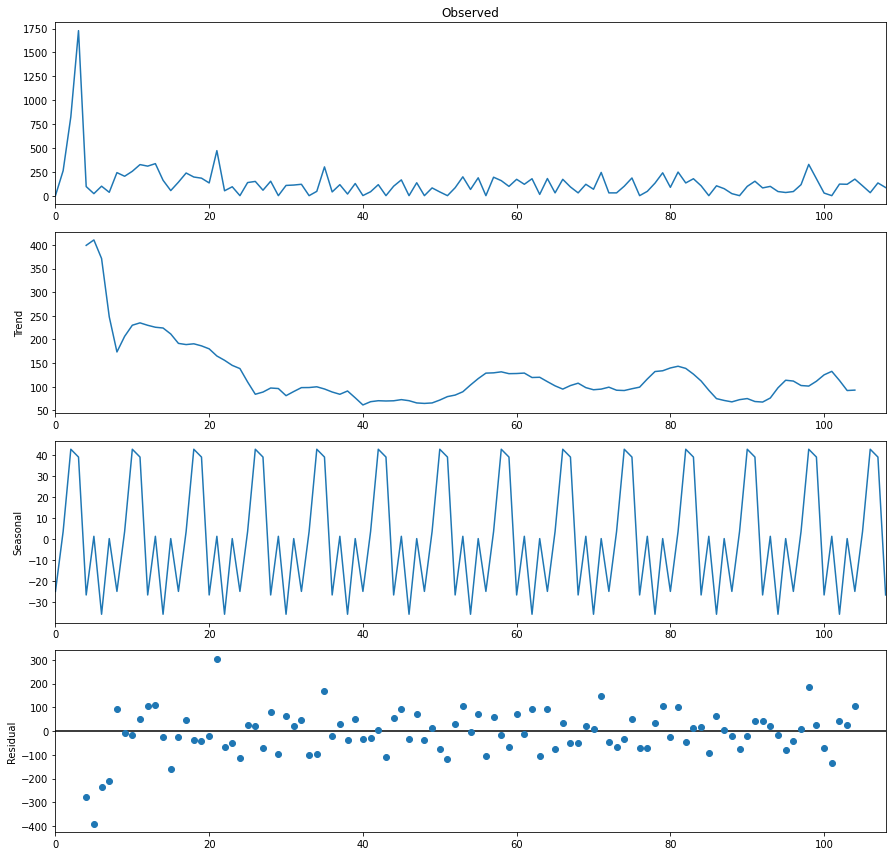

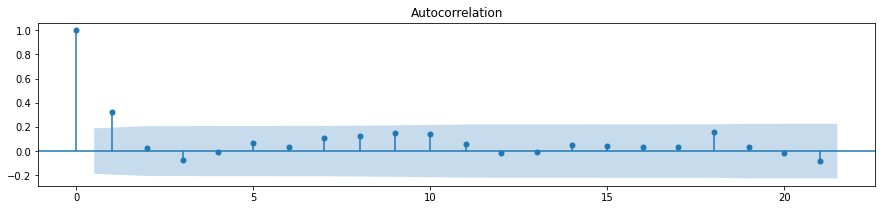

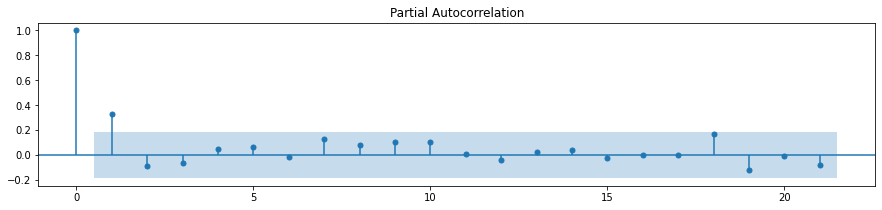

D9


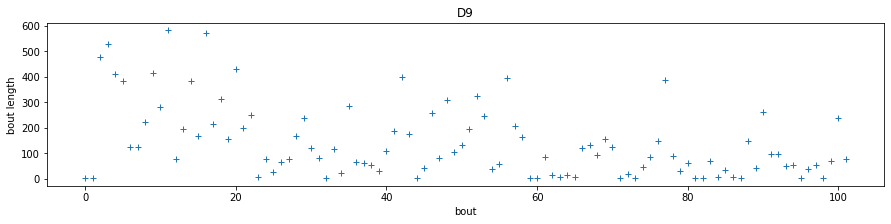

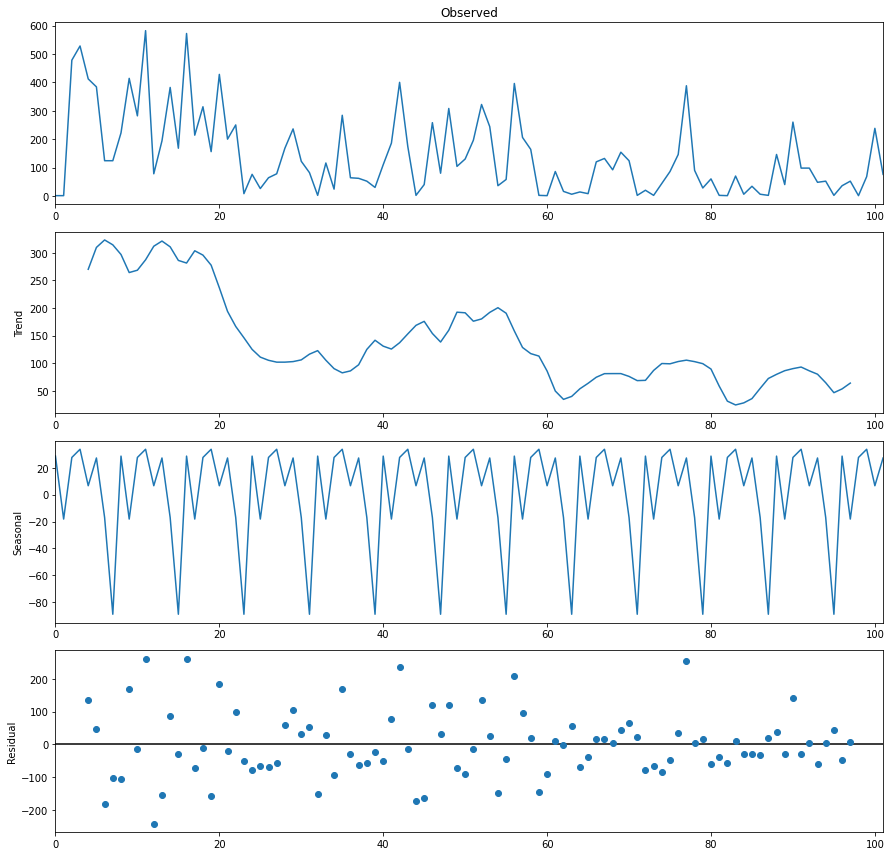

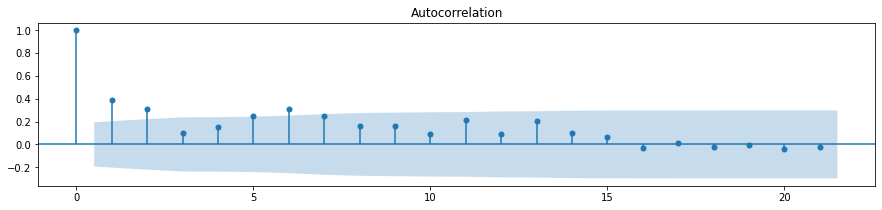

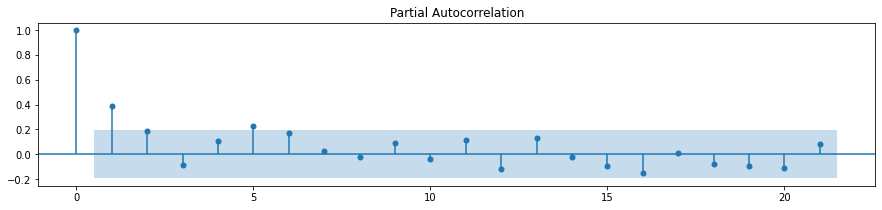

In [156]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, month_plot, quarter_plot
import pandas as pd

for sub in p.UnrewNamesSub:
    print(sub)
    tf = LoadTrajFromPath(outdata_path+sub+'-tf')
    len_bouts = [len(bout) for bout in tf.no]
    plt.rc("figure", figsize=(15, 3))
    plt.plot(len_bouts, '+')
    plt.title(sub)
    plt.ylabel(f'bout length')
    plt.xlabel('bout')
    plt.show()
    plt.rc("figure", figsize=(12.5, 12))
    decomposition = seasonal_decompose(len_bouts, model='additive', period=8)
    decomposition.plot();
    plt.rc("figure", figsize=(15, 3))
    plot_acf(pd.Series(len_bouts))
    plot_pacf(pd.Series(len_bouts))
    plt.show()
    print("======")


In [72]:
# Barely any auto correlation seen. Most fractions are very low.

### space coverage in terms of total number of quadrants and subquadrants across time and if there's any trend

In [129]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, month_plot, quarter_plot
import pandas as pd

In [133]:
def get_number_of_sections(tr, level):
#     print(tr)
    if level == 'quadrant':
        return sum([(node in tr) for node in p.LVL_2_NODES])
    if level == 'subquadrant':
        return sum([(node in tr) for node in p.LVL_4_NODES])

B5


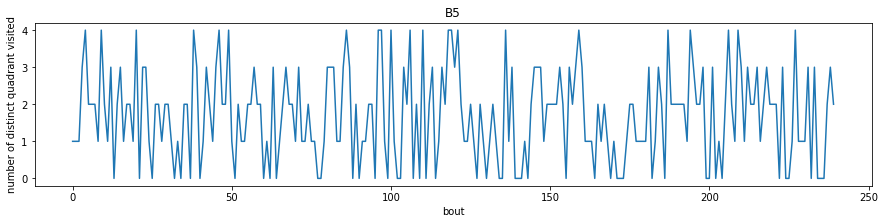

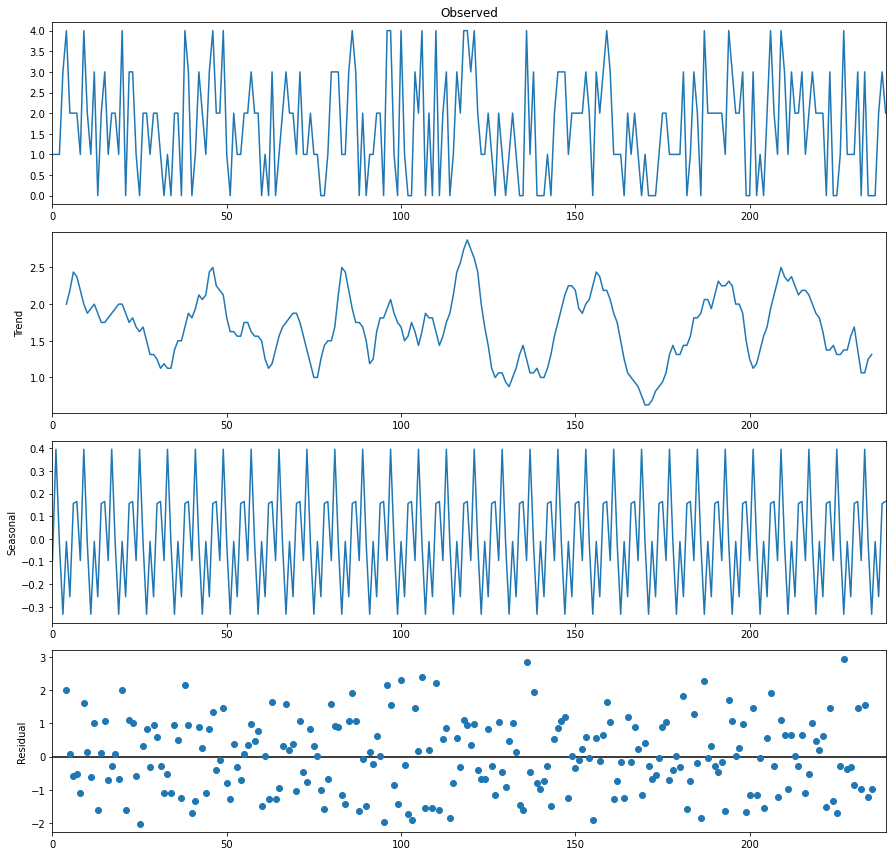

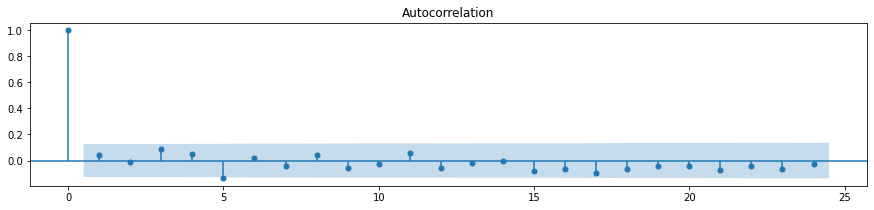

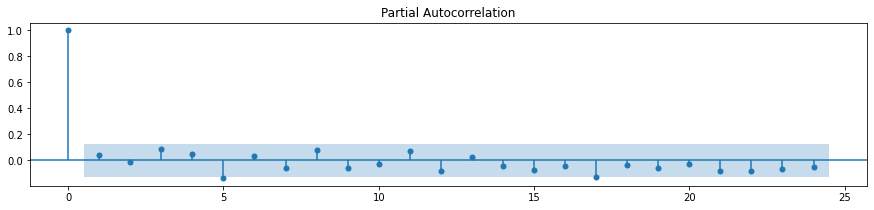

B6


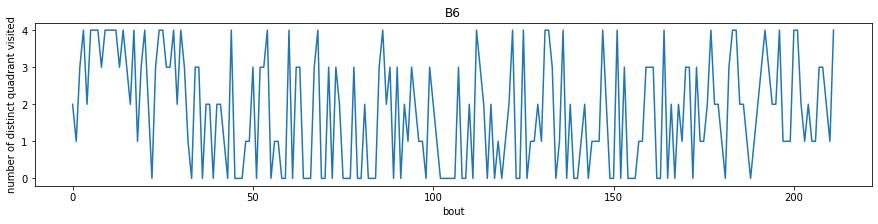

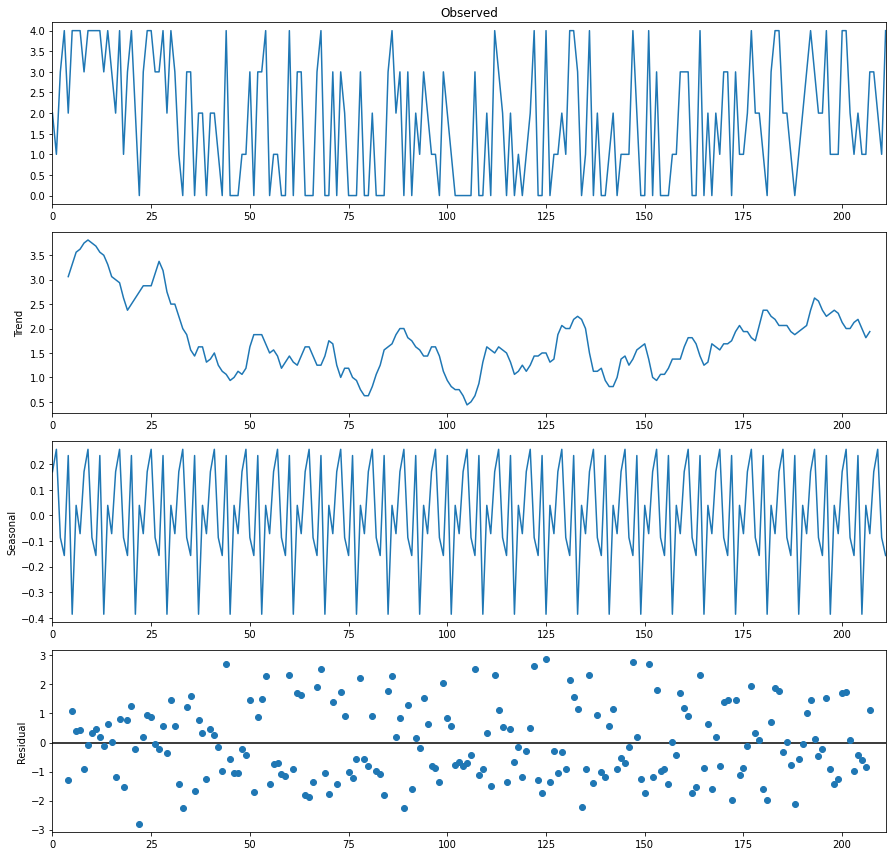

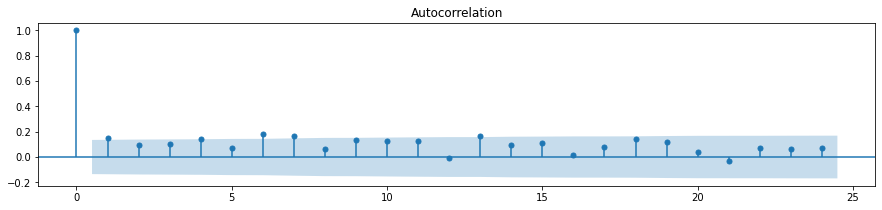

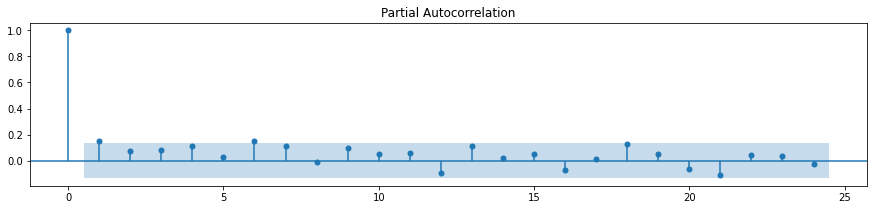

B7


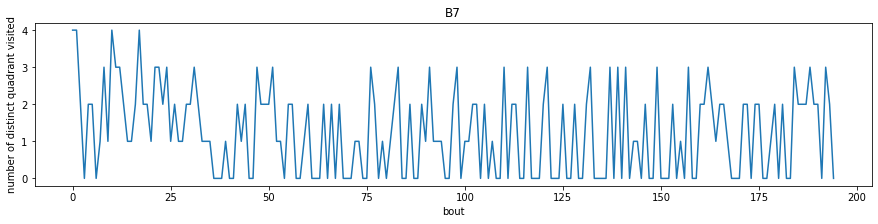

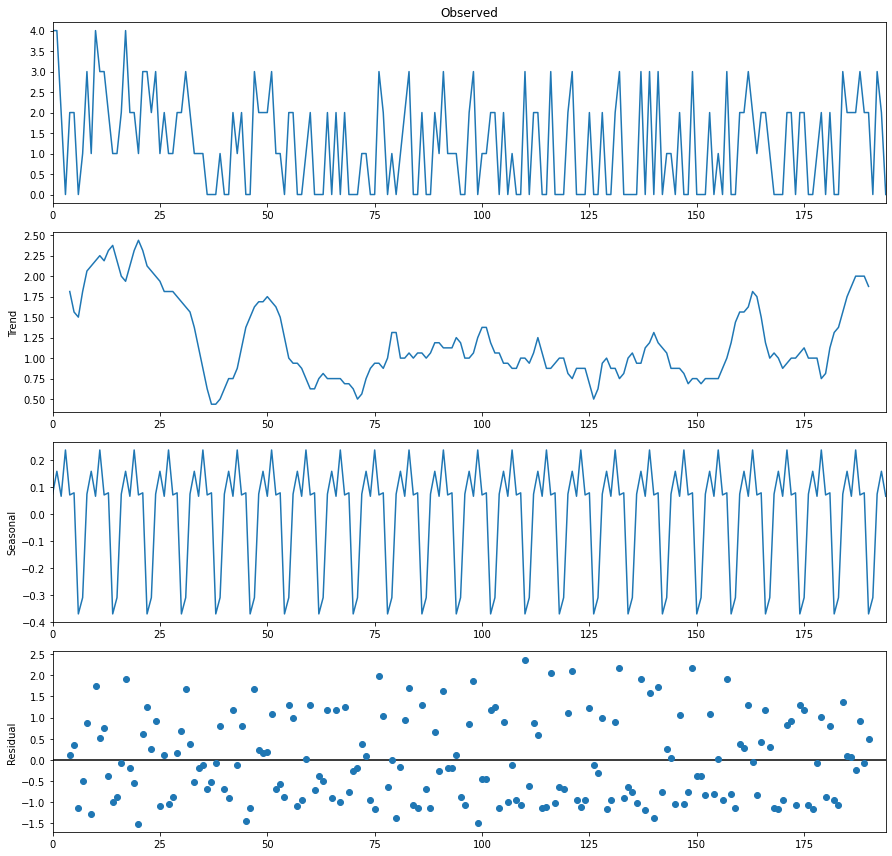

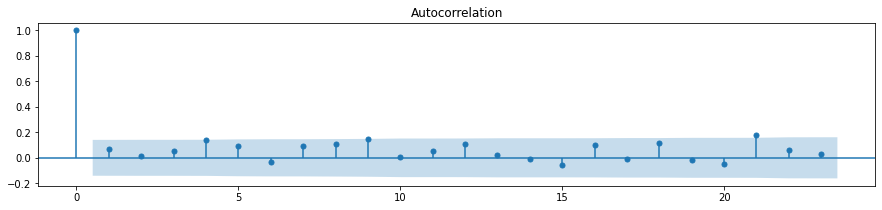

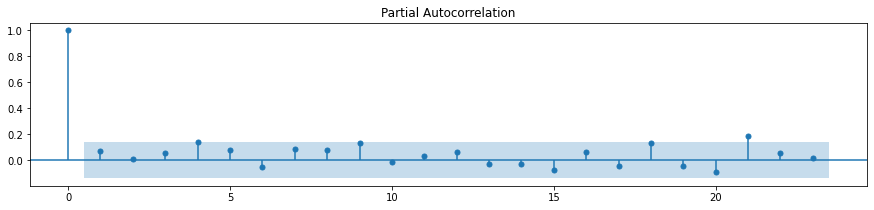

D3


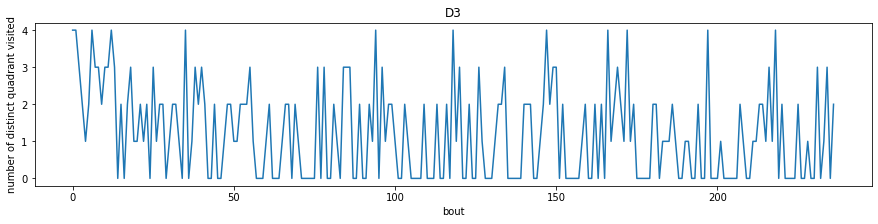

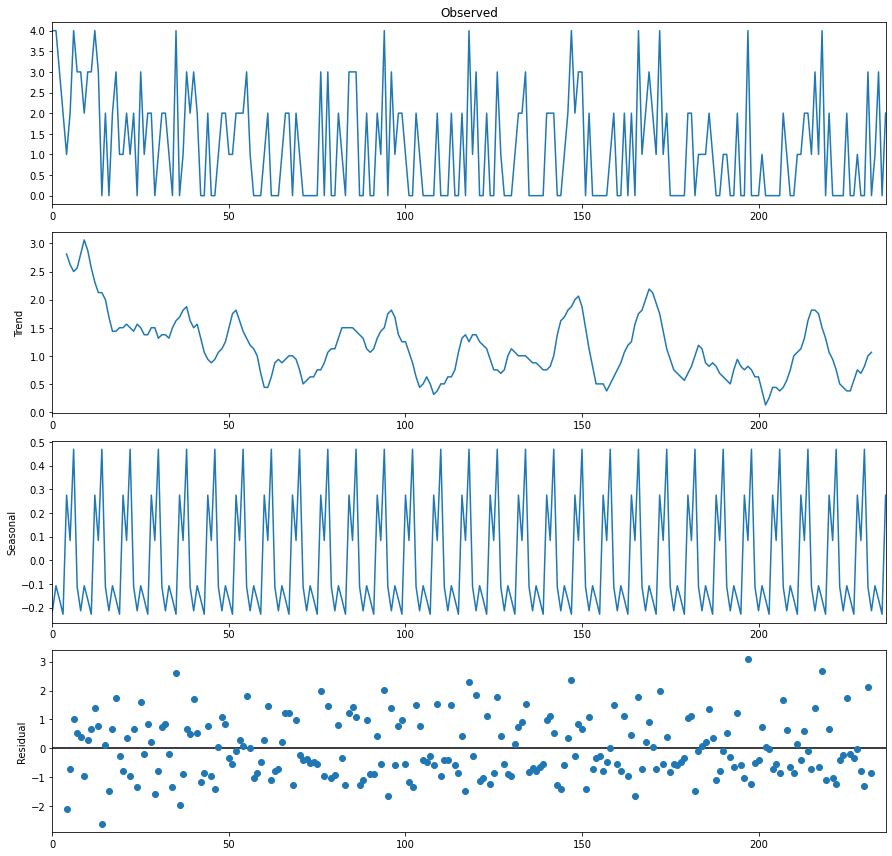

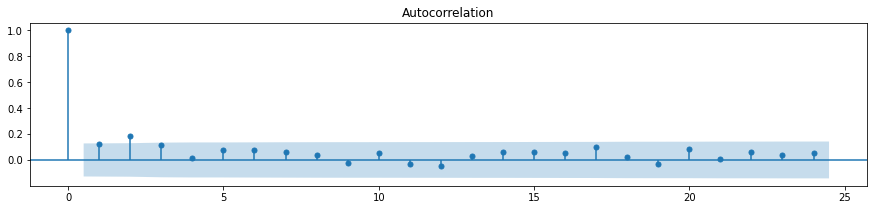

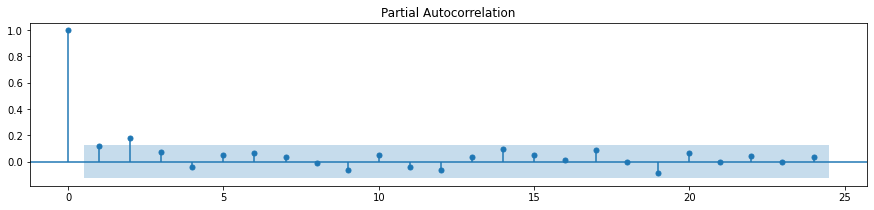

D4


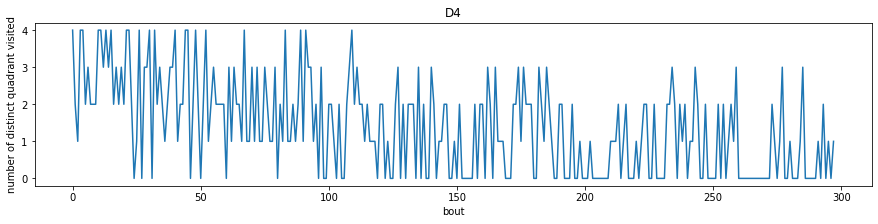

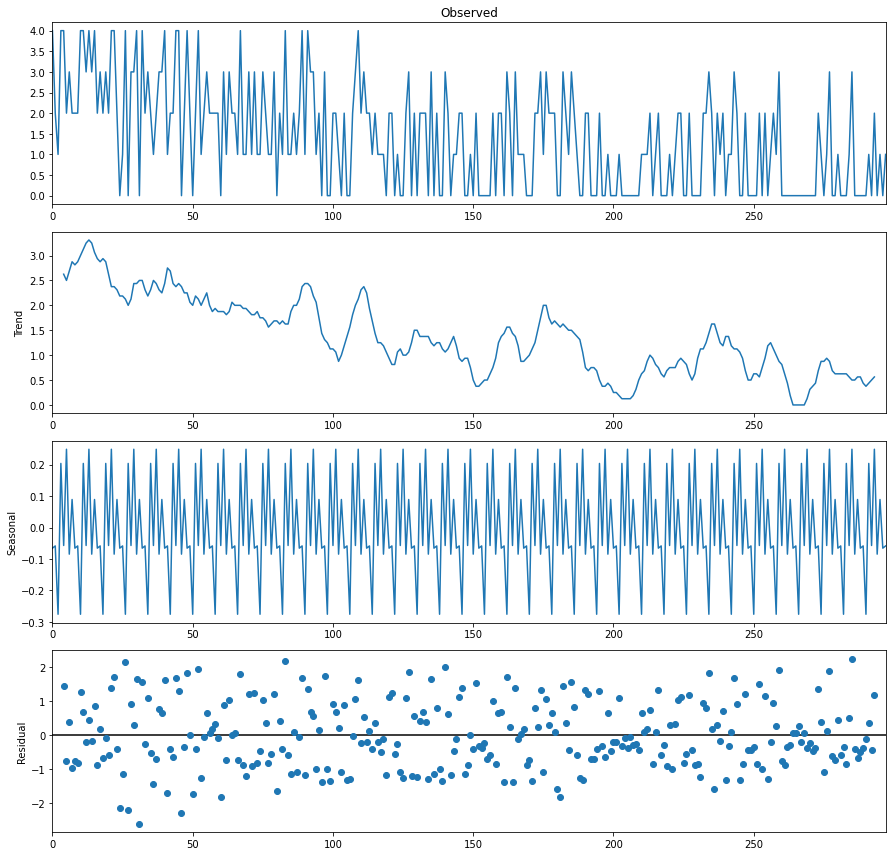

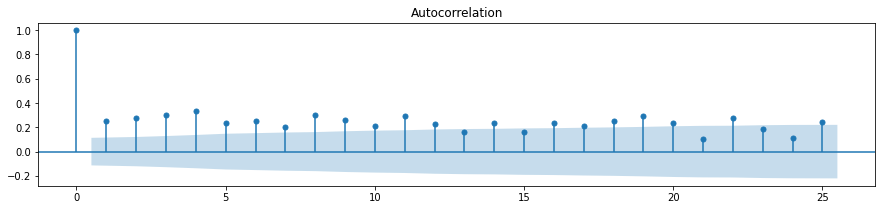

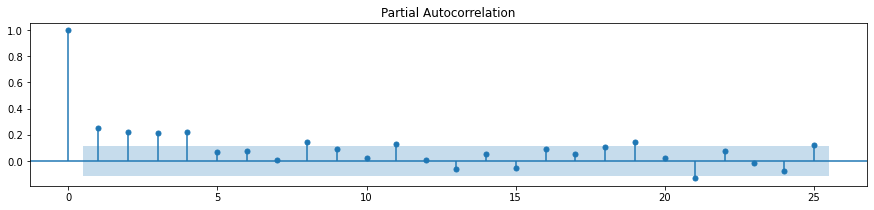

D5


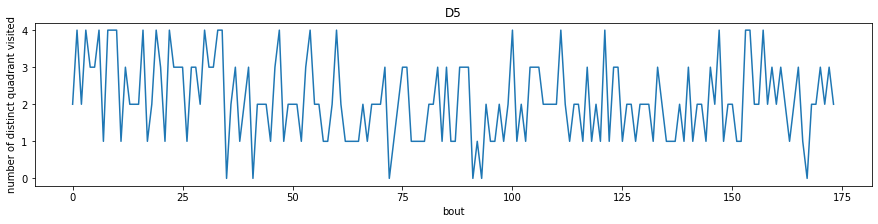

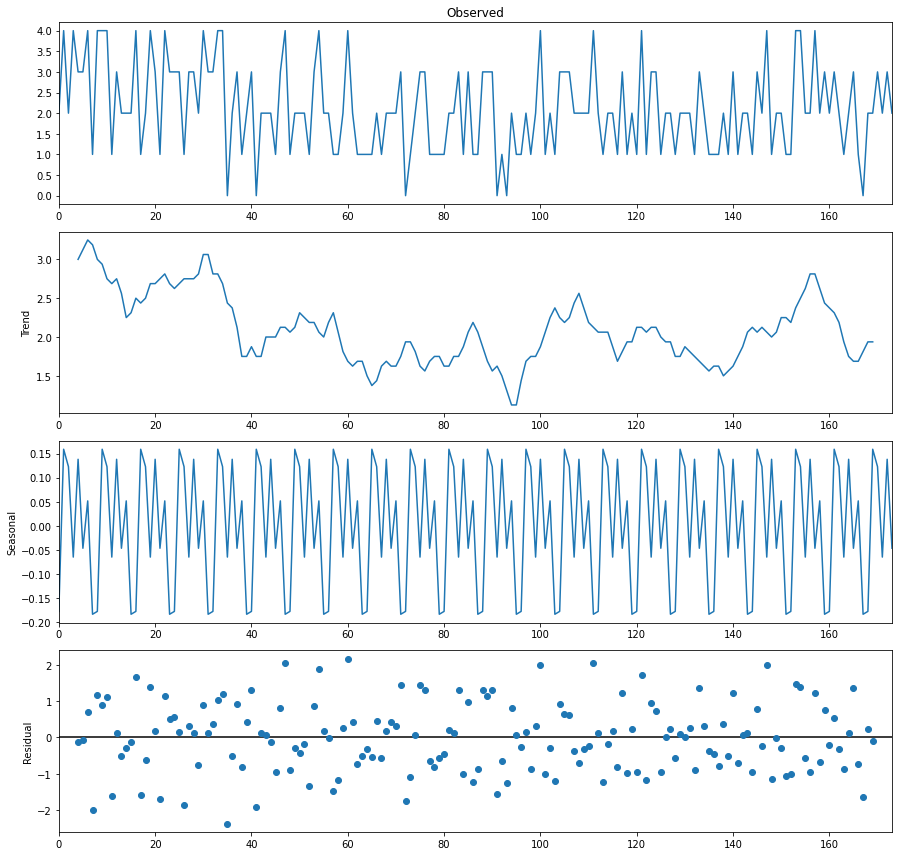

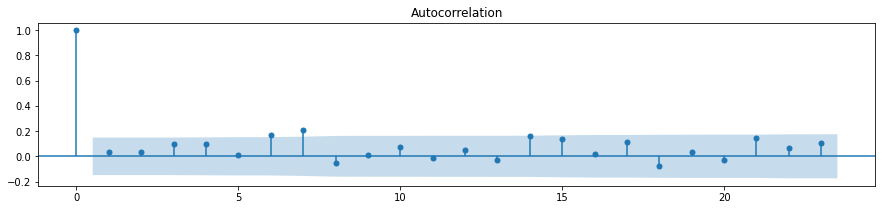

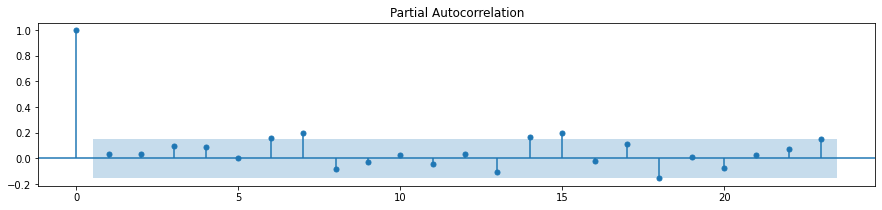

D7


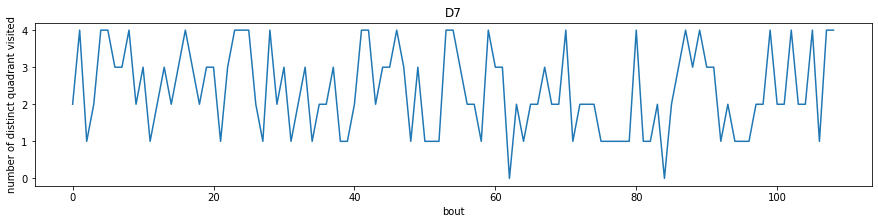

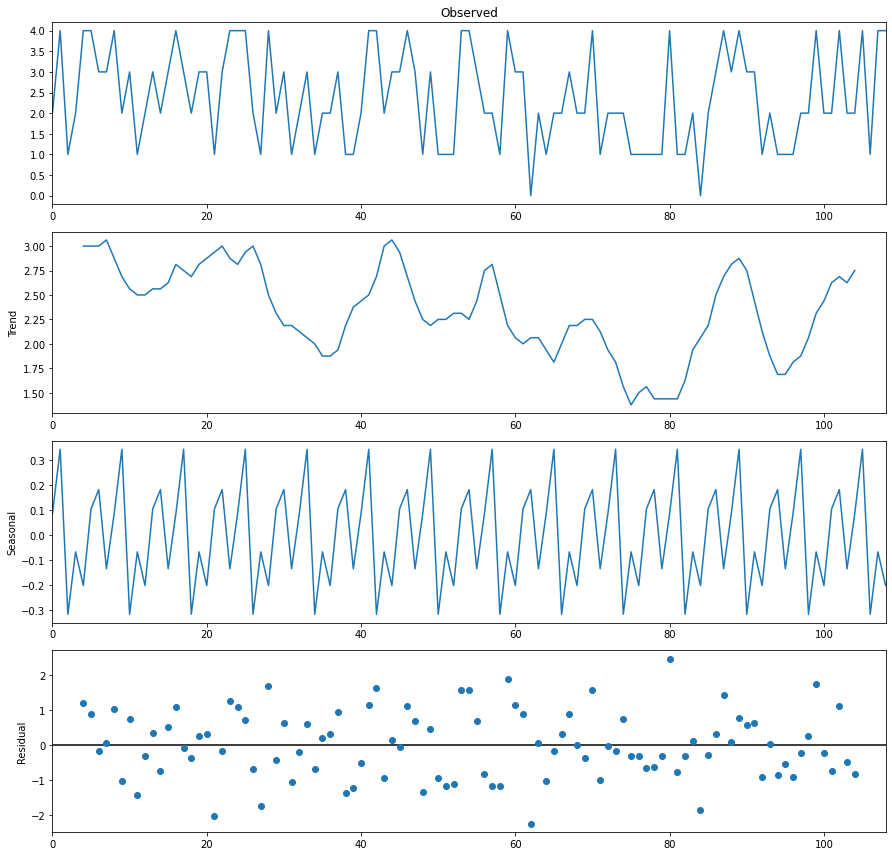

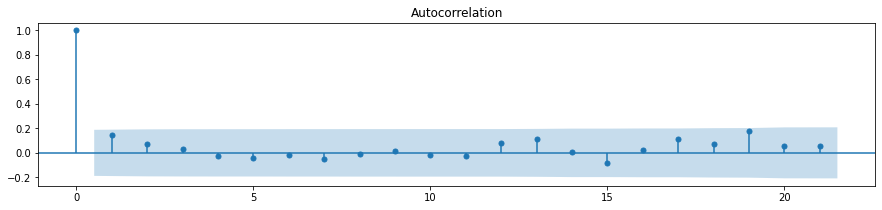

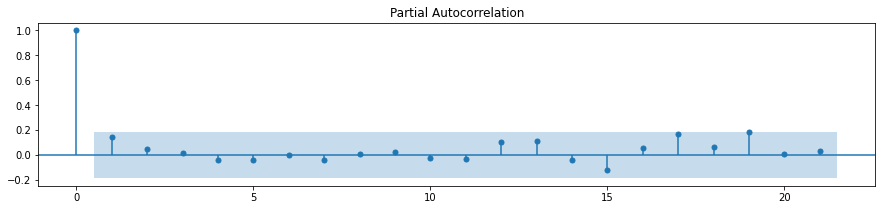

D8


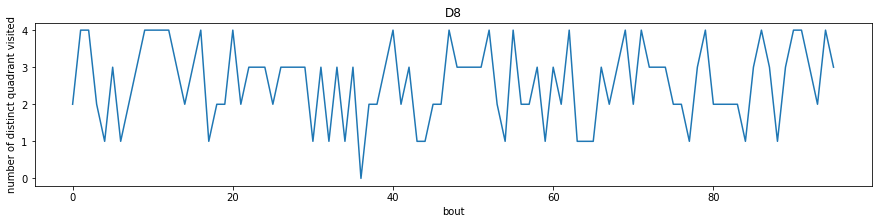

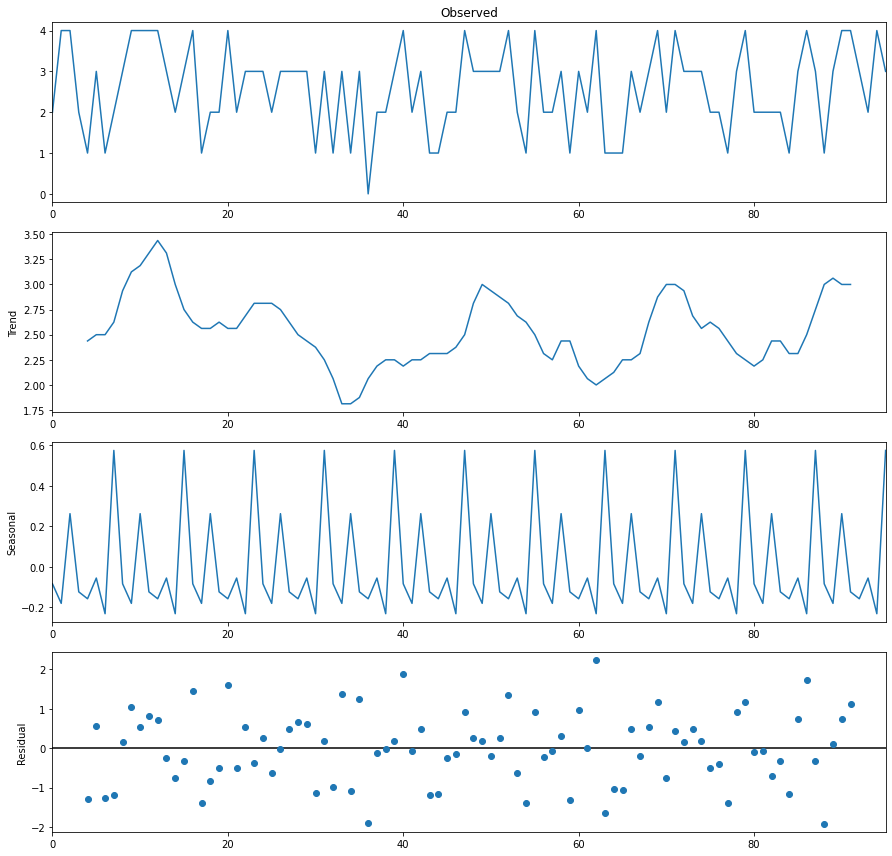

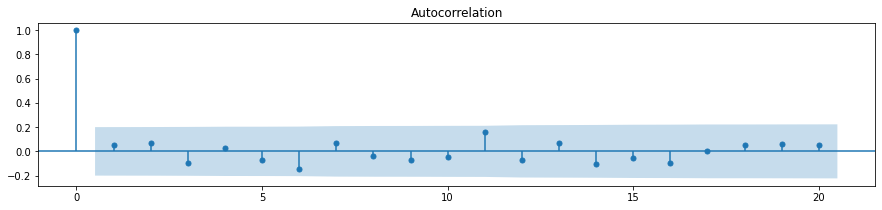

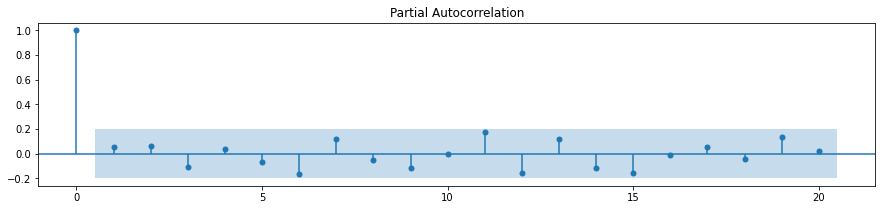

D9


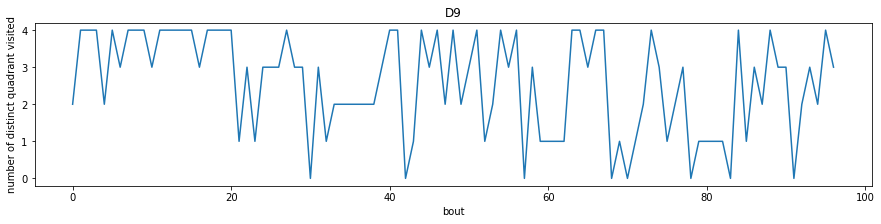

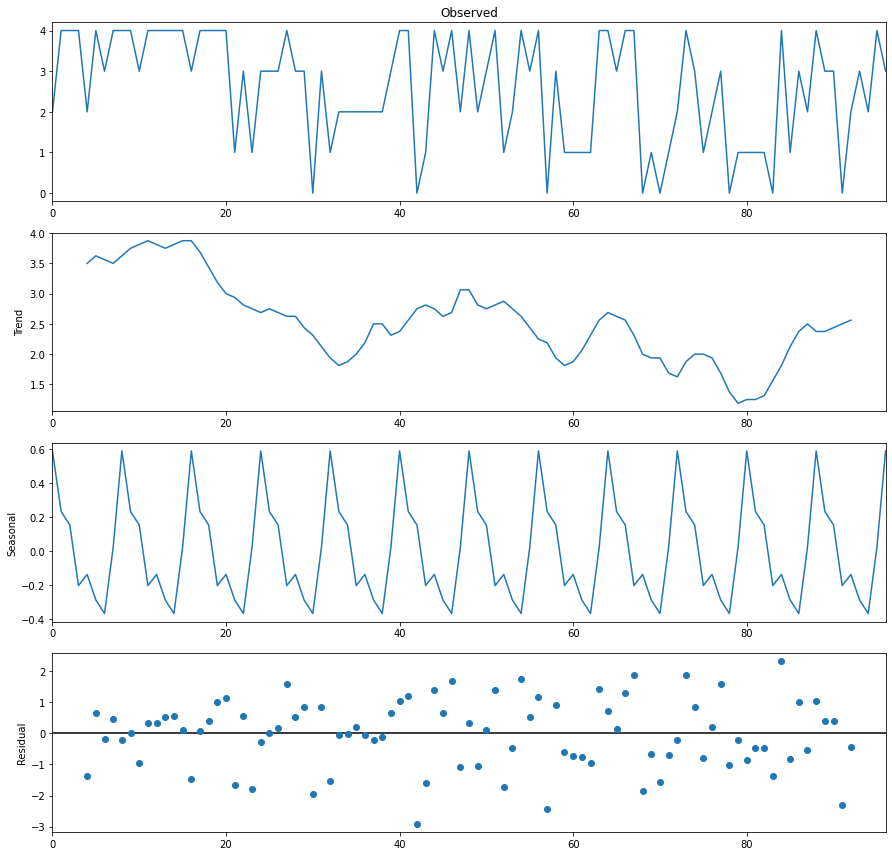

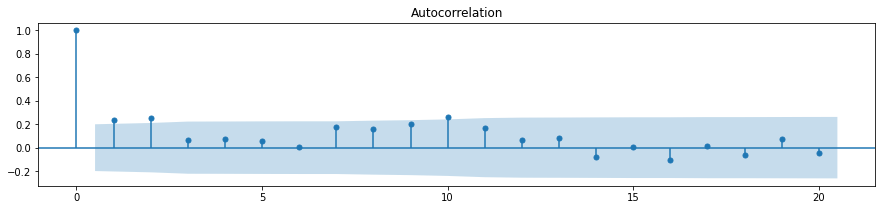

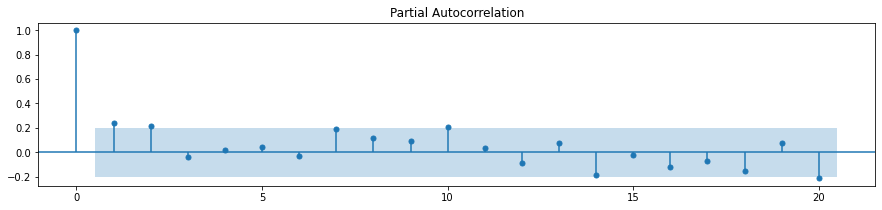

<Figure size 1080x216 with 0 Axes>

In [157]:
analysis_level = 'quadrant'
for sub in p.UnrewNamesSub:
    print(sub)
    tf = LoadTrajFromPath(outdata_path+sub+'-tf')
    len_bouts = [get_number_of_sections(bout[:, 0], analysis_level) for bout in tf.no if len(bout) >= 2]
    plt.rc("figure", figsize=(15, 3))
    plt.plot(len_bouts, '-')
    plt.title(sub)
    plt.ylabel(f'number of distinct {analysis_level} visited')
    plt.xlabel('bout')
    plt.show()
    plt.rc("figure", figsize=(12.5, 12))
    decomposition = seasonal_decompose(len_bouts, model='additive', period=8)
    decomposition.plot();
    plt.rc("figure", figsize=(15, 3))
    plot_acf(pd.Series(len_bouts))
    plot_pacf(pd.Series(len_bouts))
    plt.show()
    plt.clf()
    print("===============================================================")


In [ ]:
# Barely any auto correlation seen. Most fractions are very low. 
# Nothing significant seasonality wise 
# Nothing significant for any trend in quadrants visited (tried with other values of periodicity as well)

B5


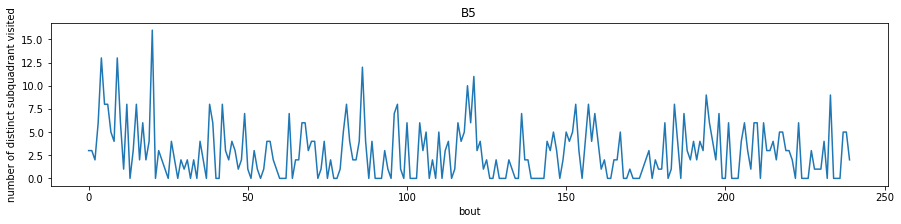

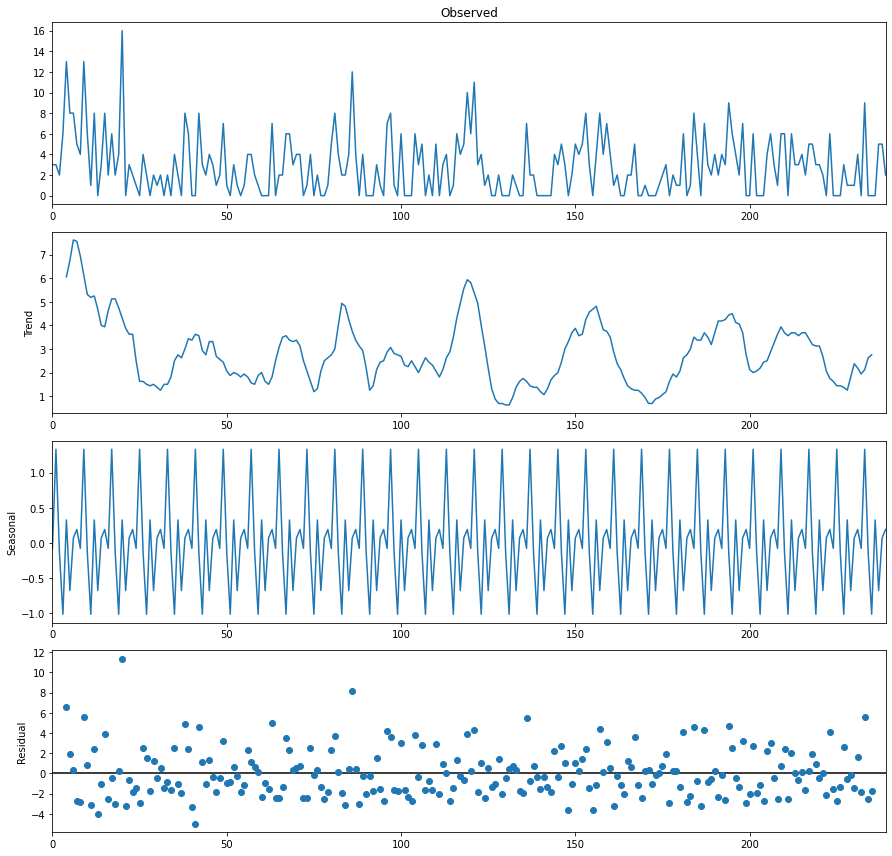

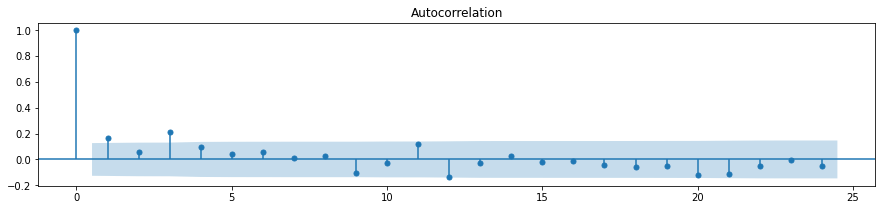

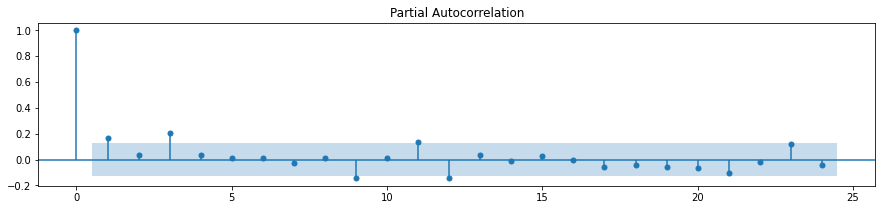

B6


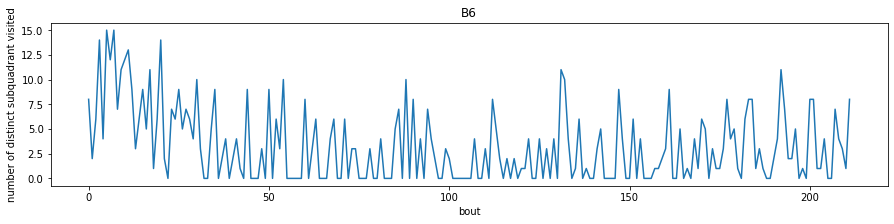

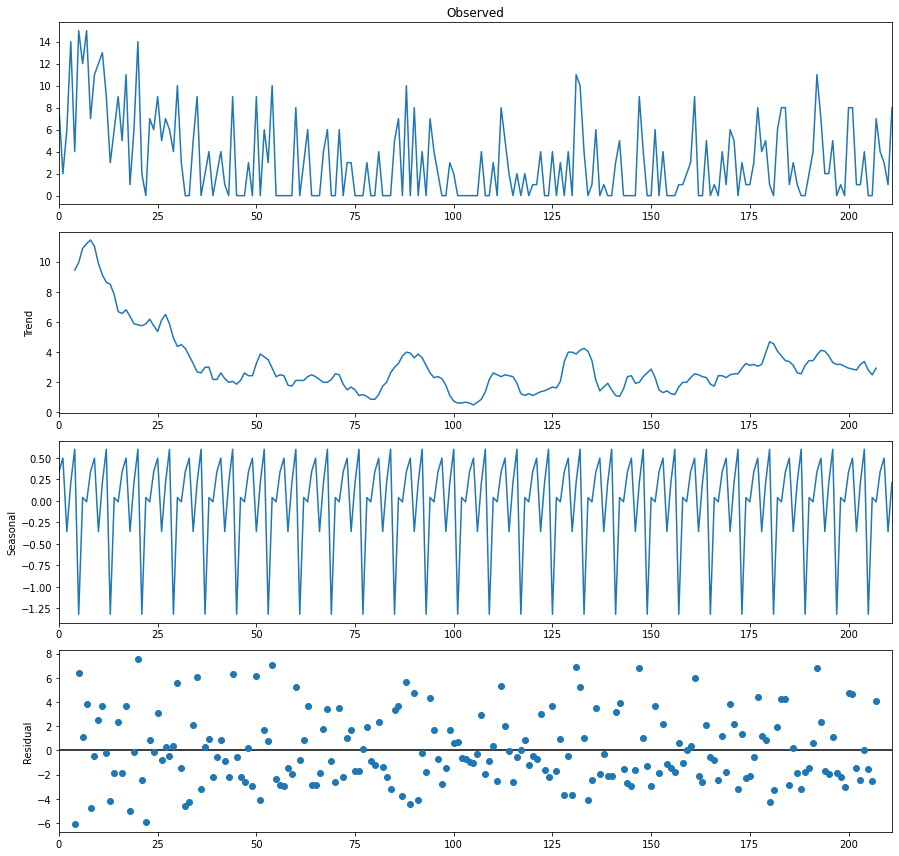

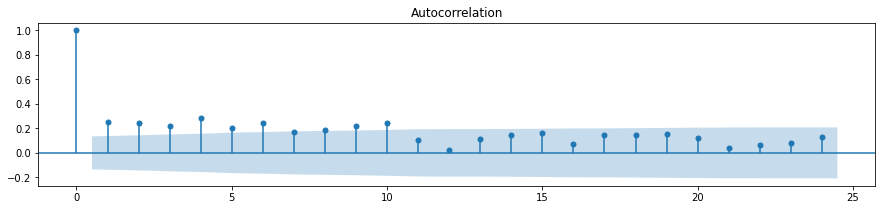

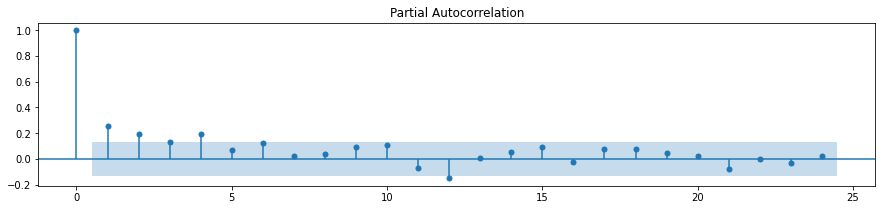

B7


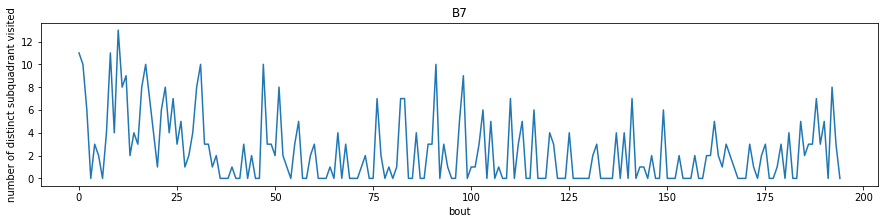

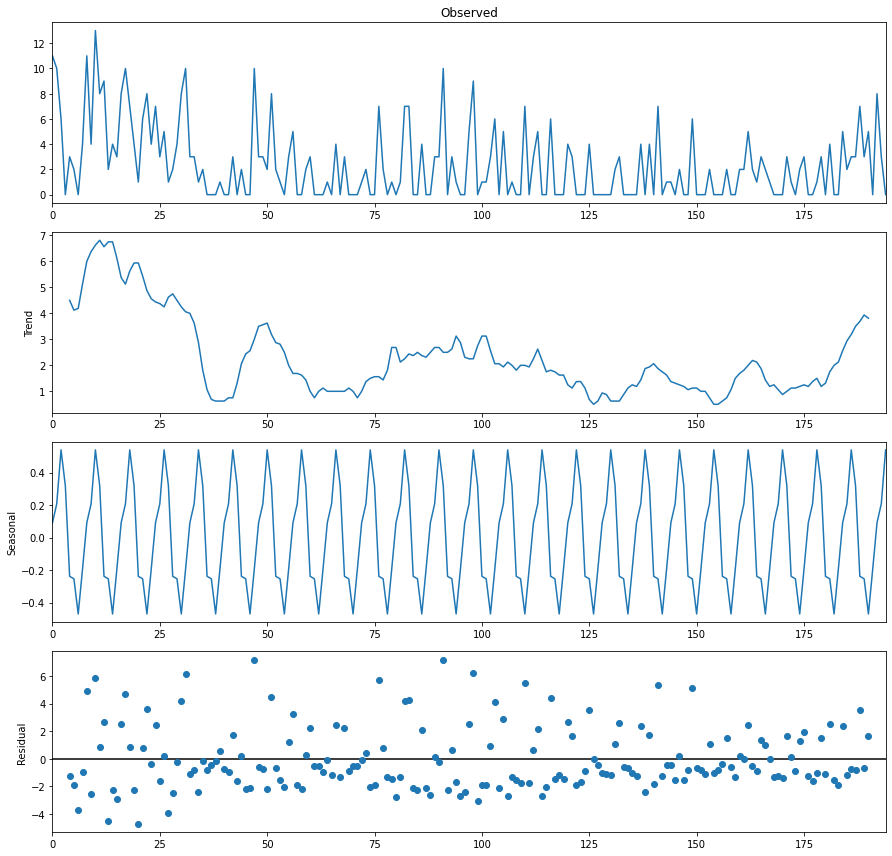

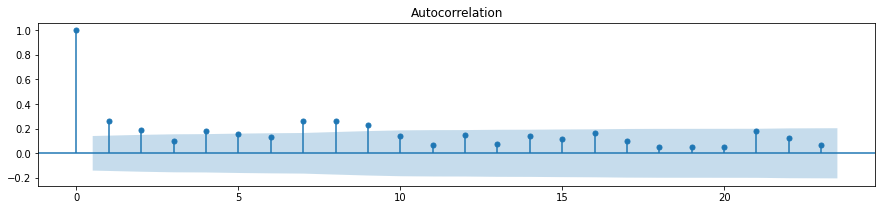

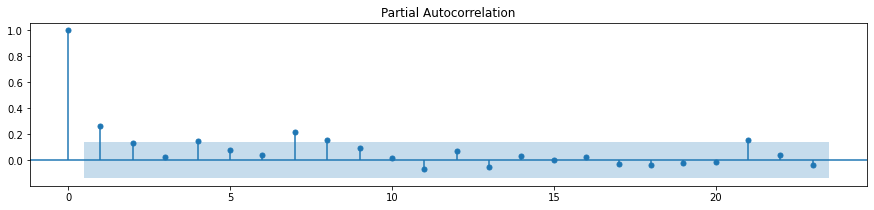

D3


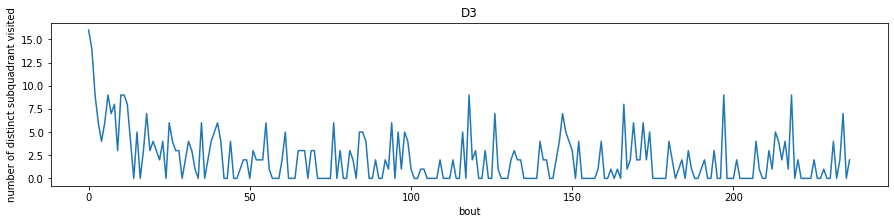

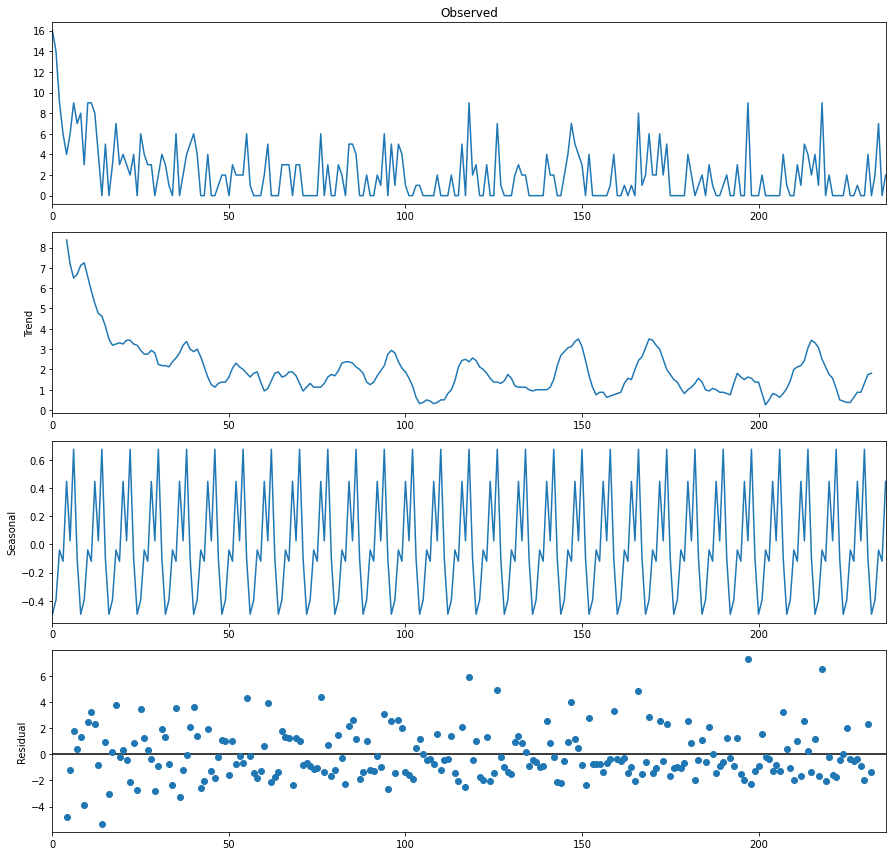

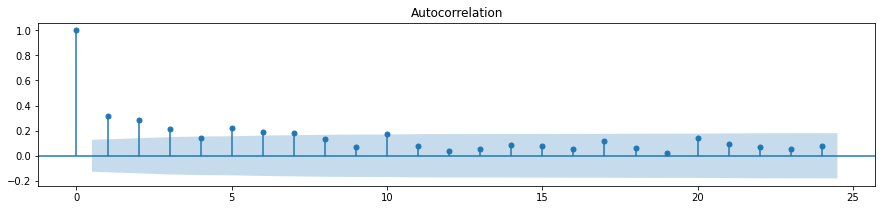

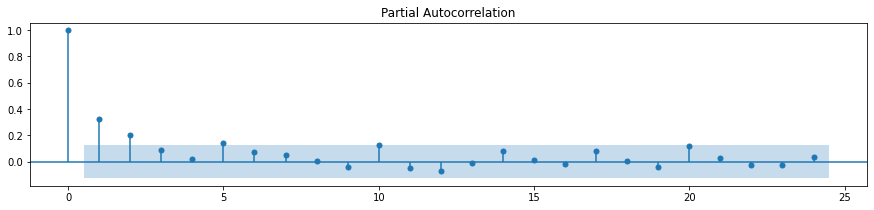

D4


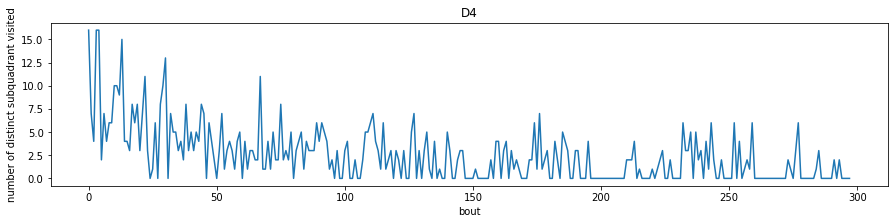

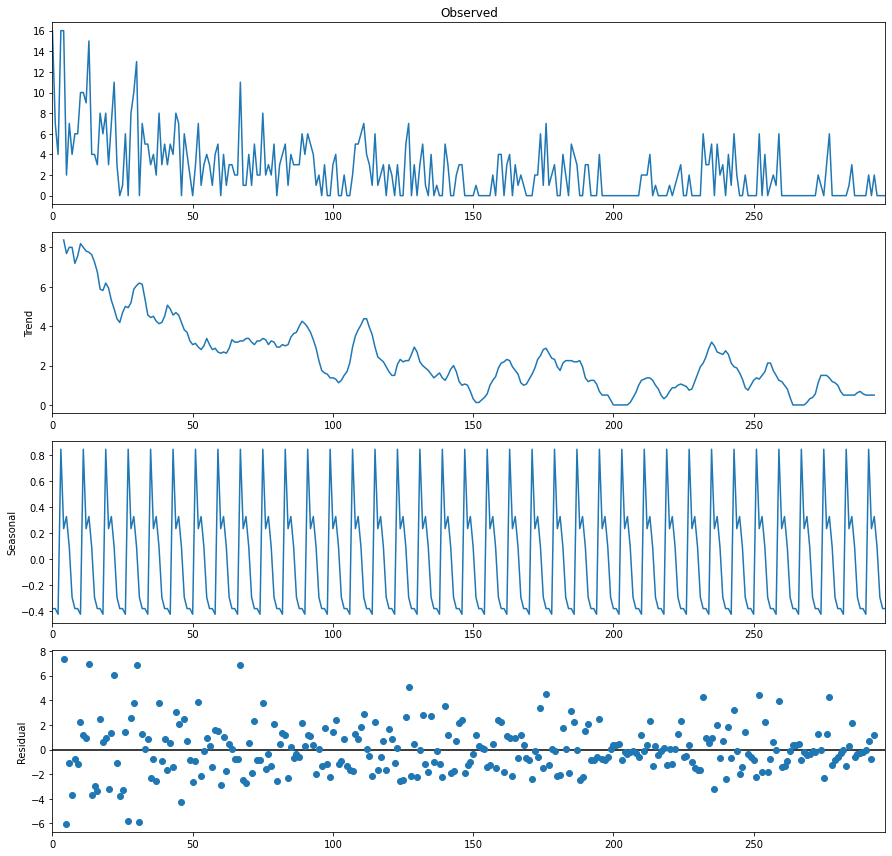

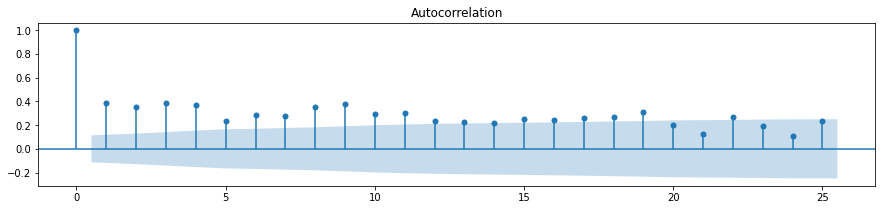

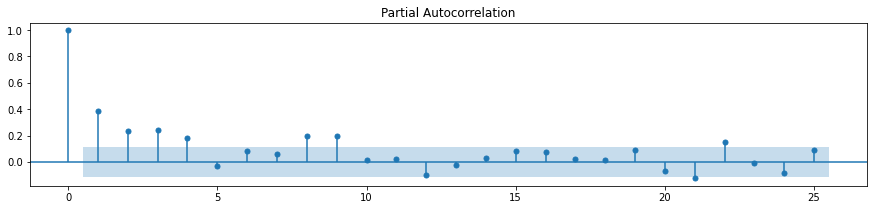

D5


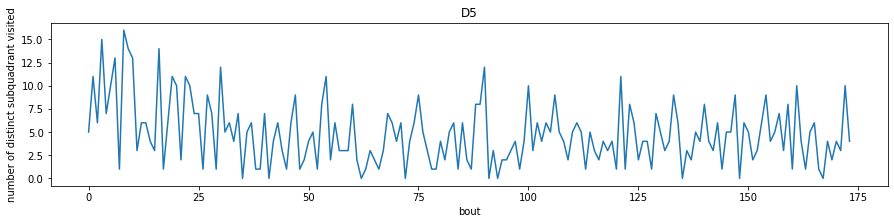

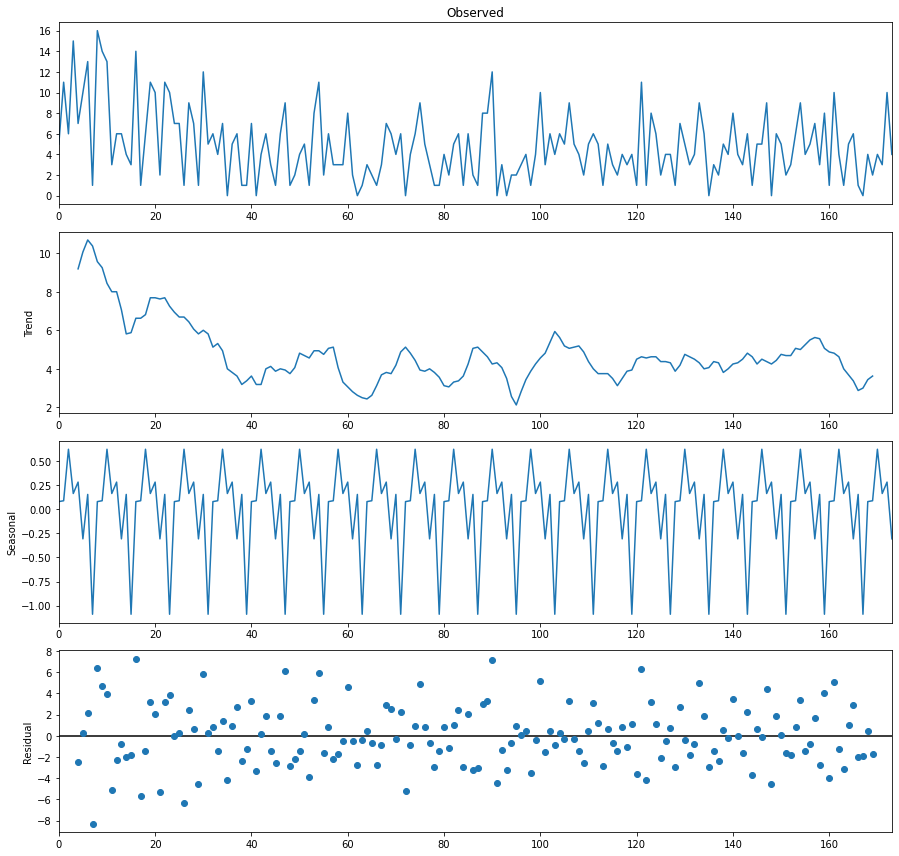

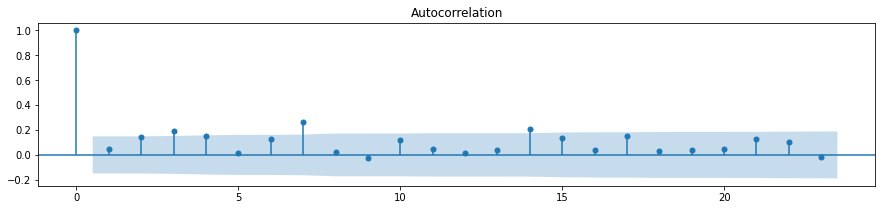

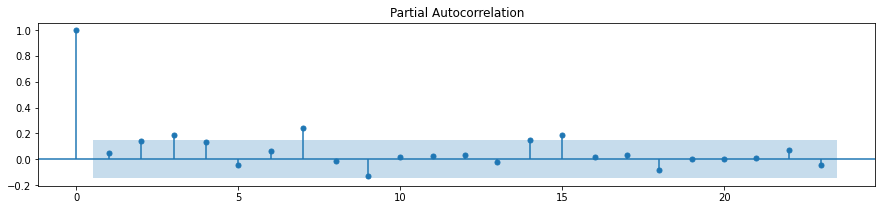

D7


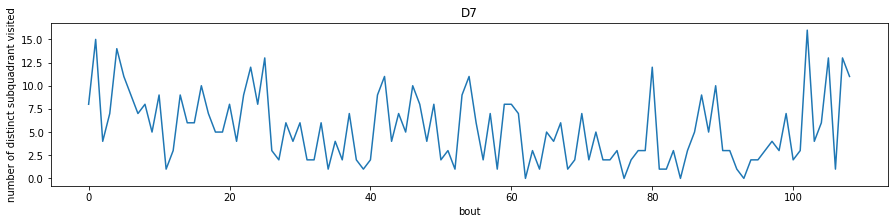

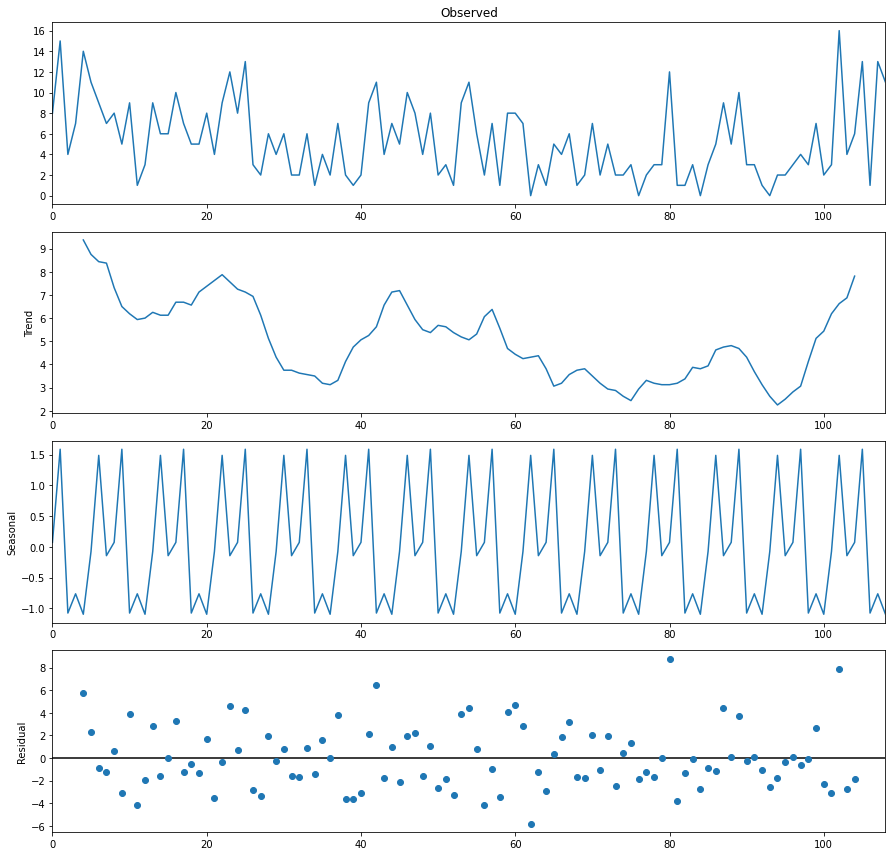

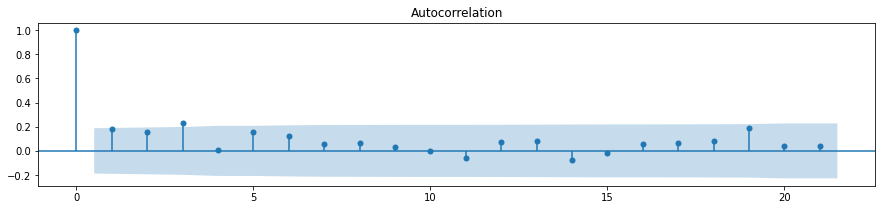

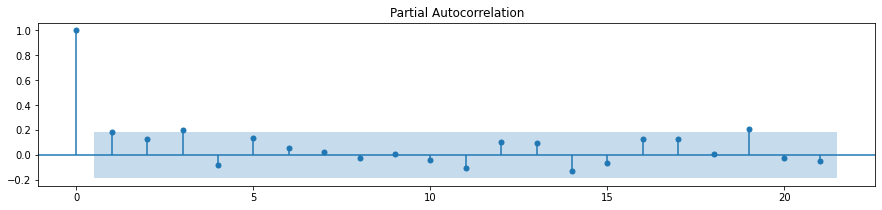

D8


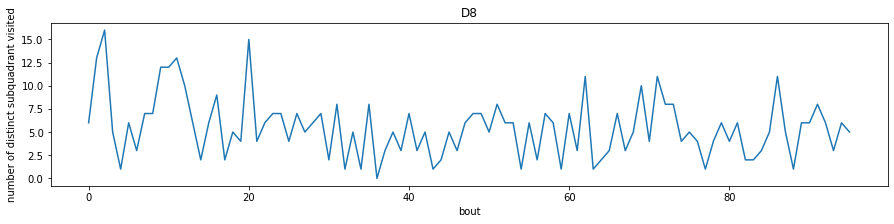

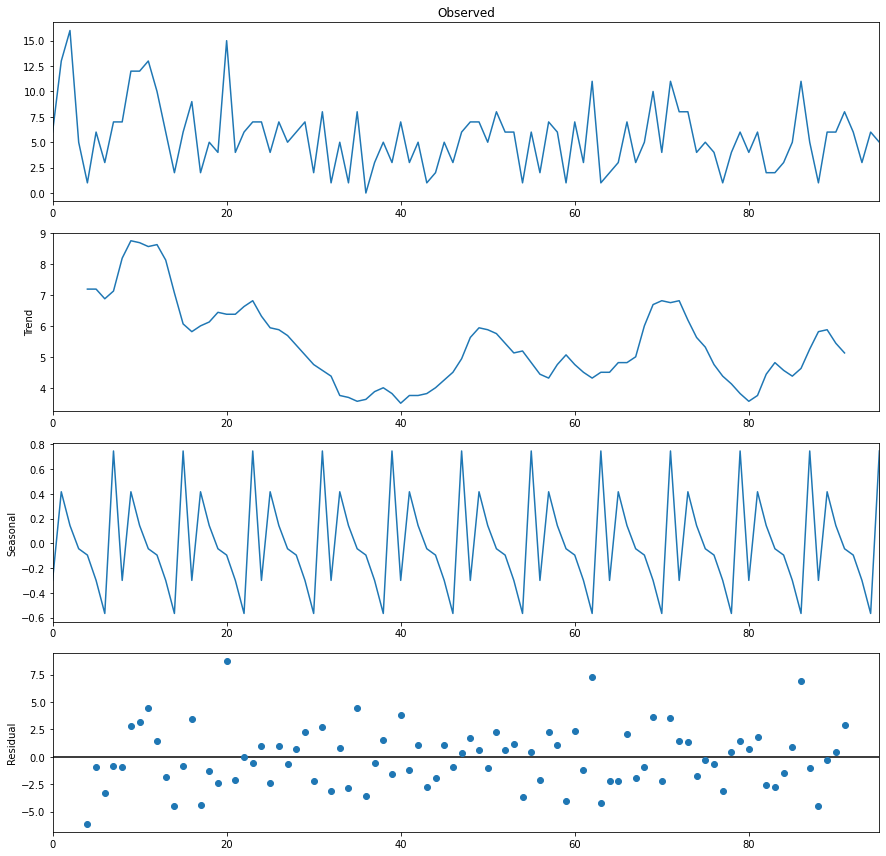

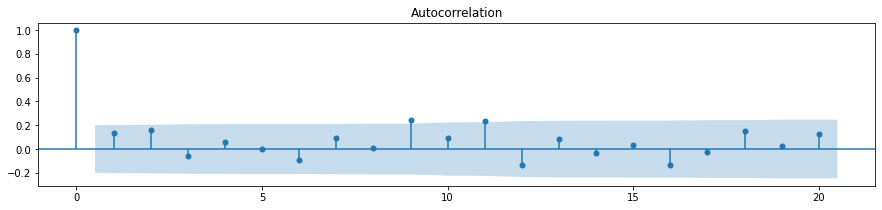

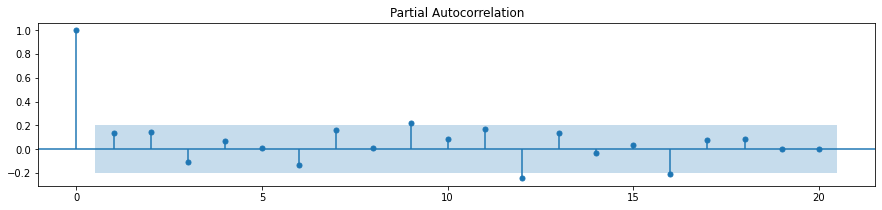

D9


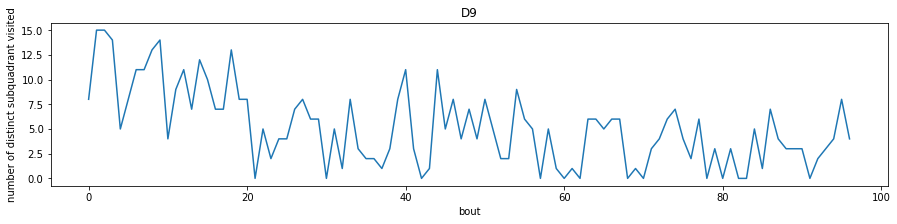

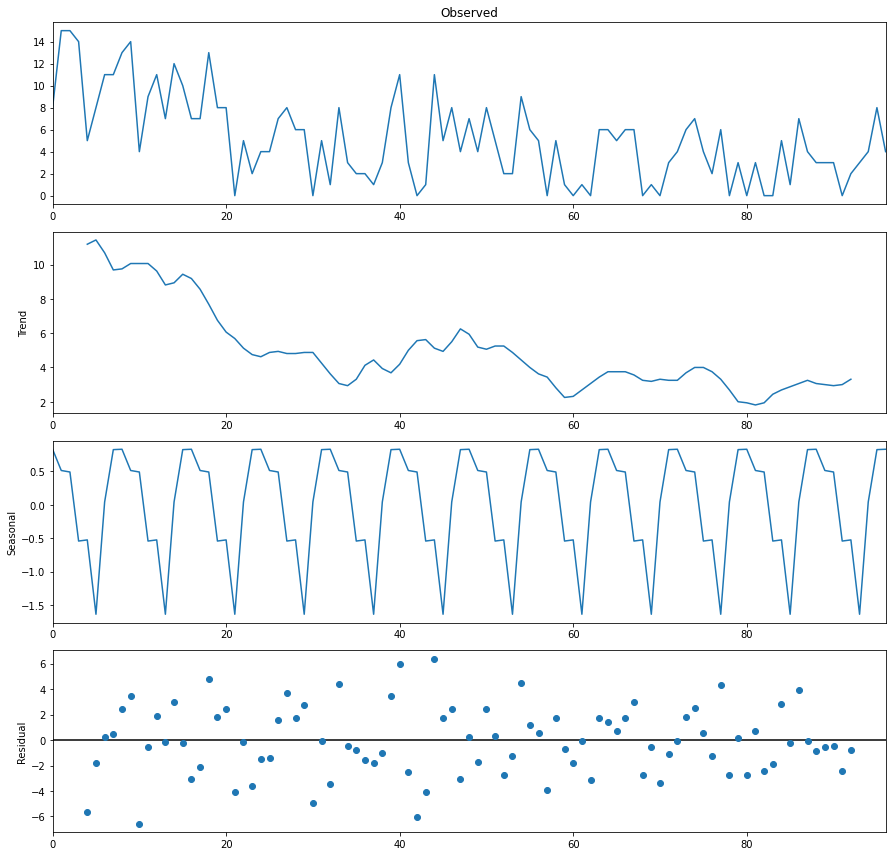

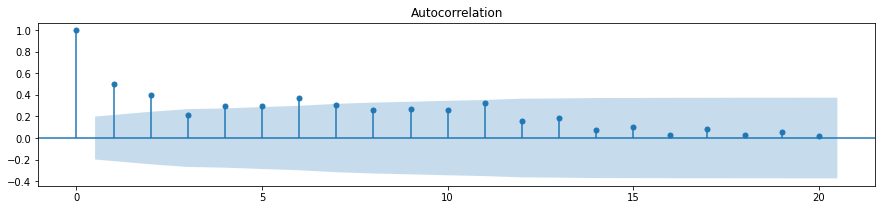

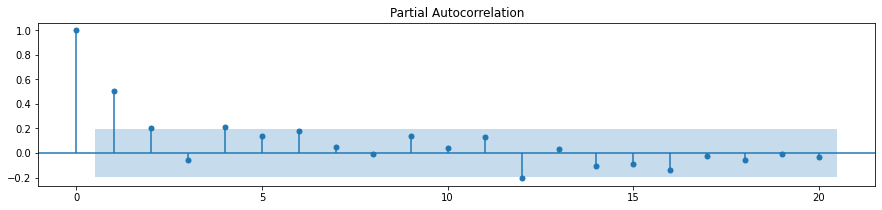

<Figure size 1080x216 with 0 Axes>

In [158]:
analysis_level = 'subquadrant'
for sub in p.UnrewNamesSub:
    print(sub)
    tf = LoadTrajFromPath(outdata_path+sub+'-tf')
    len_bouts = [get_number_of_sections(bout[:, 0], analysis_level) for bout in tf.no if len(bout) >= 2]
    plt.rc("figure", figsize=(15, 3))
    plt.plot(len_bouts, '-')
    plt.title(sub)
    plt.ylabel(f'number of distinct {analysis_level} visited')
    plt.xlabel('bout')
    plt.show()
    plt.rc("figure", figsize=(12.5, 12))
    decomposition = seasonal_decompose(len_bouts, model='additive', period=8)
    decomposition.plot();
    plt.rc("figure", figsize=(15, 3))
    plot_acf(pd.Series(len_bouts))
    plot_pacf(pd.Series(len_bouts))
    plt.show()
    plt.clf()
    print("===============================================================")


In [132]:
# Barely any auto correlation seen. Most fractions are very low. 
# Nothing significant seasonality wise 
# Some decreasing trend for subquadrants but nothing very significant

### what quadrant are they visiting in order, instead of just a total number, maybe a periodic trend

In [144]:
import itertools
def get_sections_order(tr, level):
#     print(tr)
    if level == 'quadrant':
        a = [node for node in tr if node in p.LVL_2_NODES]
    if level == 'subquadrant':
        a = [node for node in tr if node in p.LVL_4_NODES]
    b = [k for k,_g in itertools.groupby(a)] # remove duplicates when they are in the same section
    return b

B5
[5, 4, 5, 4, 6, 5, 6, 5, 4, 3, 4, 3, 4, 5, 4, 6, 5, 3, 3, 4, 5, 4, 3, 4, 3, 6, 3, 4, 3, 5, 3, 4, 3, 4, 3, 4, 5, 4, 5, 6, 5, 6, 3, 6, 4, 5, 4, 6, 5, 5, 3, 4, 3, 4, 5, 4, 6, 5, 4, 3, 5, 6, 5, 6, 5, 4, 6, 5, 3, 5, 6, 3, 4, 4, 3, 6, 5, 5, 4, 6, 3, 4, 4, 5, 4, 3, 4, 5, 6, 3, 4, 3, 6, 5, 6, 3, 4, 4, 5, 6, 5, 4, 5, 6, 4, 5, 6, 4, 3, 5, 6, 6, 5, 4, 3, 4, 5, 4, 4, 5]


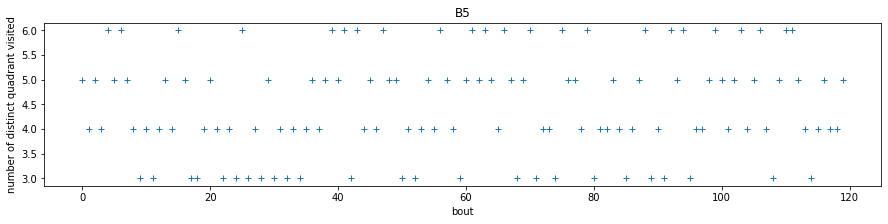

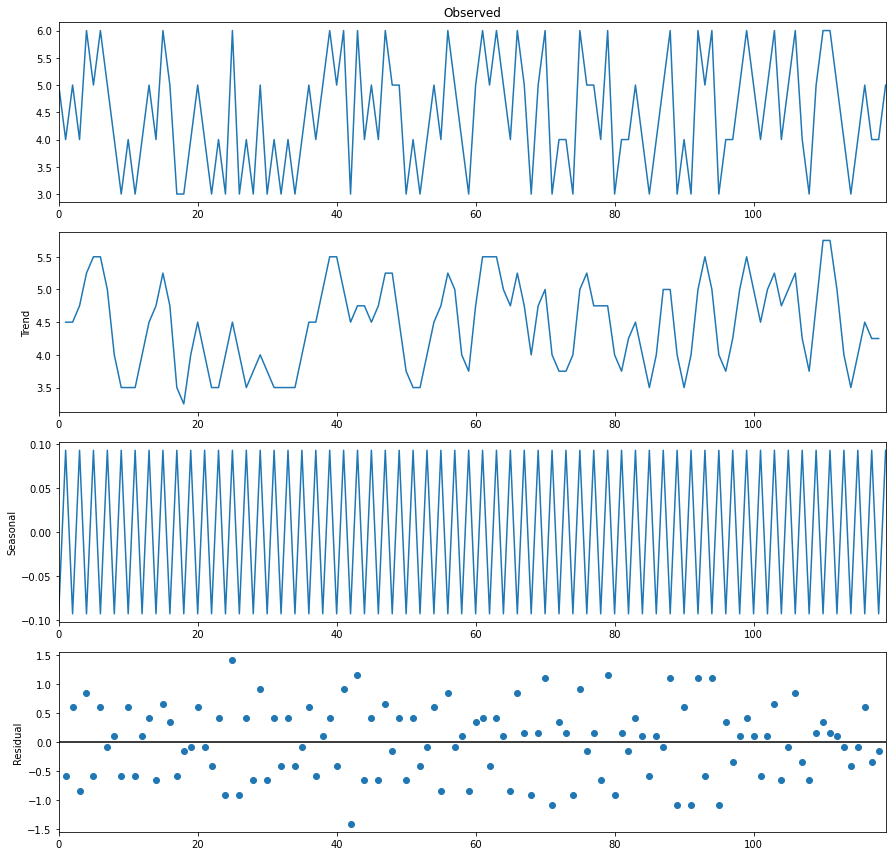

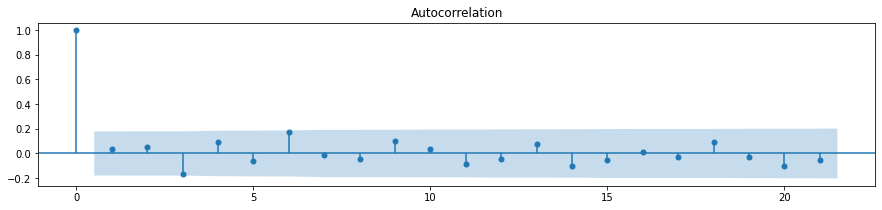

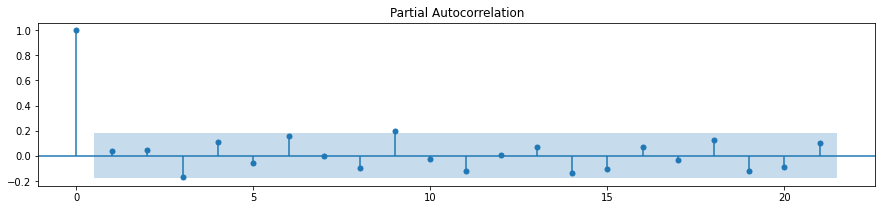

B6
[6, 5, 6, 5, 6, 6, 4, 3, 5, 6, 4, 3, 4, 6, 5, 6, 3, 4, 6, 5, 4, 5, 6, 4, 3, 4, 5, 6, 3, 4, 3, 4, 5, 6, 3, 6, 3, 4, 6, 5, 3, 5, 4, 5, 6, 5, 4, 3, 4, 4, 6, 5, 4, 3, 5, 6, 4, 3, 6, 5, 6, 4, 3, 5, 4, 5, 6, 4, 3, 4, 5, 6, 5, 5, 6, 4, 3, 4, 5, 6, 5, 6, 5, 6, 4, 6, 5, 6, 4, 5, 3, 4, 3, 4, 6, 5, 6, 5, 4, 3, 6, 4, 6, 5, 6, 6, 4, 5, 4, 5, 6, 3, 5, 4, 6, 4, 3, 5, 6, 3, 4, 6, 6, 5, 3, 5, 6, 5, 4, 3, 6, 6, 5, 6, 6, 4, 3, 5, 6, 6, 3, 4, 5, 4, 5, 6, 4, 6, 4, 3, 6, 3, 4, 6, 3, 6, 5, 6, 5, 6, 5, 4, 5, 6, 5, 4, 5, 6, 5, 3]


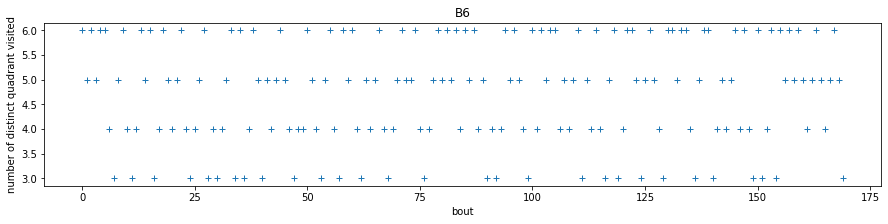

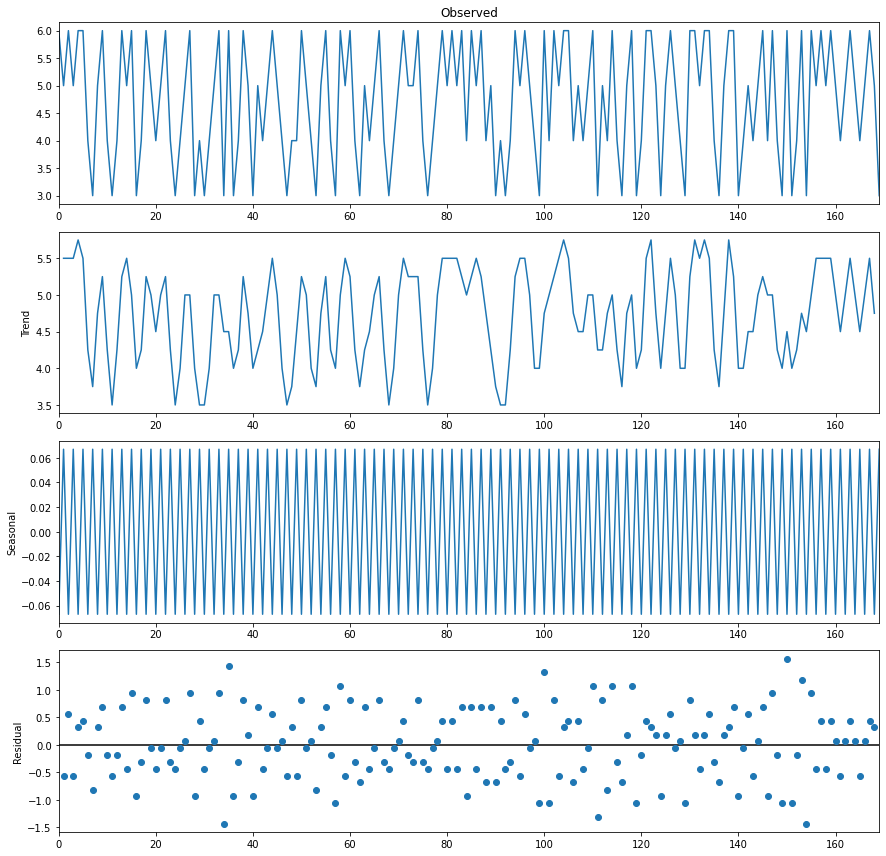

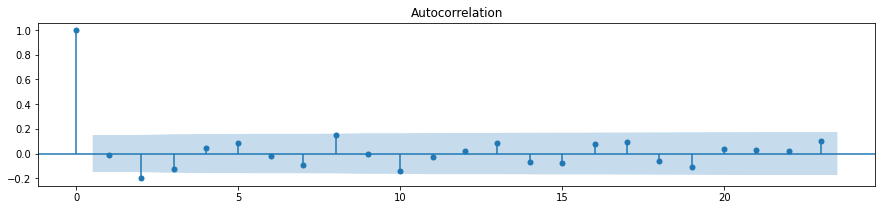

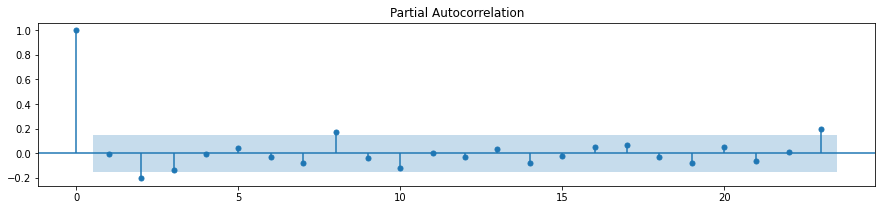

B7
[3, 4, 5, 6, 6, 5, 4, 3, 4, 6, 5, 6, 5, 6, 3, 5, 6, 4, 3, 4, 5, 3, 6, 3, 4, 3, 6, 5, 6, 4, 4, 6, 3, 4, 3, 6, 5, 4, 3, 3, 6, 3, 5, 3, 6, 3, 4, 3, 4, 5, 5, 4, 4, 5, 4, 5, 6, 3, 6, 4, 3, 4, 6, 3, 5, 4, 5, 4, 5, 3, 4, 3, 4, 3, 4, 3, 4, 4, 5, 3, 5, 4, 5, 4, 3, 4, 5, 3, 4, 5, 4, 3, 4, 5, 5, 4, 5, 5, 4, 4, 5, 3, 4, 3, 4, 5, 3, 4, 5]


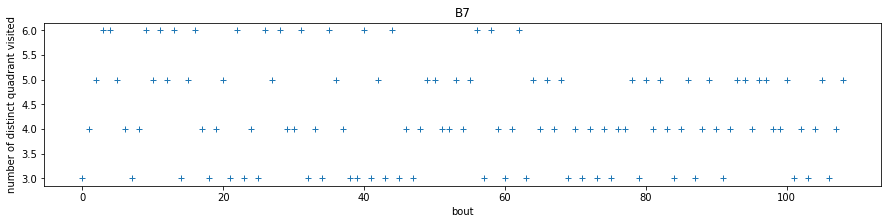

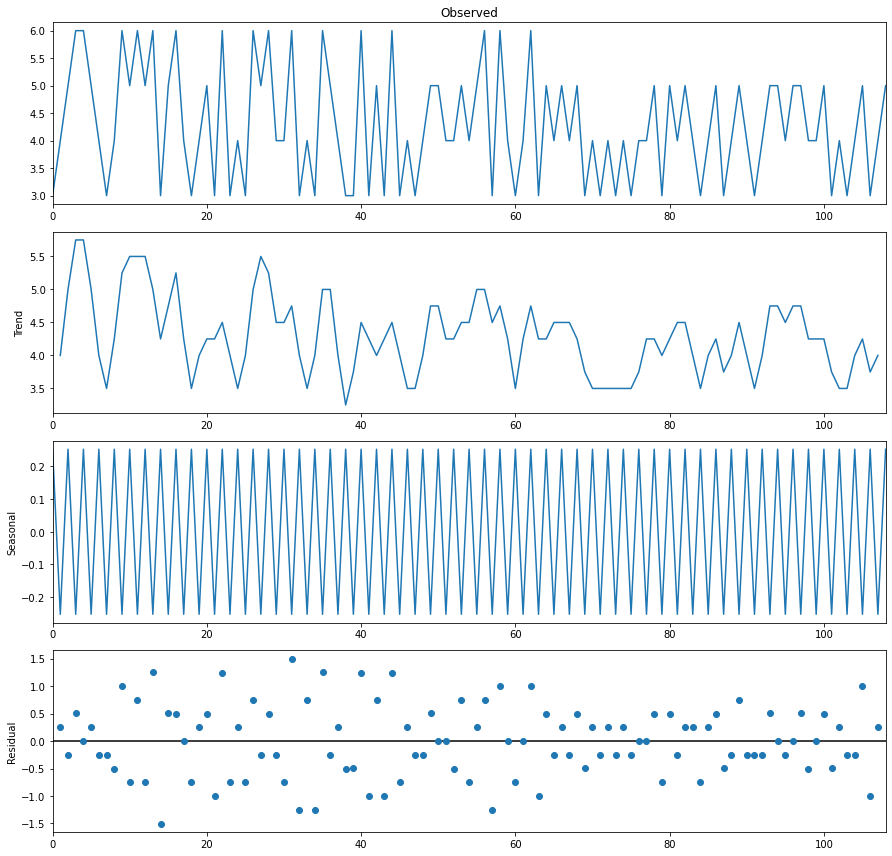

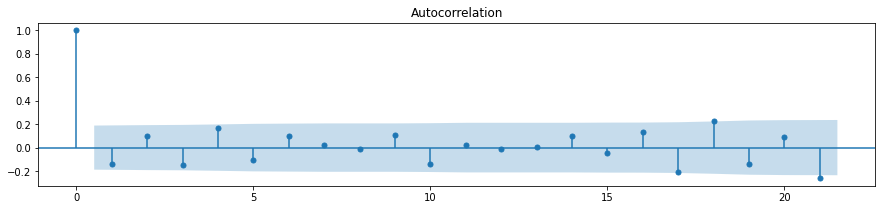

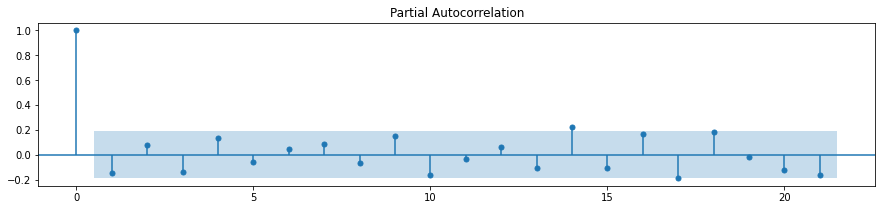

D3
[6, 4, 3, 5, 6, 5, 6, 5, 6, 4, 3, 4, 3, 4, 4, 3, 4, 3, 4, 3, 4, 6, 3, 4, 5, 3, 4, 6, 4, 3, 4, 4, 4, 5, 4, 6, 5, 3, 4, 4, 6, 5, 5, 4, 6, 4, 6, 6, 3, 4, 6, 3, 5, 6, 6, 5, 3, 5, 4, 4, 3, 4, 5, 5, 6, 5, 6, 5, 4, 3, 5, 5, 6, 5, 4, 4, 5, 6, 5, 3, 4, 3, 4, 3, 4, 3, 5, 6, 6, 5, 6, 5, 6, 5, 6, 5, 4, 3, 5, 5, 4, 3, 5, 6, 5, 4, 5, 3, 5, 4, 5, 4]


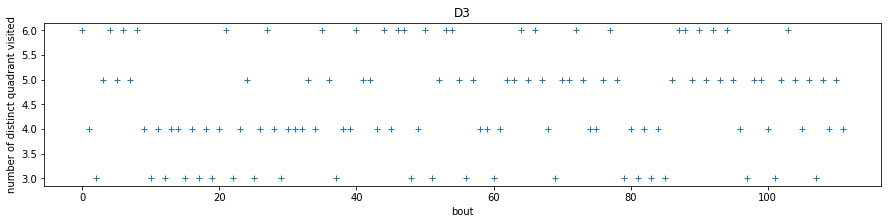

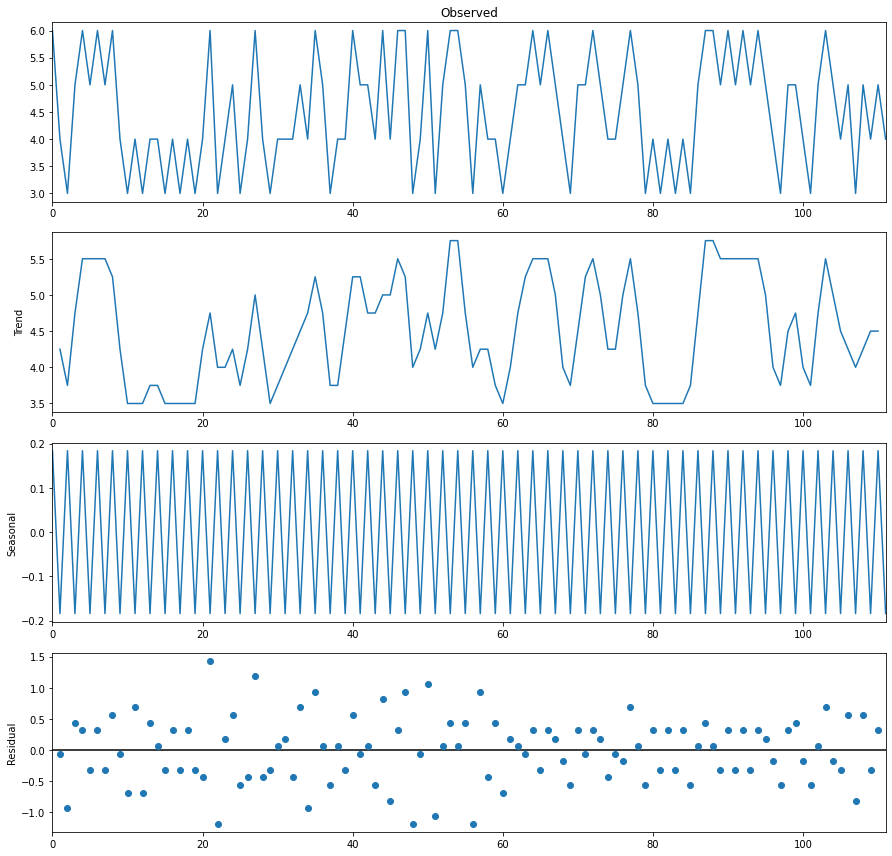

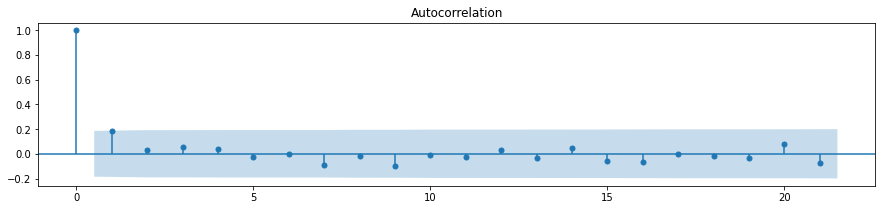

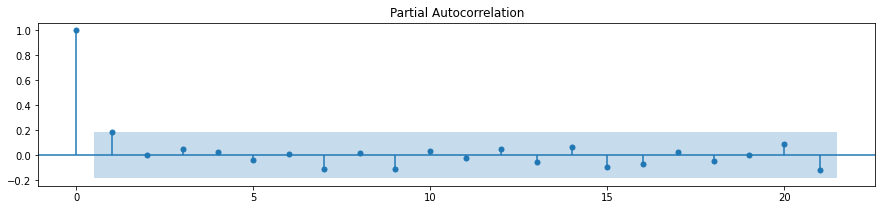

D4
[5, 6, 3, 5, 6, 3, 4, 3, 4, 3, 4, 6, 5, 6, 5, 4, 3, 4, 6, 3, 6, 5, 4, 3, 4, 3, 6, 5, 4, 3, 5, 6, 5, 4, 3, 5, 3, 4, 6, 5, 6, 3, 4, 3, 4, 5, 6, 3, 4, 3, 4, 5, 6, 5, 4, 3, 4, 3, 6, 3, 3, 4, 3, 6, 5, 6, 5, 4, 3, 4, 5, 6, 4, 6, 4, 3, 6, 3, 4, 5, 6, 5, 3, 4, 3, 4, 6, 3, 4, 4, 5, 6, 4, 4, 3, 6, 5, 3, 3, 6, 4, 5, 4, 6, 5, 6, 5, 4, 5, 6, 5, 4, 6, 5, 6, 3, 4, 6, 5, 3, 4, 5, 3, 6, 5, 3, 4, 5, 4, 6, 4, 6, 3, 4, 5, 5, 4, 3, 3, 4, 6, 4, 5, 6, 3, 6, 4, 5, 4, 6, 5, 3, 4, 6, 5, 3, 4, 6, 5, 3, 4, 6, 5, 6, 3, 4, 6, 3, 6, 4, 4, 3, 4, 4, 3, 4, 5, 5, 4, 6, 4, 6, 5, 3, 5, 6, 3, 6, 4]


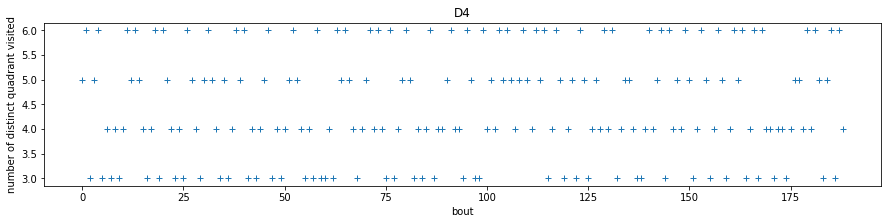

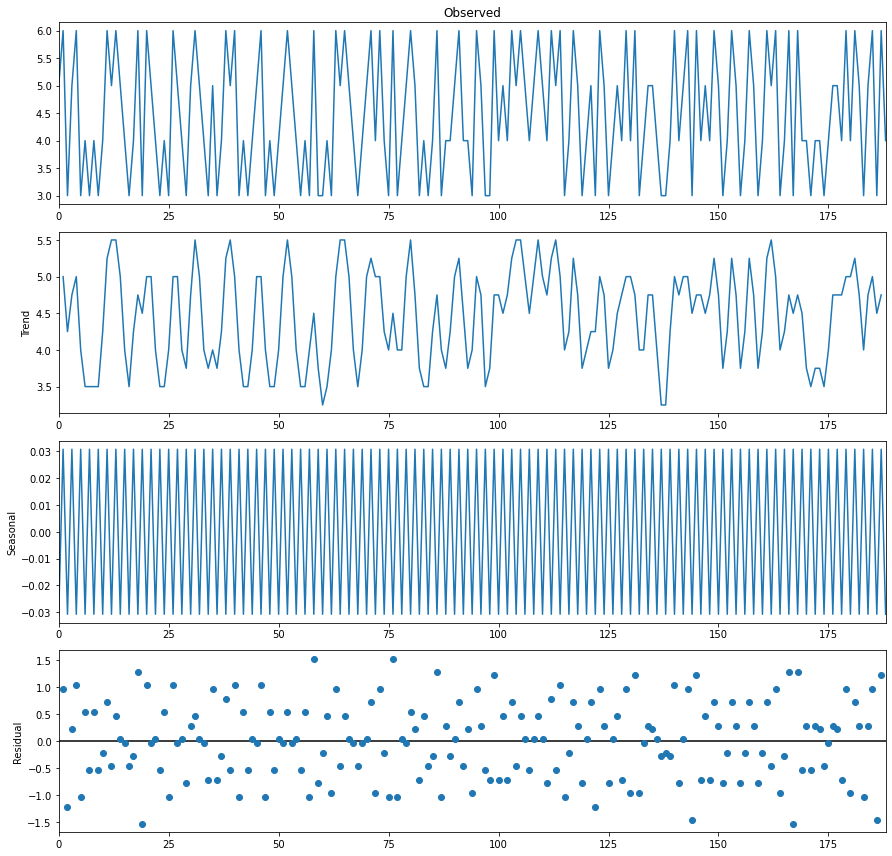

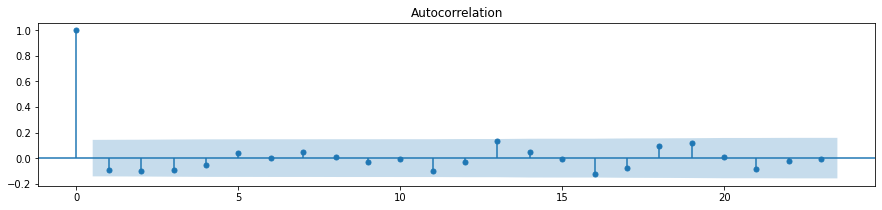

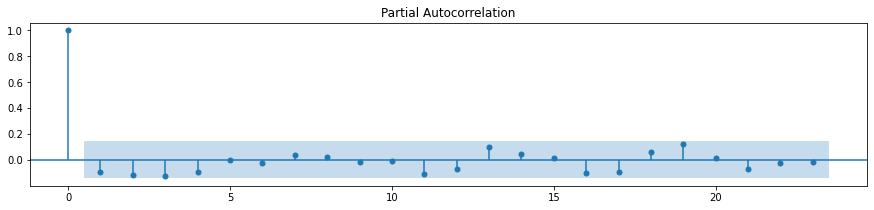

<Figure size 1080x216 with 0 Axes>

In [155]:
analysis_level = 'quadrant'
for sub in p.UnrewNamesSub[:5]:
    print(sub)
    tf = LoadTrajFromPath(outdata_path+sub+'-tf')
    section_bouts = []
    for bout in tf.no[:50]:
        if len(bout) >= 2:
            section_bouts.extend(get_sections_order(bout[:, 0], analysis_level))
    print(section_bouts)
    plt.rc("figure", figsize=(15, 3))
    plt.plot(section_bouts, '+')
    plt.title(sub)
    plt.ylabel(f'number of distinct {analysis_level} visited')
    plt.xlabel('bout')
    plt.show()
    plt.rc("figure", figsize=(12.5, 12))
    decomposition = seasonal_decompose(section_bouts, model='additive', period=2)
    decomposition.plot();
    plt.rc("figure", figsize=(15, 3))
    plot_acf(pd.Series(section_bouts))
    plot_pacf(pd.Series(section_bouts))
    plt.show()
    plt.clf()
    print("===============================================================")


In [145]:
# Not much. 
# Any order-2 periodicity or something, if at all, can just be explained by regular exploration heuristics.